In [1]:
# pip install folium

# Imports librairies et jeu de données

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import folium
import seaborn as sns
import numpy as np
import pickle
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import OneHotEncoder, StandardScaler

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score

pd.set_option("display.max_rows", 101)
pd.options.display.max_columns = 999

In [3]:
data = pd.read_csv('data/data_cleaned.csv')

In [4]:
data.shape

(74705, 30)

In [5]:
data.dropna(inplace=True)

In [6]:
data.shape

(74705, 30)

In [7]:
data.set_index('customer_unique_id', inplace=True)

In [8]:
data.head()

,Cat_la_plus_achetee,customer_zip_code_prefix,customer_city,customer_state,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,order_purchase_timestamp,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Moy_Paiment,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,home,7787,Other,SP,1.0,4.866765,7.0,2018-05-10 10:56:27,10.0,3.0,115.0,5.0,credit_card,8.0,-23.340262,-46.831085,129.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,health_beauty,6053,osasco,SP,1.0,2.939162,4.0,2018-05-07 11:11:27,11.0,0.0,118.0,4.0,credit_card,1.0,-23.559044,-46.788516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.9,0.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,office,88115,sao jose,SC,1.0,4.234107,26.0,2017-03-10 21:05:03,21.0,4.0,541.0,3.0,credit_card,8.0,-27.543010,-48.634938,0.0,0.0,0.0,69.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,electronics,18040,sorocaba,SP,1.0,5.192957,14.0,2017-11-14 19:45:42,19.0,1.0,292.0,5.0,credit_card,6.0,-23.505588,-47.469820,0.0,0.0,0.0,0.0,180.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0004bd2a26a76fe21f786e4fbd80607f,garden_pets,5036,sao paulo,SP,1.0,5.036953,2.0,2018-04-05 19:33:16,19.0,3.0,150.0,4.0,credit_card,8.0,-23.515693,-46.690031,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,154.0,0.0,0.0,0.0


In [9]:
data['order_purchase_timestamp'] = data['order_purchase_timestamp'].astype(
    'datetime64')

In [10]:
data.select_dtypes(['object']).nunique()

Cat_la_plus_achetee    13
customer_city          98
customer_state         22
Moy_Paiment             4
dtype: int64

In [11]:
data.dtypes

Cat_la_plus_achetee                    object
customer_zip_code_prefix                int64
customer_city                          object
customer_state                         object
Nb_pdts                               float64
Tot_moy_achats                        float64
Delai_Moy_Commande                    float64
order_purchase_timestamp       datetime64[ns]
heure_achat                           float64
jour_achat                            float64
delai_dernier_achat                   float64
Note_Moy_Com                          float64
Moy_Paiment                            object
Facilités                             float64
geolocation_lat                       float64
geolocation_lng                       float64
('price', 'home')                     float64
('price', 'appliances')               float64
('price', 'construction')             float64
('price', 'office')                   float64
('price', 'electronics')              float64
('price', 'arts')                 

In [12]:
data.columns

Index(['Cat_la_plus_achetee', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'Nb_pdts', 'Tot_moy_achats', 'Delai_Moy_Commande',
       'order_purchase_timestamp', 'heure_achat', 'jour_achat',
       'delai_dernier_achat', 'Note_Moy_Com', 'Moy_Paiment', 'Facilités',
       'geolocation_lat', 'geolocation_lng', '('price', 'home')',
       '('price', 'appliances')', '('price', 'construction')',
       '('price', 'office')', '('price', 'electronics')', '('price', 'arts')',
       '('price', 'fashion')', '('price', 'health_beauty')',
       '('price', 'sports_leisure')', '('price', 'garden_pets')',
       '('price', 'auto')', '('price', 'food_drinks')', '('price', 'other')'],
      dtype='object')

In [13]:
data.drop(['customer_zip_code_prefix','Cat_la_plus_achetee'], 
          axis=1, 
          inplace=True)

In [14]:
data.drop(['customer_city', 'customer_state'], 
          axis=1, 
          inplace=True)

In [15]:
data.select_dtypes(['object']).nunique()

Moy_Paiment    4
dtype: int64

# Echantillon réduit

In [16]:
# from sklearn.cluster import KMeans
# from scipy.cluster.hierarchy import linkage, dendrogram

# # Réduction du DataFrame avec K-means
# k = 500  # Nombre de centroïdes souhaité
# kmeans = KMeans(n_clusters=k, random_state=42)
# kmeans.fit(data)

# # Obtention des centroïdes
# centroids = kmeans.cluster_centers_

# # Attribution des clusters aux données d'origine
# data['cluster'] = kmeans.labels_

# # Application de la classification ascendante hiérarchique (CAH) sur les centroïdes
# linked = linkage(centroids, method='ward')

# # Affichage du dendrogramme
# plt.figure(figsize=(12, 6))
# dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
# plt.title('Dendrogramme de la CAH sur les centroïdes')
# plt.xlabel('Centroïdes')
# plt.ylabel('Distance')
# plt.show()


## Préparation

In [17]:
#X=data.copy()
data_reduce = data.sample(10000, random_state=1).copy()
X = data_reduce.copy()
categorical_columns = X.select_dtypes(['category','object']).columns
numerical_columns = X.select_dtypes(['int32','float64']).columns

ohe = OneHotEncoder(sparse=False)
ss = StandardScaler()
X[numerical_columns] = ss.fit_transform(X[numerical_columns])
ohe.fit(X[categorical_columns])

OneHotEncoder(sparse=False)

In [18]:
X = pd.merge(X[numerical_columns], 
          pd.DataFrame(columns = ohe.get_feature_names().tolist(),
              data = ohe.fit_transform(X[categorical_columns])).set_index(X.index),
        left_index = True, right_index = True)

In [19]:
X.head()

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')",x0_boleto,x0_credit_card,x0_debit_card,x0_voucher
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,
d918450664046ceedf2b05206d8553dc,-0.24632,0.887239,1.827623,0.407418,0.106903,0.349561,-1.682750,-0.305208,-1.663843,-1.342998,-0.252348,-0.204286,-0.105327,-0.175198,-0.238526,-0.207191,2.544971,-0.286819,-0.246687,-0.178706,-0.161931,0.0,-0.171071,0.0,1.0,0.0,0.0
47536cd28cca4c60e0a137015f51eced,-0.24632,-1.711562,0.521050,-2.613708,1.623260,0.526376,0.653294,-0.707291,-0.346213,-1.421344,-0.252348,-0.204286,-0.105327,-0.175198,0.028529,-0.207191,-0.228151,-0.286819,-0.246687,-0.178706,-0.161931,0.0,-0.171071,0.0,1.0,0.0,0.0
1c3d71e403c34f60c6566d08b451c138,-0.24632,1.461695,-0.524208,-0.347864,0.612356,0.961614,0.653294,2.107290,0.374339,0.622682,-0.252348,-0.204286,-0.105327,-0.175198,-0.238526,-0.207191,-0.228151,2.810534,-0.246687,-0.178706,-0.161931,0.0,-0.171071,0.0,1.0,0.0,0.0
b4cfda9f06bbc32d7bef85da0e3bdfd1,-0.24632,0.845726,-0.524208,1.540340,-0.904002,0.743995,0.653294,0.498958,-1.616498,-1.317494,-0.252348,-0.204286,-0.105327,-0.175198,-0.238526,-0.207191,-0.228151,-0.286819,2.526312,-0.178706,-0.161931,0.0,-0.171071,0.0,1.0,0.0,0.0
2b623f6a231252cec7fbafd865725b5f,-0.24632,-0.495503,-0.262893,-0.725504,1.623260,-1.194174,-0.125387,-0.707291,-0.424988,-0.107581,-0.252348,0.901971,-0.105327,-0.175198,-0.238526,-0.207191,-0.228151,-0.286819,-0.246687,-0.178706,-0.161931,0.0,-0.171071,1.0,0.0,0.0,0.0


## PCA Transformation 

In [20]:
pca = PCA(random_state=1)

In [21]:
pca.fit(X)

PCA(random_state=1)

In [22]:
X.shape

(10000, 27)

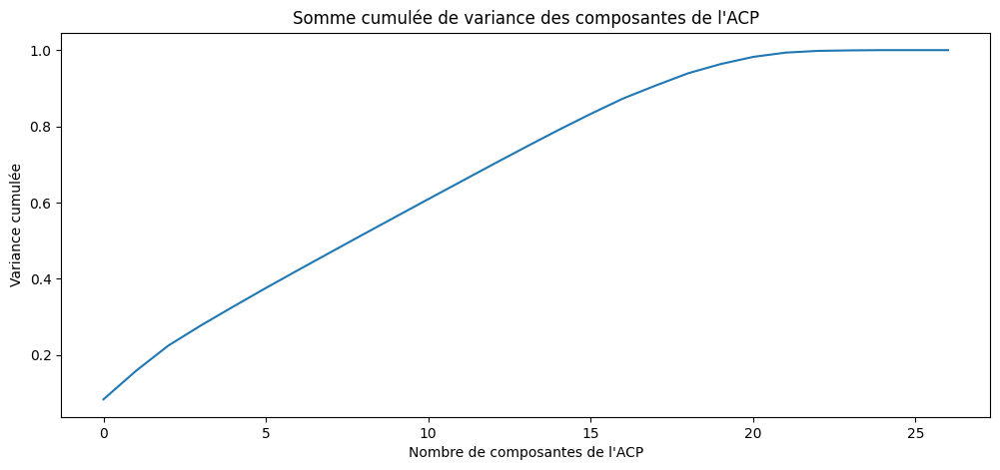

In [23]:
plt.figure(figsize=(12,5))
plt.title('Somme cumulée de variance des composantes de l\'ACP')
plt.xlabel('Nombre de composantes de l\'ACP')
plt.ylabel('Variance cumulée')
plt.plot(list(range(X.shape[1])),
         np.cumsum(pca.explained_variance_ratio_))


In [24]:
np.cumsum(pca.explained_variance_ratio_)[18]

0.9393662755213927

avec 19 features on a 93 % de la variance totale

In [25]:
colonnes_pca = X.columns

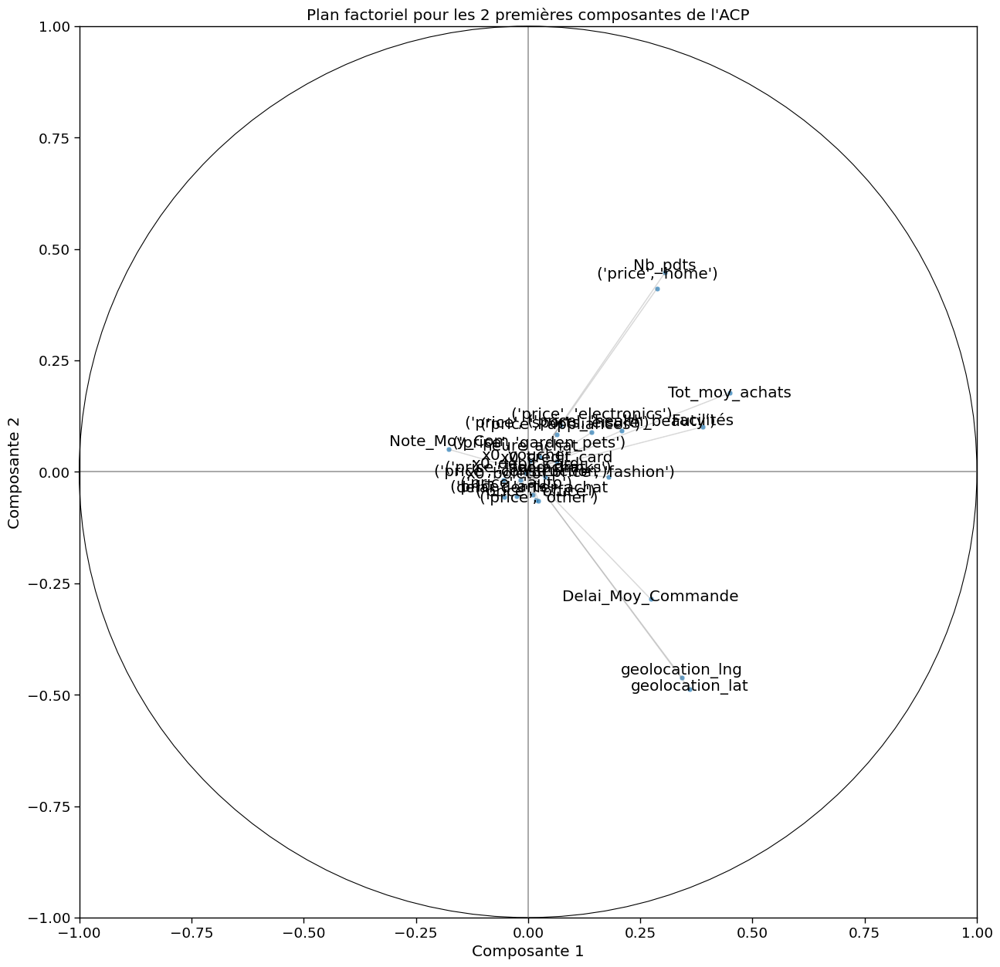

In [26]:
from matplotlib.patches import Circle
sns.set_context("paper", font_scale=1.5) 
plt.figure(figsize=(15,15))
chaine = "Plan factoriel pour les 2 premières composantes de l'ACP"
plt.title(chaine)
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')
ax = plt.gca()
ax.add_patch(Circle([0,0], radius=1, color='black', fill=False, linestyle='-', 
                    clip_on=False))
ax.set_xlim(-1,1)
ax.set_ylim(-1,1)
x_pca = pca.components_[0,:]
y_pca = pca.components_[1,:]

sns.scatterplot(x = x_pca,
                y = y_pca,
               alpha = 0.7)
plt.plot([-1,1],[0,0], color='grey', alpha=0.8)
plt.plot([0,0],[-1,1], color='grey', alpha=0.8)

i = 0
for x,y,colonne in zip(x_pca,y_pca, colonnes_pca):

    plt.annotate(colonne, 
                 (x,y), 
                 textcoords="offset points", 
                 xytext=(0,5+np.random.randint(-10,10)),
                 ha='center') 
    ax.arrow(0, 0, x, y, head_width=0, head_length=0, fc='grey', ec='grey',
             alpha=0.2)


sns.set_context("paper", font_scale=1) 

In [27]:
x_show = pca.transform(X.select_dtypes(['float64','int32']))[:,0]

y_show = pca.transform(X.select_dtypes(['float64','int32']))[:,1]

z_show = pca.transform(X.select_dtypes(['float64','int32']))[:,2]

In [28]:
X_pca = pca.transform(X)[:,:19]

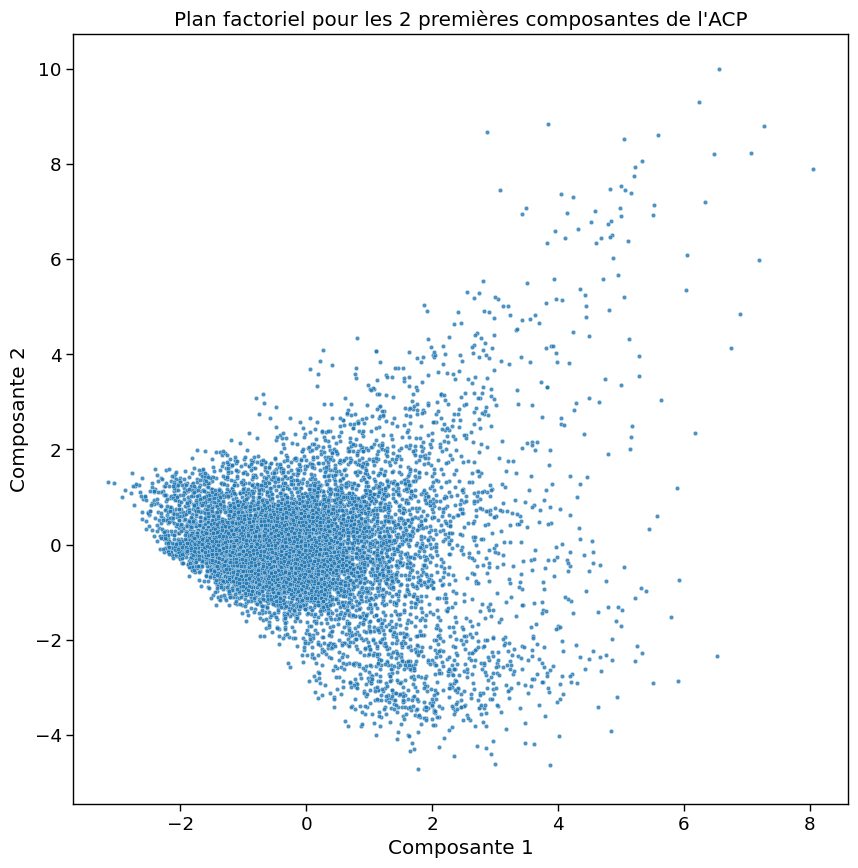

In [29]:
sns.set_context("paper", font_scale=1.5) 
plt.figure(figsize=(10,10))
chaine = "Plan factoriel pour les 2 premières composantes de l'ACP"
plt.title(chaine)
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')
ax = plt.gca()

sns.scatterplot(x = x_show,
                y = y_show,
                #hue = hue_show,
                alpha=0.8, s=10)

sns.set_context("paper", font_scale=1) 


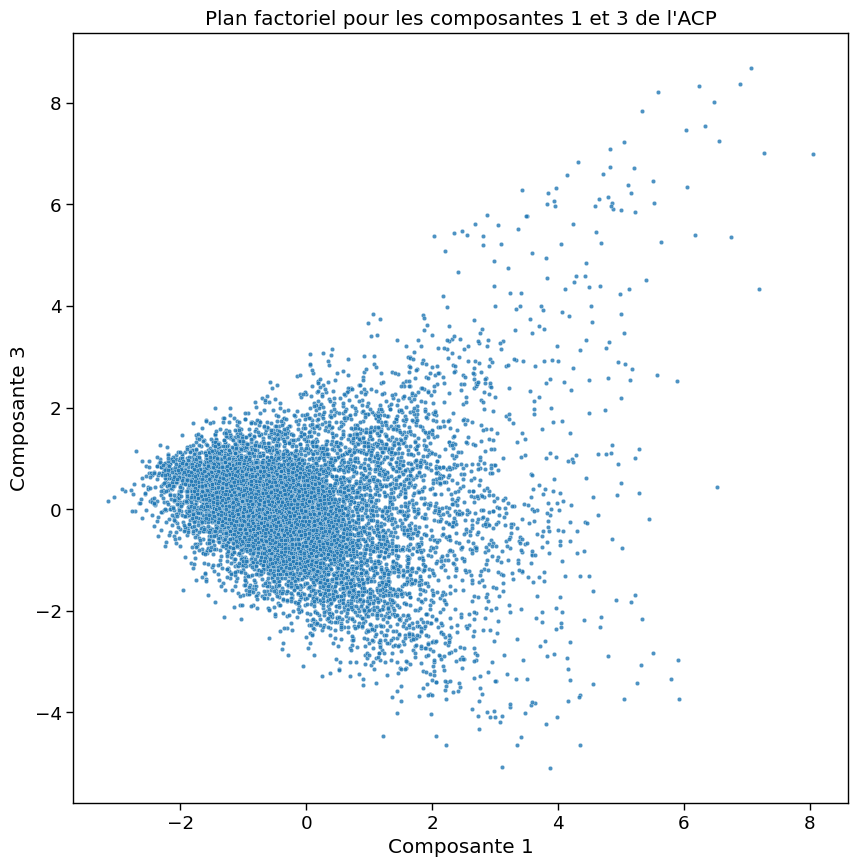

In [30]:
sns.set_context("paper", font_scale=1.5) 
plt.figure(figsize=(10,10))
chaine = "Plan factoriel pour les composantes 1 et 3 de l'ACP"
plt.title(chaine)
plt.xlabel('Composante 1')
plt.ylabel('Composante 3')
ax = plt.gca()

sns.scatterplot(x = x_show,
                y = z_show,
                #hue = hue_show,
                alpha=0.8, s=10)
sns.set_context("paper", font_scale=1) 


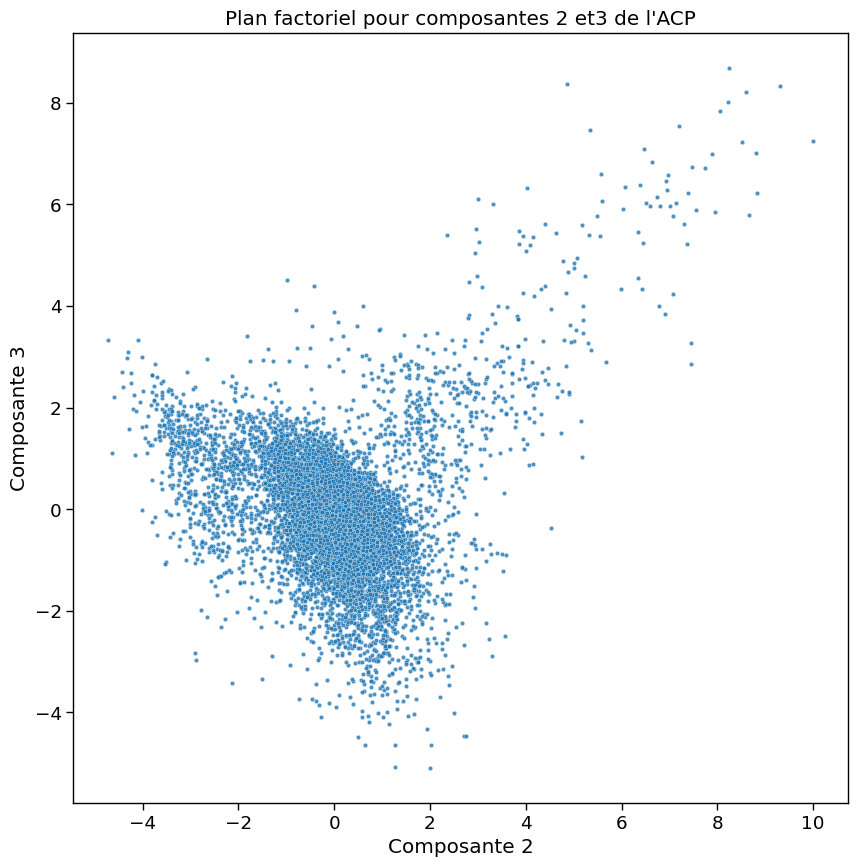

In [31]:
from matplotlib.patches import Circle
sns.set_context("paper", font_scale=1.5) 
plt.figure(figsize=(10,10))
chaine = "Plan factoriel pour composantes 2 et3 de l'ACP"
plt.title(chaine)
plt.xlabel('Composante 2')
plt.ylabel('Composante 3')
ax = plt.gca()

sns.scatterplot(x = y_show,
                y = z_show,
                #hue = hue_show,
                alpha=0.8, s=10)

sns.set_context("paper", font_scale=1) 


## T-SNE

utilisons l'algorithme T-SNE pour avoir une idée en première approche du nombre de groupes homogènes

In [32]:
tsne = TSNE(n_components=2)
T = tsne.fit_transform(X_pca.copy())

<Axes: title={'center': 'Représentation du jeu de données via T-SNE'}>

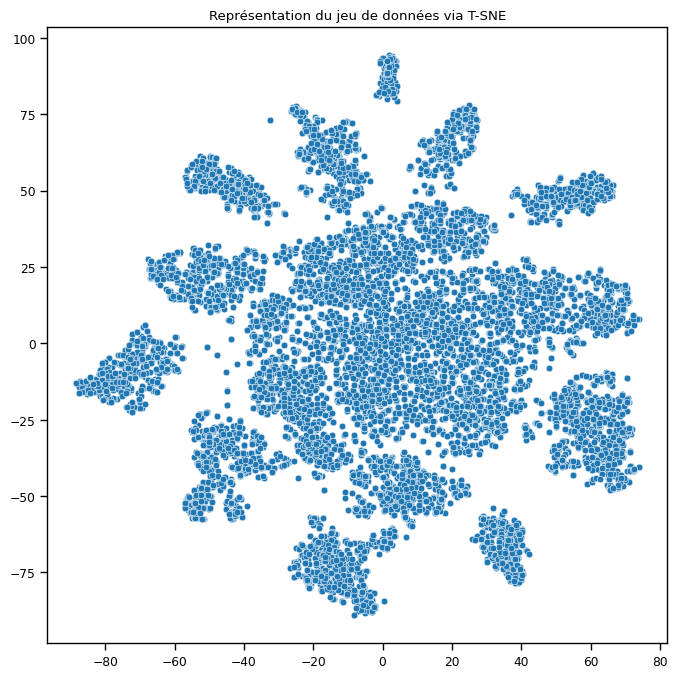

In [33]:
plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
sns.scatterplot(T[:,0], T[:,1])

## Kmeans

### Premier essai

K-means est un algorithme utilisé pour regrouper des exemples similaires dans des clusters, et la comparaison de la somme des inerties en fonction du nombre de clusters aide à déterminer le nombre optimal de clusters pour un ensemble de données donné.

In [34]:
kmeans = KMeans(n_clusters=5, 
                verbose=1, 
                random_state=0).fit(X_pca)

Initialization complete
Iteration 0, inertia 218872.46374141562
Iteration 1, inertia 183644.62183366256
Iteration 2, inertia 182281.73214932793
Iteration 3, inertia 181247.5766384191
Iteration 4, inertia 180507.80613060534
Iteration 5, inertia 180121.7502033673
Iteration 6, inertia 179824.0712389084
Iteration 7, inertia 179544.78352646716
Iteration 8, inertia 179350.36689435737
Iteration 9, inertia 179215.77280970186
Iteration 10, inertia 179109.91371171863
Iteration 11, inertia 179013.9561262151
Iteration 12, inertia 178894.85019843825
Iteration 13, inertia 178701.60316635127
Iteration 14, inertia 178451.0484682413
Iteration 15, inertia 178072.06736605318
Iteration 16, inertia 177267.438557764
Iteration 17, inertia 175527.9451448401
Iteration 18, inertia 174972.01480733108
Iteration 19, inertia 174704.4337982558
Iteration 20, inertia 174340.80690092343
Iteration 21, inertia 173967.4418163891
Iteration 22, inertia 173592.84398523817
Iteration 23, inertia 173256.03443765442
Iteration 24

Iteration 33, inertia 172135.47837408897
Iteration 34, inertia 172133.1667090682
Iteration 35, inertia 172129.530438416
Iteration 36, inertia 172122.6680492071
Iteration 37, inertia 172111.0198236049
Iteration 38, inertia 172078.8107757588
Iteration 39, inertia 172049.0494087694
Iteration 40, inertia 172036.4266824091
Iteration 41, inertia 172033.53539789777
Iteration 42, inertia 172033.12499317314
Iteration 43, inertia 172032.82636202354
Iteration 44, inertia 172032.62104621503
Converged at iteration 44: center shift 4.1692005434794934e-05 within tolerance 0.00011059656274346348.
Initialization complete
Iteration 0, inertia 216546.26500532945
Iteration 1, inertia 175391.08872729837
Iteration 2, inertia 173398.49470825263
Iteration 3, inertia 173265.04975585383
Iteration 4, inertia 173238.1269355904
Iteration 5, inertia 173234.20445011626
Iteration 6, inertia 173233.78905248566
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 217922.61642027902

In [35]:
kmeans.labels_

array([0, 2, 0, ..., 2, 2, 2])

In [36]:
kmeans.inertia_

170456.2843793461

In [37]:
kmeans.cluster_centers_

array([[ 8.19734827e-01,  5.36533189e-01, -1.22410031e+00,
        -7.28550623e-02,  1.90593095e-01, -1.20268156e-02,
        -6.92939381e-02,  1.66972969e-01, -6.15413415e-02,
        -4.63468508e-03,  1.65522380e-01,  3.26786222e-01,
        -9.53263066e-02, -9.10022748e-02,  2.30953934e-03,
         2.70440949e-02,  1.25997250e-01, -1.07741726e-01,
        -4.42852380e-02],
       [ 2.80619160e+00,  3.62840862e+00,  3.20378897e+00,
         2.30273129e-01, -3.99697169e-01,  3.05084471e-01,
        -1.03915570e-01,  1.84563659e-02, -3.05487315e-01,
        -1.68644128e-01,  5.13278741e-02, -8.67370625e-01,
        -2.50342005e-01,  4.08662143e-01, -3.79965147e-01,
         2.90019336e-01,  3.28829564e-02,  7.54703912e-02,
         4.77598882e-02],
       [-8.19930325e-01, -1.83682935e-04,  2.29014936e-01,
         5.13304477e-02, -2.04130332e-02, -3.54628329e-02,
         4.95085257e-02, -8.75101595e-02, -5.15428874e-02,
        -3.97902389e-02,  2.31533371e-02, -3.47822126e-02,
    

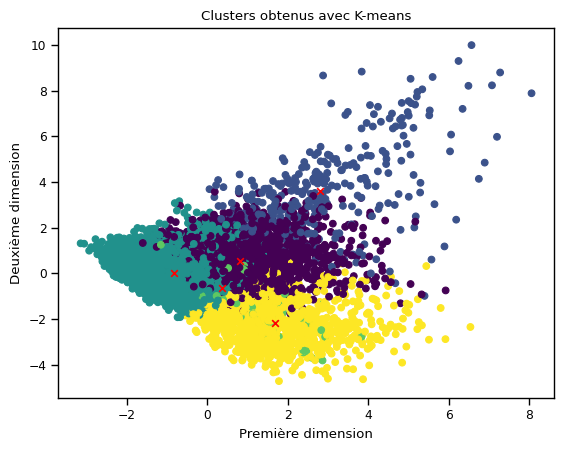

Indice de silhouette moyen : 0.1596833624698821


In [38]:
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Visualisation des clusters
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color='red', marker='x')
plt.xlabel('Première dimension')
plt.ylabel('Deuxième dimension')
plt.title('Clusters obtenus avec K-means')
plt.show()

# Évaluation du clustering avec l'indice de silhouette
silhouette_avg = silhouette_score(X_pca, kmeans.labels_)
print("Indice de silhouette moyen :", silhouette_avg)


Dans ce code, nous utilisons la fonction scatter de matplotlib pour créer un diagramme en nuage de points. Chaque échantillon est représenté par un point et est coloré en fonction de l'étiquette du cluster assignée par K-means. Les centres des clusters sont représentés par des croix rouges.

Ensuite, nous utilisons la fonction silhouette_score de sklearn.metrics pour calculer l'indice de silhouette moyen, qui mesure la cohésion intra-cluster et la séparation inter-cluster. Une valeur proche de 1 indique un clustering de haute qualité, tandis qu'une valeur proche de -1 indique un clustering de mauvaise qualité.

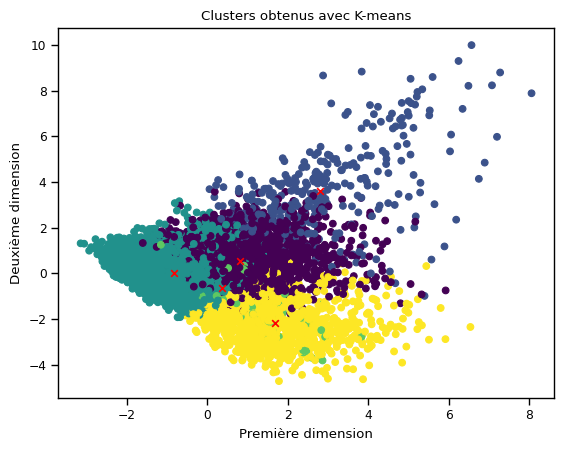

Indice de silhouette moyen : 0.1596833624698821


In [39]:
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Visualisation des clusters
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_)  # Nuage de points avec les deux premières dimensions de X_pca, coloré en fonction des étiquettes des clusters
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color='red', marker='x')  # Tracé des centres des clusters en rouge avec le marqueur 'x'
plt.xlabel('Première dimension')  # Étiquette de l'axe x
plt.ylabel('Deuxième dimension')  # Étiquette de l'axe y
plt.title('Clusters obtenus avec K-means')  # Titre du graphique
plt.show()  # Affichage de la visualisation des clusters

# Évaluation du clustering avec l'indice de silhouette
silhouette_avg = silhouette_score(X_pca, kmeans.labels_)  # Calcul de l'indice de silhouette moyen en utilisant X_pca et les étiquettes des clusters
print("Indice de silhouette moyen :", silhouette_avg)  # Affichage de l'indice de silhouette moyen


Ce code utilise les résultats du clustering obtenu avec K-means pour visualiser les clusters sur un graphique et évalue la qualité du clustering à l'aide de l'indice de silhouette moyen. Les commentaires décrivent chaque ligne et son objectif dans le code.

### Recherche d'un optimum du nombre de clusters

NB : intertia = Sum of squared distances of samples to their closest cluster center.

NB : intertia = Somme des distances au carré des échantillons à leur centre de grappe le plus proche.

#### 1 sample

In [40]:
inertia = {}  # Dictionnaire pour stocker les valeurs d'inertie
dict_kmeans = {}  # Dictionnaire pour stocker les objets KMeans

# Boucle pour tester différents nombres de clusters
for k in range(1, 25):
    print(k)  # Affiche le nombre de clusters en cours de traitement

    # Création de l'objet KMeans avec le nombre de clusters actuel
    kmeans = KMeans(n_clusters=k, verbose=1, random_state=0).fit(X_pca)

    # Stockage de l'inertie associée au nombre de clusters actuel dans le dictionnaire inertia
    inertia[k] = kmeans.inertia_

    # Stockage de l'objet KMeans associé au nombre de clusters actuel dans le dictionnaire dict_kmeans
    dict_kmeans[k] = kmeans


1
Initialization complete


Iteration 0, inertia 342021.84876862.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 326081.73408658605.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 289098.07783091086.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 267252.8863783251.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1511319.099974806.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 441178.24174244056.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 585880.6921340101.
Iteration 1, inertia 210133.46921258088.
Converged at

Ce code effectue une boucle pour tester différents nombres de clusters (de 1 à 24). À chaque itération, il crée un objet KMeans avec le nombre de clusters actuel et ajuste le modèle sur les données X_pca. Ensuite, il stocke l'inertie associée à ce nombre de clusters dans le dictionnaire inertia. L'inertie est accessible via la méthode kmeans.inertia_. Enfin, l'objet KMeans est stocké dans le dictionnaire dict_kmeans pour une utilisation ultérieure si nécessaire.

Ainsi, l'inertie associée à un nombre de clusters permet de quantifier la cohésion des points dans chaque cluster et d'évaluer la qualité du clustering en termes de compacité et de séparation des clusters.

<Axes: title={'center': 'Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters'}>

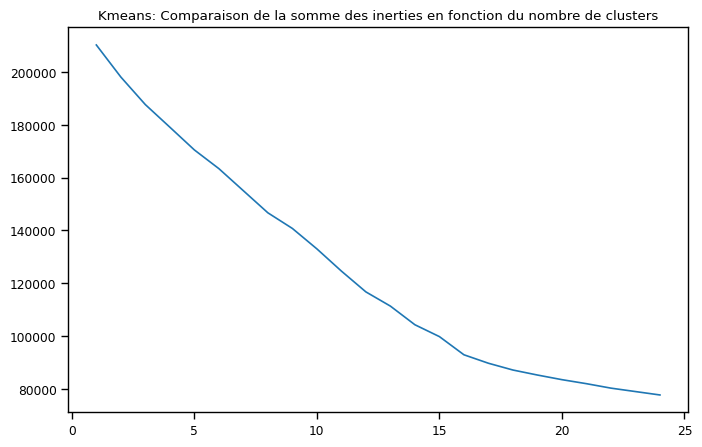

In [41]:
plt.figure(figsize=(8,5))
plt.title('Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters')
sns.lineplot(list(inertia.keys()),
             list(inertia.values())
            )

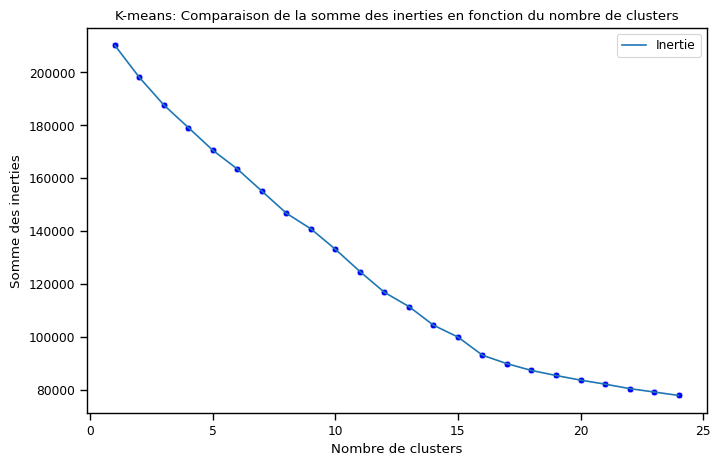

In [42]:
plt.figure(figsize=(8, 5))  # Crée une nouvelle figure avec une taille de 8 pouces de largeur et 5 pouces de hauteur
plt.title('K-means: Comparaison de la somme des inerties en fonction du nombre de clusters')  # Définit le titre du graphique
sns.lineplot(list(inertia.keys()), list(inertia.values()))  # Trace une courbe de ligne avec les clés et les valeurs de l'inertie

# Les lignes suivantes sont facultatives et dépendent de vos besoins de visualisation :

# Ajouter des marqueurs sur les points de la courbe
sns.scatterplot(list(inertia.keys()), list(inertia.values()), color='blue', marker='o')

# Ajouter une ligne droite de référence
# plt.axhline(y=reference_value, color='red', linestyle='--')

# Configurer les étiquettes des axes, les légendes, etc.
plt.xlabel('Nombre de clusters')
plt.ylabel('Somme des inerties')
plt.legend(['Inertie'])
# ...

plt.show()  # Affiche le graphique


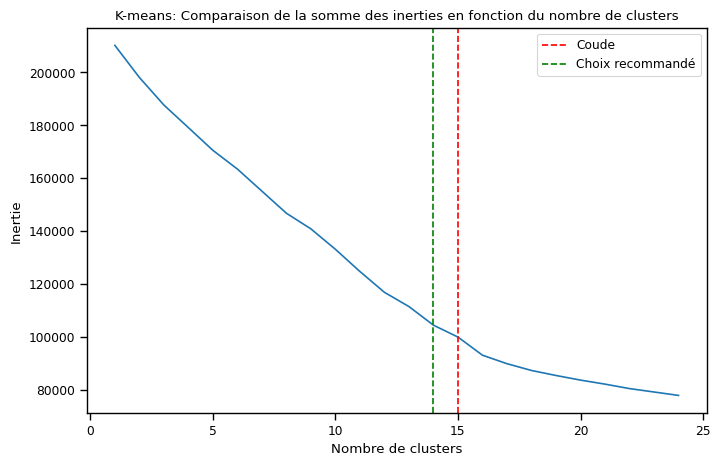

In [43]:
plt.figure(figsize=(8, 5))
plt.title('K-means: Comparaison de la somme des inerties en fonction du nombre de clusters')
sns.lineplot(list(inertia.keys()), list(inertia.values()))

# Trouver le coude de la courbe
diff_inertia = np.diff(list(inertia.values()))
second_diff = np.diff(diff_inertia)
elbow_index = np.argmax(second_diff) + 1  # Ajouter 1 pour compenser la différence

# Tracer des lignes pour indiquer le bon endroit
plt.axvline(x=elbow_index, color='r', linestyle='--', label='Coude')
plt.axvline(x=elbow_index-1, color='g', linestyle='--', label='Choix recommandé')

plt.xlabel('Nombre de clusters')
plt.ylabel('Inertie')
plt.legend()
plt.show()


#### n samples

In [44]:
# inertia = {}
# dict_kmeans = {}

# nb_boucles=3
# max_clusters = 25

# for k in range(1,nb_boucles+1):
#     print('Boucle ',k)
#     for i in range(1,max_clusters+1):
#         kmeans = KMeans(n_clusters=i,
#                        verbose=1).fit(X_pca)
#         inertia[(k,i)] = kmeans.inertia_
#         dict_kmeans[k,i] = kmeans
        
inertia = {}  # Dictionnaire pour stocker les valeurs d'inertie
dict_kmeans = {}  # Dictionnaire pour stocker les objets KMeans

nb_boucles = 3  # Nombre de boucles à effectuer
max_clusters = 25  # Nombre maximal de clusters à tester

# Boucle externe pour les différentes boucles
for k in range(1, nb_boucles + 1):
    print('Boucle', k)  # Affiche le numéro de boucle en cours

    # Boucle interne pour tester différents nombres de clusters
    for i in range(1, max_clusters + 1):
        # Création de l'objet KMeans avec le nombre de clusters actuel
        kmeans = KMeans(n_clusters=i, verbose=1).fit(X_pca)

        # Stockage de l'inertie associée à la paire (k, i) dans le dictionnaire inertia
        inertia[(k, i)] = kmeans.inertia_

        # Stockage de l'objet KMeans associé à la paire (k, i) dans le dictionnaire dict_kmeans
        dict_kmeans[(k, i)] = kmeans

Boucle 1
Initialization complete
Iteration 0, inertia 354381.52882870426.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete


Iteration 0, inertia 448747.5858212024.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 469727.4133311778.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 418075.06657893886.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 311037.44413362973.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 363767.8843921496.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 291295.794721277.
Iteration 1, inertia 210133.46921258088.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1051024.5112004066.
Iteration 1, inertia 210133.46921258088.
Converged a

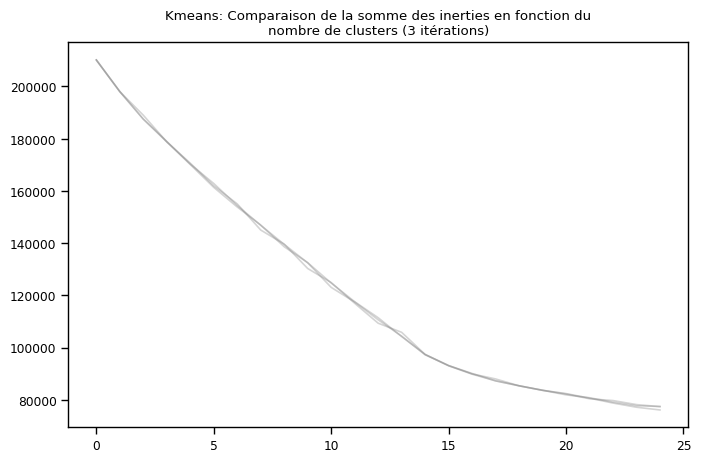

In [45]:
chaine = 'Kmeans: Comparaison de la somme des inerties en fonction du\nnombre de clusters (' + str(nb_boucles) + ' itérations)'
plt.figure(figsize=(8,5))
plt.title(chaine)
for i in range(0,nb_boucles):
    index_plot = [cluster+i*(max_clusters) for cluster in list(range(0,max_clusters))][0:max_clusters]
    sous_liste = [list(inertia.values())[index] for index in index_plot]
    sns.lineplot(list(range(0,max_clusters)),
                 sous_liste, alpha=1/nb_boucles, color='grey')

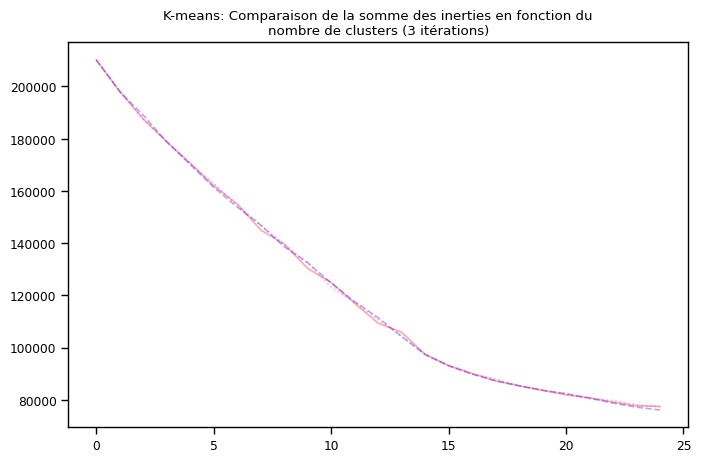

In [46]:
# ##############
# chaine = 'K-means: Comparaison de la somme des inerties en fonction du\nnombre de clusters (' + str(nb_boucles) + ' itérations)'  # Chaîne de caractères pour le titre du graphique
# plt.figure(figsize=(8, 5))  # Crée une nouvelle figure avec une taille de 8 pouces de largeur et 5 pouces de hauteur
# plt.title(chaine)  # Définit le titre du graphique

# # Boucle pour tracer les lignes de la comparaison des inerties
# for i in range(0, nb_boucles):
#     index_plot = [cluster + i * (max_clusters) for cluster in list(range(0, max_clusters))][0:max_clusters]  # Indices des inerties à tracer
#     sous_liste = [list(inertia.values())[index] for index in index_plot]  # Liste des inerties correspondant aux indices
#     sns.lineplot(list(range(0, max_clusters)), sous_liste, alpha=1/nb_boucles, color='grey')  # Trace une courbe de ligne avec les indices et les inerties correspondantes
# ##############
chaine = 'K-means: Comparaison de la somme des inerties en fonction du\nnombre de clusters (' + str(nb_boucles) + ' itérations)'  # Chaîne de caractères pour le titre du graphique
plt.figure(figsize=(8, 5))  # Crée une nouvelle figure avec une taille de 8 pouces de largeur et 5 pouces de hauteur
plt.title(chaine)  # Définit le titre du graphique

# Boucle pour tracer les lignes de la comparaison des inerties
for i in range(0, nb_boucles):
    index_plot = [cluster + i * (max_clusters) for cluster in list(range(0, max_clusters))][0:max_clusters]  # Indices des inerties à tracer
    sous_liste = [list(inertia.values())[index] for index in index_plot]  # Liste des inerties correspondant aux indices
    
    # Définition de la couleur et de l'aspect de la ligne en fonction de l'itération
    if i == 0:
        color = 'red'  # Couleur de la première itération
        linestyle = '-'  # Aspect de la ligne solide
    elif i == 1:
        color = 'blue'  # Couleur de la deuxième itération
        linestyle = '--'  # Aspect de la ligne en tiret
    else:
#         color = 'green'  # Couleur de la troisième itération
        color = '#FF00FF'  # '#FFFF00' Code hexadécimal pour la couleur jaune fluo
#         color = (255/255, 255/255, 0/255)  # Valeurs RVB pour la couleur jaune fluo
        linestyle = ':'  # Aspect de la ligne en pointillés
    
    sns.lineplot(list(range(0, max_clusters)), sous_liste, alpha=1/nb_boucles, color=color, linestyle=linestyle)  # Trace une courbe de ligne avec les indices et les inerties correspondantes, avec la couleur et l'aspect définis




#### Coefficient de silhouette

Le coefficient de silhouette est une mesure simple et concise pour évaluer la qualité d'un clustering en termes de séparation et de compacité des clusters. Il permet de quantifier la similarité des objets à l'intérieur d'un cluster par rapport aux objets des autres clusters, ce qui facilite la comparaison et l'évaluation des différentes configurations de clustering.

In [47]:
# silhouettes_kmeans = {}
# for i in range(2,max_clusters):
#     silhouettes_kmeans[i] = silhouette_score(X = X_pca,
#                                              labels= list(dict_kmeans[(1,i)].labels_))
silhouettes_kmeans = {}  # Dictionnaire pour stocker les valeurs du coefficient de silhouette

# Boucle pour calculer le coefficient de silhouette pour chaque nombre de clusters
for i in range(2, max_clusters):
    # Calcul du coefficient de silhouette en utilisant la fonction silhouette_score
    # X_pca : les données projetées en PCA
    # labels : les étiquettes de clusters attribuées par KMeans
    silhouettes_kmeans[i] = silhouette_score(X=X_pca, labels=list(dict_kmeans[(1, i)].labels_))


Ce code permet de calculer et de stocker les valeurs du coefficient de silhouette pour chaque nombre de clusters, en utilisant K-means comme algorithme de clustering. Le coefficient de silhouette est une mesure quantitative de la qualité du clustering, qui peut être utilisée pour évaluer différentes configurations de clustering ou trouver le nombre optimal de clusters. Des valeurs plus élevées du coefficient de silhouette indiquent une meilleure séparation et compacité des clusters.

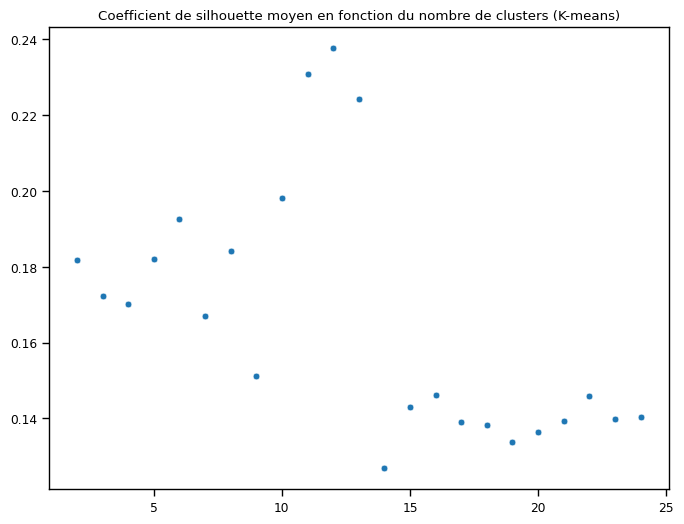

In [48]:
# plt.figure(figsize=(8,6)),
# plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
# sns.scatterplot(x = list(silhouettes_kmeans.keys()),
#                y = list(silhouettes_kmeans.values()))
# plt.show()
plt.figure(figsize=(8, 6))  # Crée une nouvelle figure avec une taille de 8 pouces de largeur et 6 pouces de hauteur
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (K-means)')  # Définit le titre du graphique

# Tracé du scatter plot avec les nombres de clusters et les coefficients de silhouette moyens
sns.scatterplot(x=list(silhouettes_kmeans.keys()), y=list(silhouettes_kmeans.values()))

plt.show()  # Affiche le graphique


Ce code permet de visualiser le coefficient de silhouette moyen pour chaque nombre de clusters, en utilisant K-means comme algorithme de clustering. La visualisation sous forme de scatter plot permet de comprendre la tendance des valeurs de coefficient de silhouette en fonction du nombre de clusters. Cela peut aider à identifier le nombre optimal de clusters où le coefficient de silhouette moyen est maximisé, indiquant une meilleure séparation et compacité des clusters.

In [49]:
for key, value in silhouettes_kmeans.items():  # Parcours des éléments du dictionnaire silhouettes_kmeans
    if value == max(silhouettes_kmeans.values()):  # Vérification si la valeur est égale à la valeur maximale des coefficients de silhouette
        print('Le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))  # Affichage du nombre de clusters et du coefficient de silhouette correspondant
        nb_clusters = key  # Attribution du nombre de clusters correspondant à la variable nb_clusters


Le coefficient de silhouette est maximal pour 12 clusters (score = 0.23762547199298828)


Ce code permet d'identifier le nombre de clusters pour lequel le coefficient de silhouette est maximal. L'affichage du nombre de clusters et du coefficient de silhouette maximal fournit une indication sur la configuration de clustering qui offre la meilleure séparation et compacité des clusters. La variable nb_clusters permet de stocker cette valeur pour une utilisation ultérieure si nécessaire.

In [50]:
nb_clusters

12

#### Indice de Davies Bouldin

L'indice de Davies-Bouldin est une mesure qui quantifie la qualité d'un clustering en évaluant à la fois la séparation et la cohésion des clusters. Une valeur d'indice plus faible indique une meilleure qualité de clustering, tandis qu'une valeur plus élevée indique une moins bonne qualité de clustering.

In [51]:
# davies_bouldin_kmeans = {}
# for i in range(2,max_clusters):
#     davies_bouldin_kmeans[i] = davies_bouldin_score(X = X_pca,
#                                              labels= list(dict_kmeans[(1,i)].labels_))
davies_bouldin_kmeans = {}  # Dictionnaire pour stocker les valeurs de l'indice de Davies-Bouldin

# Boucle pour calculer l'indice de Davies-Bouldin pour chaque nombre de clusters
for i in range(2, max_clusters):
    # Calcul de l'indice de Davies-Bouldin en utilisant la fonction davies_bouldin_score
    # X_pca : les données projetées en PCA
    # labels : les étiquettes de clusters attribuées par KMeans
    davies_bouldin_kmeans[i] = davies_bouldin_score(X=X_pca, labels=list(dict_kmeans[(1, i)].labels_))

Ce code permet de calculer et de stocker les valeurs de l'indice de Davies-Bouldin pour chaque nombre de clusters, en utilisant K-means comme algorithme de clustering. L'indice de Davies-Bouldin est une mesure de la qualité du clustering qui évalue la séparation et la compacité des clusters. Les valeurs plus faibles de l'indice de Davies-Bouldin indiquent une meilleure qualité de clustering avec des clusters plus séparés et plus cohérents.

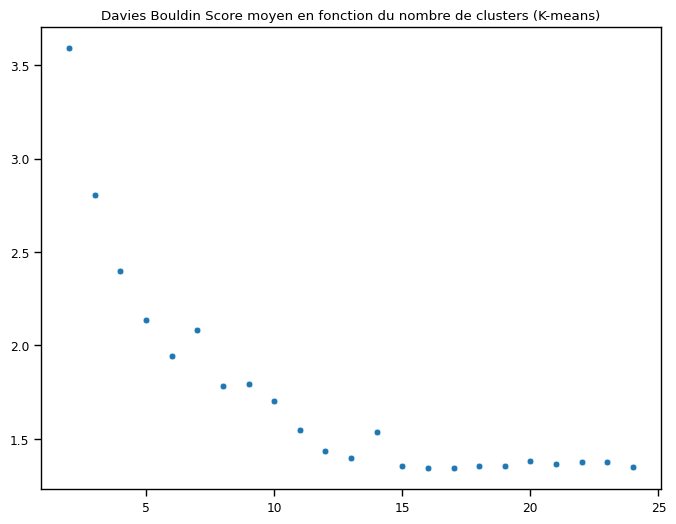

In [52]:
# plt.figure(figsize=(8,6)),
# plt.title('Davies Bouldin Score moyen en fonction du nombre de clusters (kmeans)')
# sns.scatterplot(x = list(davies_bouldin_kmeans.keys()),
#                y = list(davies_bouldin_kmeans.values()))
# plt.show()
plt.figure(figsize=(8, 6))  # Crée une nouvelle figure avec une taille de 8 pouces de largeur et 6 pouces de hauteur
plt.title('Davies Bouldin Score moyen en fonction du nombre de clusters (K-means)')  # Définit le titre du graphique

# Tracé du scatter plot avec les nombres de clusters et les scores de Davies Bouldin moyens
sns.scatterplot(x=list(davies_bouldin_kmeans.keys()), y=list(davies_bouldin_kmeans.values()))

plt.show()  # Affiche le graphique


Ce code permet de visualiser le score de Davies-Bouldin moyen pour chaque nombre de clusters, en utilisant K-means comme algorithme de clustering. La visualisation sous forme de scatter plot permet de comprendre la tendance des scores de Davies-Bouldin en fonction du nombre de clusters. Cela peut aider à identifier le nombre optimal de clusters où le score de Davies-Bouldin moyen est minimisé, indiquant une meilleure séparation et cohérence des clusters.

In [53]:
# for key, value in davies_bouldin_kmeans.items():
#     if value == min(davies_bouldin_kmeans.values()):
#         print('lescore de Davies Bouldin est minimal pour {} clusters (score = {})'.format(key, value))
for key, value in davies_bouldin_kmeans.items():  # Parcours des éléments du dictionnaire davies_bouldin_kmeans
    if value == min(davies_bouldin_kmeans.values()):  # Vérification si la valeur est égale à la valeur minimale des scores de Davies Bouldin
        print('Le score de Davies Bouldin est minimal pour {} clusters (score = {})'.format(key, value))  # Affichage du nombre de clusters et du score de Davies Bouldin correspondant


Le score de Davies Bouldin est minimal pour 16 clusters (score = 1.3416287976012626)


### Représentation

In [54]:
# nb_clusters_agg = nb_clusters

<Axes: title={'center': 'Représentation T-SNE de la séparation du jeu de données via KMeans (14 clusters)'}>

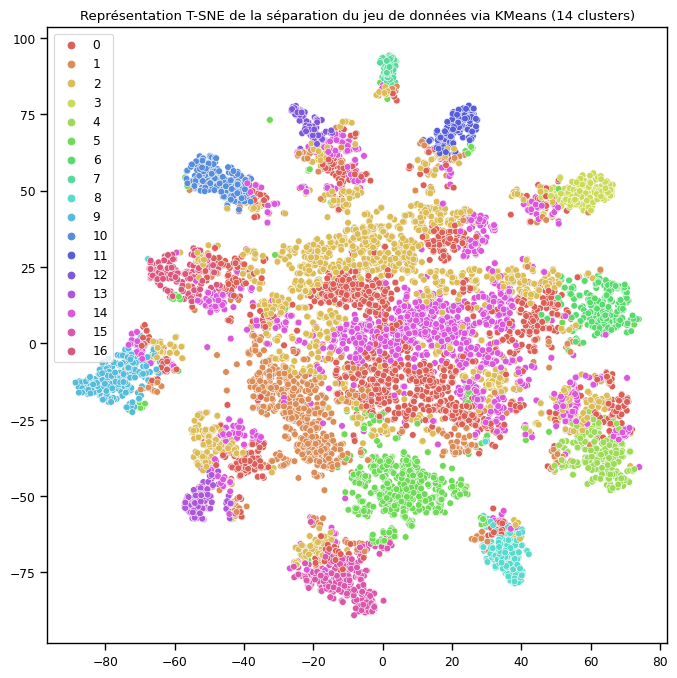

In [55]:
# plt.figure(figsize=(8,8))
# plt.title('Représentation T-SNE de la séparation du jeu de données via KMeans (14 clusters)')
# sns.scatterplot(T[:,0], 
#                 T[:,1],
#                hue=dict_kmeans[(1,14)].labels_,
#                 legend='full',
#                palette=sns.color_palette("hls",18))
plt.figure(figsize=(8, 8))
plt.title('Représentation T-SNE de la séparation du jeu de données via KMeans (14 clusters)')

# Utilisez une palette avec le nombre de couleurs correspondant au nombre de clusters
palette = sns.color_palette("hls", n_colors=17)

sns.scatterplot(T[:, 0], T[:, 1], hue=dict_kmeans[(1, 17)].labels_, legend='full', palette=palette)


L'objectif de ce code et du graphique est de visualiser graphiquement la séparation des clusters obtenus par KMeans dans un espace réduit par T-SNE. Cela permet de mieux comprendre la structure des données et de vérifier visuellement la séparation des clusters. En utilisant des couleurs différentes pour chaque cluster, le graphique facilite l'identification des groupes distincts dans les données. Cela peut être utile pour l'analyse exploratoire des données, l'évaluation de la qualité du clustering ou la communication des résultats à d'autres parties prenantes.

## DBScan 

### Application

In [56]:
# dbs = DBSCAN(eps = 1, 
#              min_samples=5,
#                n_jobs=-1).fit(X_pca.copy())
dbs = DBSCAN(eps=1, min_samples=5, n_jobs=-1).fit(X_pca.copy())

- DBSCAN est une classe de l'algorithme Density-Based Spatial Clustering of Applications with Noise (DBSCAN) fournie par la bibliothèque scikit-learn.
- eps est le rayon autour de chaque point à considérer lors de la recherche de ses voisins. C'est l'un des paramètres clés de DBSCAN qui définit la distance maximale entre les points pour qu'ils soient considérés comme voisins.
- min_samples est le nombre minimal de points à l'intérieur du rayon eps requis pour former un cluster. C'est un autre paramètre important de DBSCAN qui détermine la densité minimale nécessaire pour qu'un groupe de points soit considéré comme un cluster.
- n_jobs=-1 spécifie que le calcul peut être parallélisé sur tous les CPU disponibles. Cela peut accélérer le processus de calcul lorsque de nombreux points sont impliqués.
- fit(X_pca.copy()) ajuste le modèle DBSCAN aux données d'entrée. X_pca.copy() est une copie des données projetées en PCA, qui est utilisée pour éviter toute modification des données d'origine.

En utilisant ces paramètres, DBSCAN effectue le clustering des données X_pca en identifiant les clusters en fonction de la densité des points et de la proximité spatiale. Cela permet de détecter des structures non linéaires, des formes arbitraires de clusters et des points aberrants dans les données. Le modèle dbs contient les informations sur les clusters identifiés par DBSCAN, qui peuvent ensuite être utilisées pour l'analyse et la visualisation des résultats du clustering.

### Représentation des variables

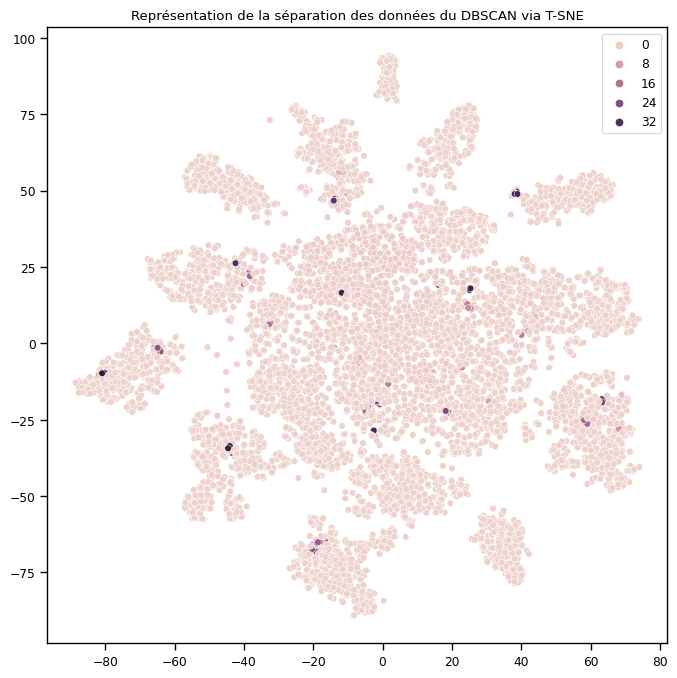

In [57]:
# plt.figure(figsize=(8,8))
# plt.title('Représentation de la séparation des données du DBSCAN via T-SNE')
# sns.scatterplot(T[:,0], T[:,1], dbs.labels_)
plt.figure(figsize=(8, 8))  # Crée une nouvelle figure avec une taille de 8 pouces de largeur et 8 pouces de hauteur
plt.title('Représentation de la séparation des données du DBSCAN via T-SNE')  # Définit le titre du graphique

# Tracé du scatter plot avec les coordonnées des points projetés en T-SNE et les étiquettes de clusters de DBSCAN
sns.scatterplot(T[:, 0], T[:, 1], dbs.labels_)

plt.show()  # Affiche le graphique


Ce code permet de visualiser graphiquement la séparation des données obtenues avec DBSCAN dans un espace réduit par T-SNE. En utilisant des couleurs différentes pour chaque cluster identifié par DBSCAN, le graphique facilite l'identification des groupes distincts dans les données. Cela peut être utile pour l'analyse exploratoire des données, l'évaluation de la qualité du clustering ou la détection de points aberrants.

## Clustering Hiérarchique

Le clustering hiérarchique est une méthode de regroupement de données qui vise à créer une structure hiérarchique de clusters. Contrairement à d'autres méthodes de clustering telles que K-means, le clustering hiérarchique ne nécessite pas de spécifier le nombre de clusters à l'avance.

Le processus de clustering hiérarchique commence par considérer chaque point de données comme un cluster individuel. Ensuite, il fusionne progressivement les clusters similaires pour former des clusters plus grands, jusqu'à ce que tous les points de données soient regroupés dans un seul cluster.

Il existe deux approches principales dans le clustering hiérarchique : le clustering hiérarchique agglomératif et le clustering hiérarchique diviseur.

- Le clustering hiérarchique agglomératif commence par considérer chaque point de données comme un cluster individuel, puis fusionne les clusters les plus similaires à chaque étape jusqu'à former un seul cluster contenant tous les points.
- Le clustering hiérarchique diviseur commence avec un seul cluster contenant tous les points de données, puis divise récursivement le cluster en sous-clusters plus petits jusqu'à atteindre le nombre souhaité de clusters.

Le résultat du clustering hiérarchique est généralement représenté sous forme de dendrogramme, qui est un diagramme en forme d'arbre montrant les regroupements successifs des clusters. Ce diagramme permet de visualiser la structure hiérarchique des clusters et d'identifier les niveaux de regroupement.

Le clustering hiérarchique est utilisé dans divers domaines tels que l'analyse de données, la bioinformatique, la segmentation de marché, etc. Il offre une approche flexible pour explorer et comprendre la structure des données, en fournissant des informations sur les similarités et les relations entre les points de données.

In [58]:
nb_clusters_agg = nb_clusters

In [59]:
cah = AgglomerativeClustering(n_clusters = nb_clusters_agg
                             ).fit(X_pca.copy())

- AgglomerativeClustering est une classe de l'algorithme de clustering hiérarchique agglomératif fournie par la bibliothèque scikit-learn.
- n_clusters est le nombre de clusters souhaité pour le regroupement. C'est le paramètre principal de l'algorithme de clustering hiérarchique.
- fit(X_pca.copy()) ajuste le modèle de clustering hiérarchique agglomératif aux données d'entrée. X_pca.copy() est une copie des données projetées en PCA, qui est utilisée pour éviter toute modification des données d'origine.

En utilisant ces paramètres, le modèle cah effectue le clustering hiérarchique agglomératif des données X_pca en identifiant les clusters en fonction des distances entre les points. Le nombre de clusters est déterminé par le paramètre n_clusters. Le modèle cah contient les informations sur les clusters identifiés par le clustering hiérarchique agglomératif, qui peuvent ensuite être utilisées pour l'analyse et la visualisation des résultats du clustering.

Ce code permet donc de réaliser le clustering hiérarchique agglomératif sur les données projetées en PCA (X_pca) avec un nombre spécifié de clusters (nb_clusters_agg). Les résultats du clustering peuvent être utilisés pour comprendre la structure des données et effectuer des analyses ultérieures sur les groupes formés.

In [60]:
graph = pd.DataFrame(data = [T[:,0], T[:,1], dict_kmeans[(1,11)].labels_]).T
graph.columns = ['X', 'Y', 'label_kmeans']

- pd.DataFrame(data=[T[:, 0], T[:, 1], dict_kmeans[(1, 11)].labels_]).T crée un DataFrame en utilisant les données T[:, 0],   - T[:, 1] et les étiquettes de clusters attribuées par KMeans (dict_kmeans[(1, 11)].labels_).
  - T[:, 0] correspond aux valeurs de la première dimension dans l'espace de projection T-SNE.
  - T[:, 1] correspond aux valeurs de la deuxième dimension dans l'espace de projection T-SNE.
  - dict_kmeans[(1, 11)].labels_ correspond aux étiquettes de clusters attribuées par KMeans pour les points correspondants.
- .T transpose le DataFrame pour inverser les lignes et les colonnes.
- graph.columns = ['X', 'Y', 'label_kmeans'] attribue les noms de colonnes 'X', 'Y' et 'label_kmeans' au DataFrame.

Ce code permet de créer un DataFrame graph contenant les coordonnées des points projetés en T-SNE ('X' et 'Y') ainsi que les étiquettes de clusters attribuées par KMeans ('label_kmeans'). Le DataFrame peut être utilisé pour l'analyse et la visualisation des résultats du clustering, par exemple pour tracer des graphiques ou effectuer des calculs supplémentaires sur les clusters identifiés.

In [61]:
graph['x_pca'] = x_show
graph['y_pca'] = y_show
graph['z_pca'] = z_show

In [62]:
graph

,X,Y,label_kmeans,x_pca,y_pca,z_pca
0,-6.786893,-65.432266,1.0,0.241218,0.657789,-0.735308
1,-36.033989,6.049109,1.0,-1.816053,-0.003788,0.827790
2,63.215248,3.425494,10.0,1.960054,0.151527,-2.236689
3,62.353291,-29.439497,1.0,-0.841717,1.767807,-1.891600
4,-36.272758,23.555845,1.0,-1.008793,0.010741,0.536420
...,...,...,...,...,...,...
9995,22.492325,36.679394,1.0,-2.057373,0.440746,0.602755
9996,68.832428,-44.180286,1.0,0.828735,2.548819,-0.472033
9997,13.313536,62.578102,1.0,-1.802412,0.494766,-0.089156
9998,-62.106911,-5.929529,1.0,-1.391884,-0.115428,0.013889


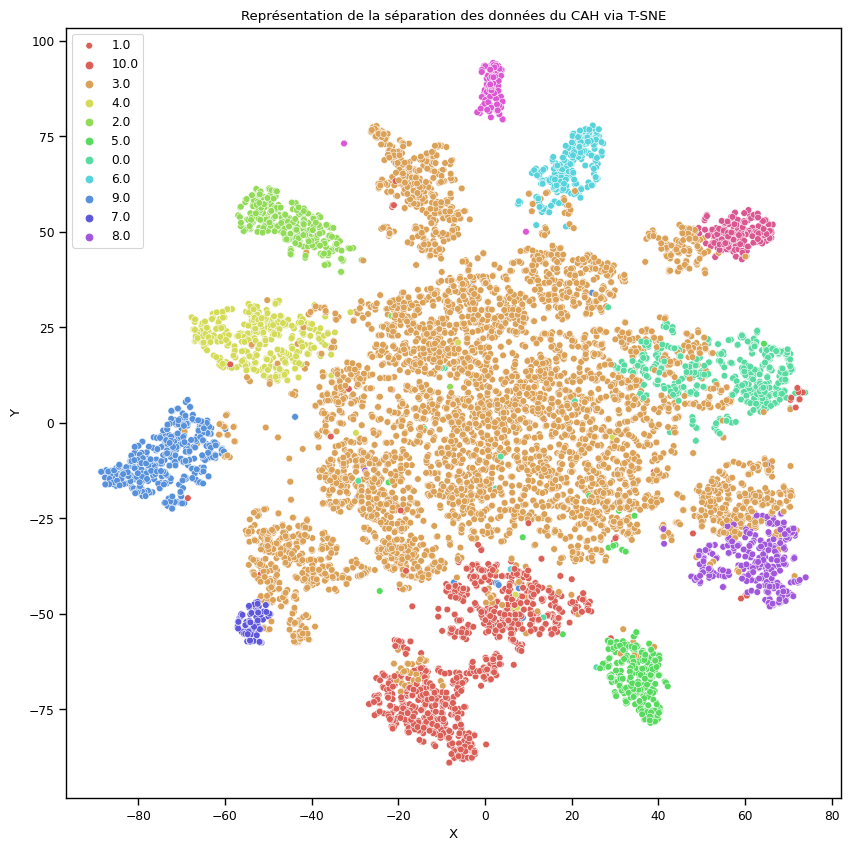

In [63]:
# plt.figure(figsize=(10,10))
# plt.title('Représentation de la séparation des données du CAH via T-SNE')
# sns.scatterplot(graph['X'], 
#                 graph['Y'], 
#                 hue = cah.labels_, 
#                 legend='full',
#                palette=sns.color_palette("hls",nb_clusters_agg))
# plt.legend(loc='upper left', labels=graph['label_kmeans'].unique())
# plt.show()
plt.figure(figsize=(10, 10))  # Crée une nouvelle figure avec une taille de 10 pouces de largeur et 10 pouces de hauteur
plt.title('Représentation de la séparation des données du CAH via T-SNE')  # Définit le titre du graphique

# Tracé du scatter plot avec les coordonnées des points projetés en T-SNE, les étiquettes de clusters de CAH et les étiquettes de clusters de KMeans
sns.scatterplot(graph['X'], graph['Y'], hue=cah.labels_, legend='full',
                palette=sns.color_palette("hls", nb_clusters_agg))

# Ajout de la légende pour les étiquettes de clusters de KMeans
plt.legend(loc='upper left', labels=graph['label_kmeans'].unique())

plt.show()  # Affiche le graphique


Ce code permet de visualiser graphiquement la séparation des données obtenues avec l'algorithme de clustering hiérarchique agglomératif (CAH) dans un espace de projection T-SNE. Voici une description détaillée du code :

- plt.figure(figsize=(10, 10)) crée une nouvelle figure avec une taille de 10 pouces de largeur et 10 pouces de hauteur pour préparer la visualisation.
- plt.title('Représentation de la séparation des données du CAH via T-SNE') définit le titre du graphique pour indiquer ce qui est représenté.
- sns.scatterplot trace un scatter plot en utilisant les coordonnées des points projetés en T-SNE (graph['X'] et graph['Y']) et les étiquettes de clusters attribuées par CAH (cah.labels_).
- Les coordonnées graph['X'] et graph['Y'] correspondent respectivement aux valeurs des deux dimensions dans l'espace de projection T-SNE.
- L'argument hue=cah.labels_ est utilisé pour spécifier les étiquettes de clusters attribuées par CAH pour les points correspondants.
- L'argument legend='full' indique d'afficher une légende complète pour les catégories de clusters.
- La palette de couleurs utilisée est spécifiée avec palette, qui est une palette de couleurs générée par sns.color_palette avec le nombre approprié de couleurs correspondant au nombre de clusters de CAH.
- plt.legend(loc='upper left', labels=graph['label_kmeans'].unique()) ajoute une légende pour les étiquettes de clusters attribuées par KMeans en utilisant les étiquettes uniques de KMeans extraites du DataFrame graph.
- Le graphique est affiché avec plt.show().

Ce code permet de visualiser graphiquement la séparation des données obtenues avec le clustering hiérarchique agglomératif dans un espace réduit par T-SNE. En utilisant des couleurs différentes pour chaque cluster identifié par CAH, le graphique facilite l'identification des groupes distincts dans les données. La légende inclut également les étiquettes de clusters attribuées par KMeans pour une meilleure compréhension des résultats du clustering.

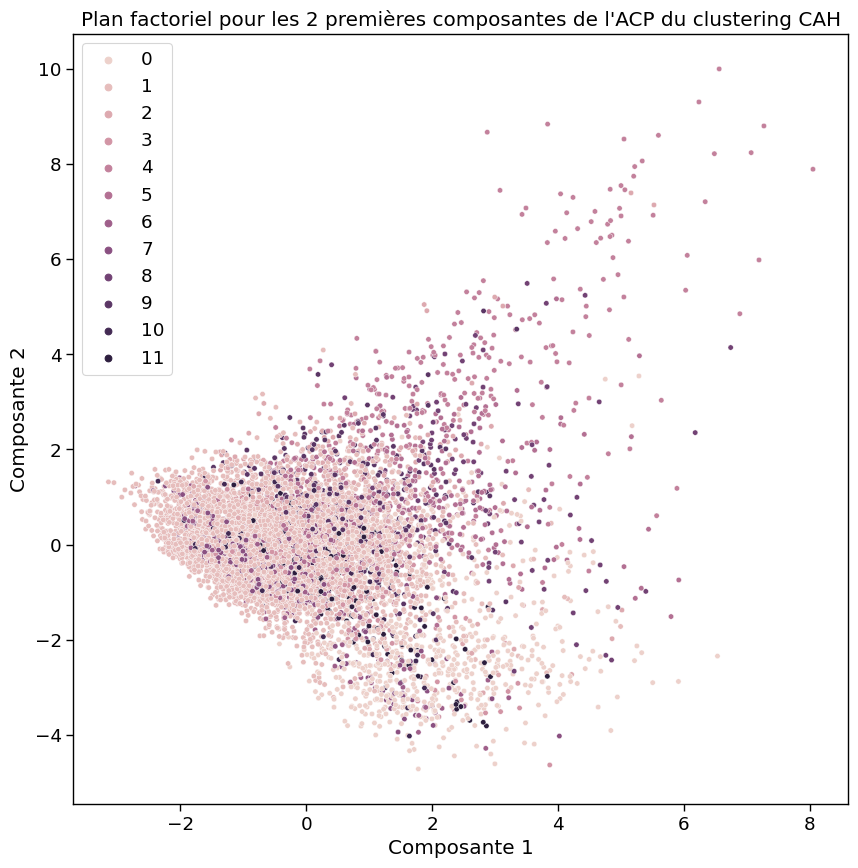

In [64]:
from matplotlib.patches import Circle  # Importe la classe Circle de la bibliothèque matplotlib.patches
sns.set_context("paper", font_scale=1.5)  # Configure le contexte des graphiques avec une échelle de police de 1.5
plt.figure(figsize=(10, 10))  # Crée une nouvelle figure avec une taille de 10 pouces de largeur et 10 pouces de hauteur
chaine = "Plan factoriel pour les 2 premières composantes de l'ACP du clustering CAH"
# Définit la chaîne de caractères à utiliser comme titre du graphique
plt.title(chaine)  # Définit le titre du graphique
plt.xlabel('Composante 1')  # Définit l'étiquette de l'axe x
plt.ylabel('Composante 2')  # Définit l'étiquette de l'axe y
ax = plt.gca()  # Récupère les axes actuels du graphique

sns.scatterplot(x=graph['x_pca'], y=graph['y_pca'], hue=cah.labels_, alpha=1, s=15, legend='full')
# Tracé du scatter plot avec les coordonnées des points projetés en PCA, les étiquettes de clusters de CAH,
# et des paramètres supplémentaires pour l'opacité (alpha), la taille des points (s) et l'affichage de la légende

sns.set_context("paper", font_scale=1)  # Rétablit le contexte des graphiques avec une échelle de police de 1


Voici une description détaillée du code :

- from matplotlib.patches import Circle importe la classe Circle de la bibliothèque matplotlib.patches, bien que cette importation ne soit pas utilisée dans le code donné.
- sns.set_context("paper", font_scale=1.5) configure le contexte des graphiques en utilisant le style "paper" avec une échelle de police de 1.5. Cela ajuste la taille du texte et des éléments du graphique pour un affichage adapté aux publications scientifiques.
- plt.figure(figsize=(10, 10)) crée une nouvelle figure avec une taille de 10 pouces de largeur et 10 pouces de hauteur pour préparer la visualisation.
- chaine = "Plan factoriel pour les 2 premières composantes de l'ACP du clustering CAH" définit la chaîne de caractères à utiliser comme titre du graphique pour décrire le contenu du graphique.
- plt.title(chaine) définit le titre du graphique avec la chaîne de caractères précédemment définie.
- plt.xlabel('Composante 1') définit l'étiquette de l'axe x du graphique pour indiquer la signification de la première composante principale (PC1) de l'analyse en composantes principales (ACP).
- plt.ylabel('Composante 2') définit l'étiquette de l'axe y du graphique pour indiquer la signification de la deuxième composante principale (PC2) de l'ACP.
- ax = plt.gca() récupère les axes actuels du graphique pour pouvoir les manipuler ou ajouter des éléments supplémentaires.
- sns.scatterplot(x=graph['x_pca'], y=graph['y_pca'], hue=cah.labels_, alpha=1, s=15, legend='full') trace le scatter plot en utilisant les coordonnées des points projetés en PCA (graph['x_pca'] et graph['y_pca']), les étiquettes de clusters de CAH (cah.labels_), ainsi que d'autres paramètres pour l'opacité (alpha), la taille des points (s) et l'affichage de la légende (legend='full').
- sns.set_context("paper", font_scale=1) rétablit le contexte des graphiques avec une échelle de police de 1, qui est plus adaptée pour une visualisation normale.

Ce code permet donc de tracer un scatter plot pour représenter les données projetées en PCA avec les étiquettes de clusters attribuées par CAH. Les composantes 1 et 2 de l'ACP sont utilisées comme coordonnées sur les axes x et y du graphique, respectivement. Les points sont colorés en fonction des clusters de CAH et d'autres paramètres sont ajustés pour l'opacité et la taille des points. Le graphique est ensuite affiché avec le titre, les étiquettes d'axe appropriées et une échelle de police adaptée.

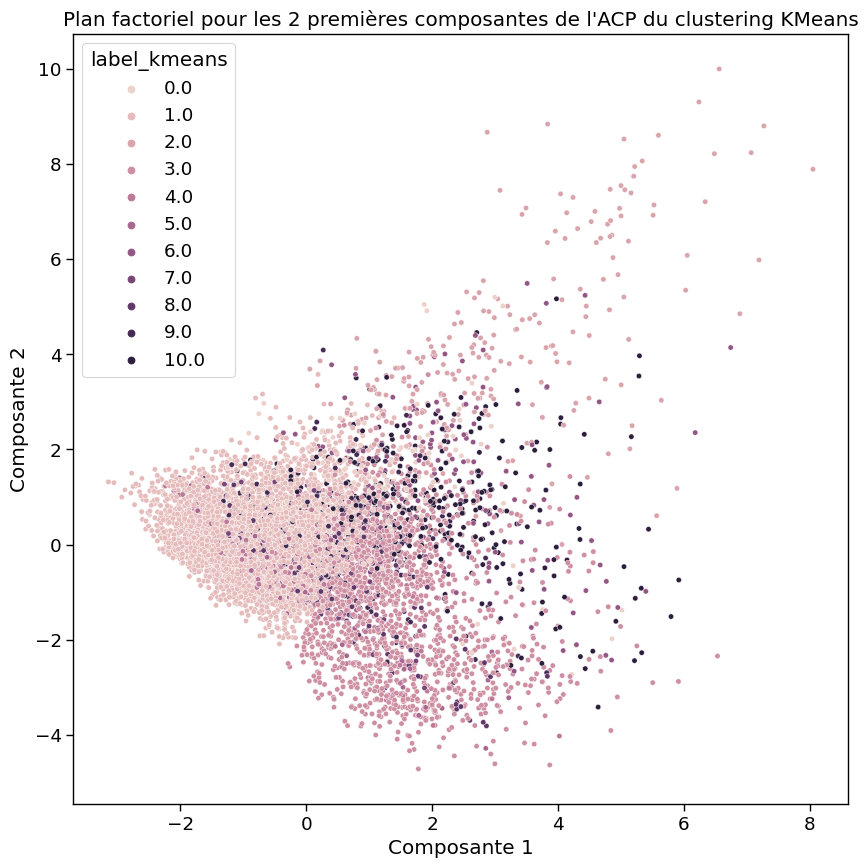

In [65]:
# from matplotlib.patches import Circle
# sns.set_context("paper", font_scale=1.5) 
# plt.figure(figsize=(10,10))
# chaine = "Plan factoriel pour les 2 premières composantes de l'ACP \
# du clustering KMeans"
# plt.title(chaine)
# plt.xlabel('Composante 1')
# plt.ylabel('Composante 2')
# ax = plt.gca()

# sns.scatterplot(x = graph['x_pca'], 
#                 y = graph['y_pca'], 
#                 hue = graph['label_kmeans'],
#                 alpha=1, s=15, legend='full')

# sns.set_context("paper", font_scale=1) 
from matplotlib.patches import Circle
import seaborn as sns

# Définir le contexte et l'échelle de police pour la représentation graphique
sns.set_context("paper", font_scale=1.5)

# Créer une nouvelle figure
plt.figure(figsize=(10, 10))

# Définir le titre de la représentation graphique
chaine = "Plan factoriel pour les 2 premières composantes de l'ACP du clustering KMeans"
plt.title(chaine)

# Définir les labels pour les axes x et y
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')

# Obtenir l'objet des axes actuels
ax = plt.gca()

# Créer un nuage de points pour représenter les données
sns.scatterplot(x=graph['x_pca'], 
                y=graph['y_pca'], 
                hue=graph['label_kmeans'],
                alpha=1, s=15, legend='full')

# Réinitialiser le contexte et l'échelle de police
sns.set_context("paper", font_scale=1)


Ce code génère une représentation graphique sous forme de nuage de points des données dans le plan en 2D défini par les deux premières composantes principales (composante 1 et composante 2) obtenues à partir du clustering KMeans. Le dataframe graph contient les coordonnées des points de données (x_pca et y_pca) ainsi que les étiquettes de cluster correspondantes (label_kmeans). Le nuage de points utilise les étiquettes de cluster pour la coloration des points.

In [66]:
silhouette_score(X = X_pca, labels= cah.labels_)

0.2054800832609957

In [67]:
# import numpy as np
# import pandas as pd
# from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
# from sklearn.metrics import silhouette_score, davies_bouldin_score

# # Charger les données (remplacez les données fictives avec vos propres données)
# # data = pd.read_csv("votre_fichier.csv")

# # Sélection des méthodes de clustering à comparer
# clustering_methods = {
#     "K-means": KMeans(n_clusters=5),
#     "DBSCAN": DBSCAN(eps=0.5, min_samples=5),
#     "CAH": AgglomerativeClustering(n_clusters=5)
# }

# # Préparation des données (remplacez cette étape avec votre prétraitement des données)

# # Évaluation des méthodes de clustering
# evaluation_scores = {}

# for method_name, method in clustering_methods.items():
#     # Appliquer la méthode de clustering sur les données
#     labels = method.fit_predict(data)
    
#     # Calculer les scores d'évaluation (score de silhouette et indice de Davies-Bouldin)
#     silhouette_score_value = silhouette_score(data, labels)
#     davies_bouldin_score_value = davies_bouldin_score(data, labels)
    
#     # Enregistrer les scores d'évaluation
#     evaluation_scores[method_name] = {"Silhouette Score": silhouette_score_value,
#                                       "Davies-Bouldin Score": davies_bouldin_score_value}

# # Comparaison des résultats
# for method_name, scores in evaluation_scores.items():
#     print(f"Méthode: {method_name}")
#     print(f"Silhouette Score: {scores['Silhouette Score']}")
#     print(f"Davies-Bouldin Score: {scores['Davies-Bouldin Score']}")
#     print("-------------------------------------")

# # Sélection de la meilleure méthode de clustering
# best_method = max(evaluation_scores, key=lambda x: evaluation_scores[x]['Silhouette Score'])
# print(f"La meilleure méthode de clustering est : {best_method}")


## Conclusion

Le Kmeans semble mieux fonctionner que les autres méthodes de clustering, essayons d'appliquer cet algorithme à l'ensemble du jeu de données.


# Ensemble du jeu de données

## Préparation jeu de donnée complet

In [68]:
# X_tot=data.copy()

# categorical_columns = X_tot.select_dtypes(['category','object']).columns
# numerical_columns = X_tot.select_dtypes(['int32','float64']).columns

# ohe = OneHotEncoder(sparse=False)
# ss = StandardScaler()
# X_tot[numerical_columns] = ss.fit_transform(X_tot[numerical_columns])
# ohe.fit(X_tot[categorical_columns])

# Copier les données dans un nouveau dataframe X_tot
X_tot = data.copy()

# Sélectionner les colonnes catégorielles et de type objet
categorical_columns = X_tot.select_dtypes(['category', 'object']).columns

# Sélectionner les colonnes numériques
numerical_columns = X_tot.select_dtypes(['int32', 'float64']).columns

# Créer une instance de l'encodeur one-hot
ohe = OneHotEncoder(sparse=False)

# Créer une instance du standardiseur
ss = StandardScaler()

# Standardiser les colonnes numériques dans X_tot
X_tot[numerical_columns] = ss.fit_transform(X_tot[numerical_columns])

# Adapter l'encodeur one-hot aux colonnes catégorielles de X_tot
ohe.fit(X_tot[categorical_columns])


OneHotEncoder(sparse=False)

Ces étapes permettent de prétraiter les données en standardisant les colonnes numériques et en encodant les colonnes catégorielles en utilisant l'encodeur one-hot. Cela prépare les données pour être utilisées dans les méthodes de clustering.

In [69]:
# X_tot = pd.merge(X_tot[numerical_columns], 
#           pd.DataFrame(columns = ohe.get_feature_names().tolist(),
#               data = ohe.fit_transform(X_tot[categorical_columns])).set_index(X_tot.index),
#         left_index = True, right_index = True)
# Fusionner les colonnes numériques et les colonnes encodées par one-hot
X_tot = pd.merge(
    X_tot[numerical_columns],  # Sélectionner les colonnes numériques de X_tot
    pd.DataFrame(
        columns=ohe.get_feature_names().tolist(),  # Créer un dataframe vide avec les noms des colonnes encodées
        data=ohe.fit_transform(X_tot[categorical_columns])  # Encoder les colonnes catégorielles et remplir le dataframe
    ).set_index(X_tot.index),  # Définir les mêmes index que X_tot
    left_index=True, right_index=True  # Effectuer la fusion en utilisant les index comme clé de jointure
)


Ce code réalise les étapes suivantes :

- Sélectionne les colonnes numériques du dataframe X_tot.
- Crée un dataframe vide avec les noms des colonnes encodées par one-hot, en utilisant la méthode get_feature_names() de l'encodeur one-hot.
- Encode les colonnes catégorielles de X_tot en utilisant l'encodeur one-hot, et remplit le dataframe vide avec les résultats de l'encodage.
- Définit les mêmes index que le dataframe X_tot pour le nouveau dataframe encodé.
- Fusionne les colonnes numériques de X_tot avec les colonnes encodées par one-hot en utilisant les index comme clé de jointure.

Cela permet de combiner les colonnes numériques et les colonnes encodées par one-hot dans un seul dataframe X_tot, qui est utilisé pour l'analyse de clustering.

## ACP

In [70]:
pca_tot = PCA(random_state=1)

In [71]:
pca_tot.fit(X_tot)

PCA(random_state=1)

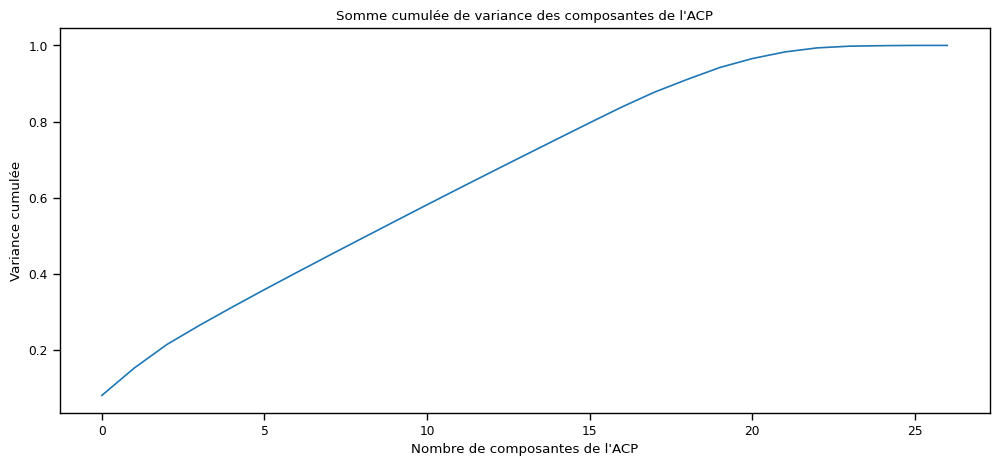

In [72]:
# plt.figure(figsize=(12,5))
# plt.title('Somme cumulée de variance des composantes de l\'ACP')
# plt.xlabel('Nombre de composantes de l\'ACP')
# plt.ylabel('Variance cumulée')
# plt.plot(list(range(X_tot.shape[1])),
#          np.cumsum(pca_tot.explained_variance_ratio_))
# Créer une figure avec une taille spécifiée
plt.figure(figsize=(12, 5))

# Définir le titre du graphique
plt.title("Somme cumulée de variance des composantes de l'ACP")

# Définir le label de l'axe x
plt.xlabel("Nombre de composantes de l'ACP")

# Définir le label de l'axe y
plt.ylabel("Variance cumulée")

# Tracer la courbe de la somme cumulée de variance expliquée par les composantes de l'ACP
plt.plot(
    list(range(X_tot.shape[1])),  # Liste des nombres de composantes de l'ACP
    np.cumsum(pca_tot.explained_variance_ratio_)  # Somme cumulée de variance expliquée
)

In [73]:
# np.cumsum(pca_tot.explained_variance_ratio_)[19]
# Calculer la somme cumulative des ratios de variance expliquée par les composantes principales
np.cumsum(pca_tot.explained_variance_ratio_)[19]

0.9418237602635152

Ce code effectue les étapes suivantes :

Calcule les ratios de variance expliquée par chaque composante principale de l'objet pca_tot.
Utilise la fonction np.cumsum() pour obtenir la somme cumulative de ces ratios de variance expliquée.
Sélectionne la valeur à l'index 19 de la somme cumulative, ce qui représente la variance expliquée cumulée par les 20 premières composantes principales.
Cela permet de quantifier la proportion de variance totale expliquée par les 20 premières composantes principales de l'analyse en composantes principales (PCA).

On a  94 % de variance avec 20 features

In [74]:
X_pca_tot = pca_tot.transform(X_tot)[:,:19]

In [75]:
colonnes_pca = X_tot.columns

## Représentation des données

In [76]:
# Calculer les coordonnées de la projection des données sur les trois premières composantes principales
x_show = pca_tot.transform(X_tot.select_dtypes(['float64', 'int32']))[:, 0]
y_show = pca_tot.transform(X_tot.select_dtypes(['float64', 'int32']))[:, 1]
z_show = pca_tot.transform(X_tot.select_dtypes(['float64', 'int32']))[:, 2]

Ce code effectue les étapes suivantes :

Sélectionne les colonnes de X_tot qui sont de type float64 ou int32 à l'aide de select_dtypes().
Utilise pca_tot.transform() pour effectuer la projection des données sélectionnées sur les composantes principales.
Extrait les coordonnées de la projection sur la première composante principale (x_show), la deuxième composante principale (y_show) et la troisième composante principale (z_show).
Cela permet d'obtenir les coordonnées de la projection des données sur les trois premières composantes principales de l'analyse en composantes principales (PCA), ce qui facilite la visualisation dans un espace tridimensionnel.

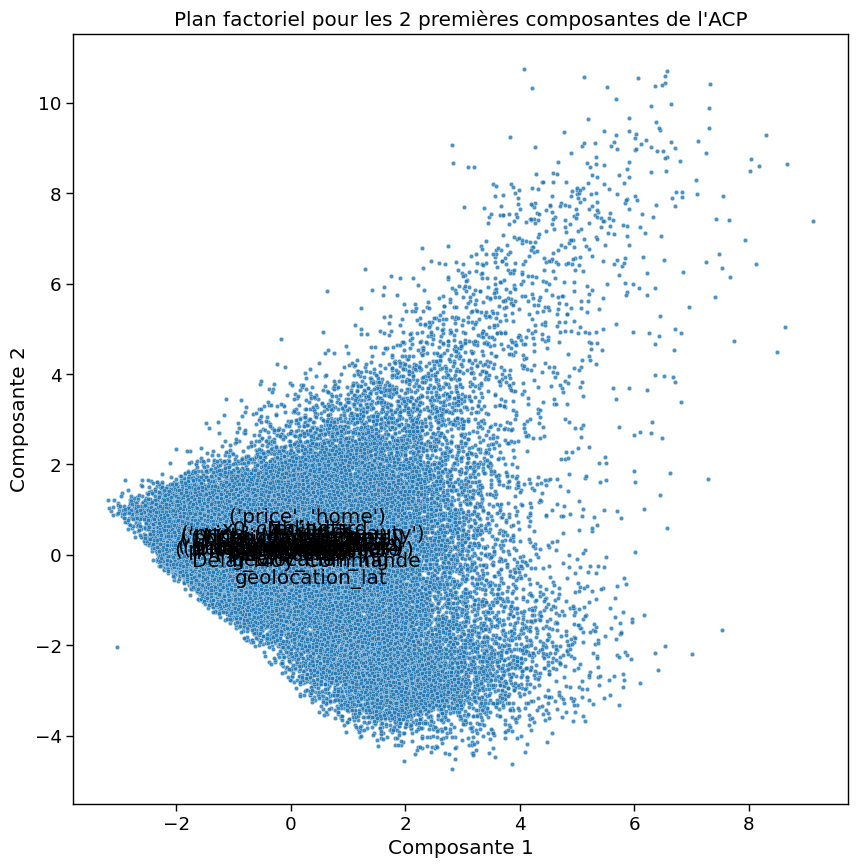

In [77]:
# from matplotlib.patches import Circle
# sns.set_context("paper", font_scale=1.5) 
# plt.figure(figsize=(10,10))
# chaine = "Plan factoriel pour les 2 premières composantes de l'ACP"
# plt.title(chaine)
# plt.xlabel('Composante 1')
# plt.ylabel('Composante 2')
# ax = plt.gca()

# sns.scatterplot(x = x_show,
#                 y = y_show,
#                 #hue = hue_show,
#                 alpha=0.8, s=10)


# i = 0
# '''for x,y,colonne in zip(x_pca,y_pca, colonnes_pca):

#     plt.annotate(colonne, # this is the text
#                  (x,y), # this is the point to label
#                  textcoords="offset points", # how to position the text
#                  xytext=(0,5+np.random.randint(-10,10)), # distance from text to points (x,y)
#                  ha='center') # horizontal alignment can be left, right or center
#     ax.arrow(0, 0, x, y, head_width=0, head_length=0, fc='grey', ec='grey',alpha=0.2)'''


# sns.set_context("paper", font_scale=1) 
# Importer les bibliothèques nécessaires
from matplotlib.patches import Circle
import seaborn as sns

# Paramètres de mise en page
sns.set_context("paper", font_scale=1.5)
plt.figure(figsize=(10, 10))
chaine = "Plan factoriel pour les 2 premières composantes de l'ACP"
plt.title(chaine)
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')
ax = plt.gca()

# Affichage des points de données
sns.scatterplot(x=x_show,
                y=y_show,
                alpha=0.8,
                s=10)

i = 0
# Parcourir les coordonnées des points et les noms des colonnes
for x, y, colonne in zip(x_pca, y_pca, colonnes_pca):
    # Annoter chaque point avec le nom de la colonne correspondante
    plt.annotate(colonne,  # texte à afficher
                 (x, y),  # position du texte
                 textcoords="offset points",  # positionnement du texte par rapport aux points (x, y)
                 xytext=(0, 5+np.random.randint(-10, 10)),  # décalage du texte par rapport aux points
                 ha='center')  # alignement horizontal (gauche, droite ou centre)
    # Tracer des flèches à partir de l'origine (0, 0) vers chaque point
    ax.arrow(0, 0, x, y, head_width=0, head_length=0, fc='grey', ec='grey', alpha=0.2)

sns.set_context("paper", font_scale=1)


Ce code effectue les étapes suivantes :

- Importe les bibliothèques nécessaires.
- Définit les paramètres de mise en page, tels que la taille de la figure et le contexte de la police.
- Crée une figure avec un titre et des étiquettes d'axes.
- Affiche les points de données sur le plan factoriel des deux premières composantes principales.
- Parcourt les coordonnées des points et les noms des colonnes pour annoter chaque point avec le nom de la colonne correspondante.
- Trace des flèches à partir de l'origine (0, 0) vers chaque point pour indiquer la direction de chaque composante principale.
- Rétablit le contexte de la police à sa valeur par défaut.

Cela permet de visualiser les données dans le plan factoriel des deux premières composantes principales de l'analyse en composantes principales (PCA), avec des annotations pour identifier les variables correspondant à chaque point de données.

## KMeans

Modèle KMeans avec le nombre de clusters optimal identifié sur le jeu de données réduit

In [78]:
# kmeans = KMeans(n_clusters=14, 
#                 verbose=1, 
#                 random_state=0).fit(X_pca_tot)
# Importer la classe KMeans du module sklearn.cluster
from sklearn.cluster import KMeans

# Créer une instance de KMeans avec les paramètres suivants :
# - n_clusters : nombre de clusters à former
# - verbose : niveau de verbosité pour le déroulement de l'algorithme
# - random_state : générateur de nombres aléatoires pour la reproductibilité des résultats
kmeans = KMeans(n_clusters=14, verbose=1, random_state=0)

# Appliquer l'algorithme KMeans sur les données X_pca_tot pour effectuer le clustering
kmeans.fit(X_pca_tot)


Initialization complete
Iteration 0, inertia 1060067.6381196892
Iteration 1, inertia 869950.2962416284
Iteration 2, inertia 825115.0447753859
Iteration 3, inertia 814053.5529963054
Iteration 4, inertia 809075.8581792393
Iteration 5, inertia 804926.0166836417
Iteration 6, inertia 801042.650796808
Iteration 7, inertia 796572.3873324448
Iteration 8, inertia 791776.6547110388
Iteration 9, inertia 789338.8531296221
Iteration 10, inertia 788227.2716154779
Iteration 11, inertia 787708.0982759779
Iteration 12, inertia 787444.2073703132
Iteration 13, inertia 787310.4365616718
Iteration 14, inertia 787246.3694844398
Iteration 15, inertia 787215.4121190349
Iteration 16, inertia 787191.2853811501
Iteration 17, inertia 787167.4305487771
Iteration 18, inertia 787147.1203611188
Iteration 19, inertia 787130.8242353639
Iteration 20, inertia 787106.8791091662
Iteration 21, inertia 787065.2836896041
Iteration 22, inertia 786997.5558250782
Iteration 23, inertia 786942.9785383746
Iteration 24, inertia 7869

KMeans(n_clusters=14, random_state=0, verbose=1)

Ce code applique l'algorithme K-means de clustering sur les données `X_pca_tot`. Le clustering est une technique d'apprentissage non supervisé qui vise à regrouper les données similaires en différents clusters en fonction de leurs caractéristiques. 

La ligne `kmeans.fit(X_pca_tot)` exécute l'algorithme K-means sur les données `X_pca_tot`, ce qui signifie qu'il trouve les centres de cluster optimaux et attribue chaque point de données à un cluster spécifique en fonction de sa similarité avec les autres points de données. Les résultats du clustering sont stockés dans l'objet `kmeans`, qui peut ensuite être utilisé pour prédire les clusters pour de nouvelles données ou pour effectuer des analyses supplémentaires sur les clusters obtenus.

In [79]:
kmeans.labels_.shape

(74705,)

Le code `kmeans.labels_.shape` permet de vérifier la forme de l'attribut `labels_` de l'objet `kmeans`. 

L'attribut `labels_` contient les étiquettes de cluster assignées à chaque échantillon dans l'ensemble de données. Il représente le numéro de cluster auquel chaque point de données a été assigné. 

En utilisant `.shape`, on peut obtenir la forme (le nombre de lignes et de colonnes) de l'attribut `labels_`. La forme retournée sera un tuple représentant le nombre d'échantillons (lignes) et le nombre de clusters (colonnes). 

Par exemple, si `kmeans.labels_.shape` renvoie `(1000, 1)`, cela signifie qu'il y a 1000 échantillons et 1 colonne (1 cluster). 

Il existe également d'autres attributs et méthodes disponibles dans l'objet `kmeans` pour analyser les résultats du clustering, tels que :

- `cluster_centers_` : les coordonnées des centres de cluster
- `inertia_` : la somme des distances carrées des échantillons à leur centre de cluster le plus proche (c'est une mesure de la cohésion des clusters)
- `predict(X)` : prédit les clusters pour de nouvelles données `X`
- `fit_predict(X)` : effectue l'apprentissage et la prédiction en un seul appel pour les données `X`
- et d'autres encore, qui peuvent être consultés dans la documentation de la classe `KMeans` de scikit-learn.

In [80]:
# silhouette_score(X = X_pca_tot, labels= kmeans.labels_)
from sklearn.metrics import silhouette_score

# Calcul du score de silhouette pour évaluer la qualité du clustering
silhouette_score(X=X_pca_tot, labels=kmeans.labels_)

0.22910530778915708

- La première ligne importe la fonction `silhouette_score` du module `sklearn.metrics`.
- La deuxième ligne calcule le score de silhouette pour évaluer la qualité du clustering. La fonction `silhouette_score` prend deux arguments :
   - `X` : la matrice des données d'entrée sur laquelle le clustering a été effectué.
   - `labels` : les étiquettes de cluster attribuées à chaque échantillon.
- Le résultat du score de silhouette est retourné. Il mesure à quel point chaque échantillon est similaire à ses propres points du cluster par rapport aux autres points des autres clusters. Un score de silhouette proche de 1 indique une bonne séparation des clusters, tandis qu'un score proche de -1 indique un chevauchement entre les clusters.

N'oubliez pas d'importer le module `sklearn.metrics` au préalable pour pouvoir utiliser la fonction `silhouette_score`.

In [81]:
# inertia = {}
# dict_kmeans = {}
# dict_silhouette = {}
# for k in range(13,16):
#     kmeans = KMeans(n_clusters=k,
#                    verbose=1,
#                    random_state=0,
#                    n_jobs=-1).fit(X_pca_tot)
#     inertia[k] = kmeans.inertia_
#     dict_kmeans[k] = kmeans
#     dict_silhouette[k] = silhouette_score(X = X_pca_tot, labels= kmeans.labels_)
#     print('Boucle {} - Silhouette score : {}'.format(k, dict_silhouette[k]))
inertia = {}  # Dictionnaire pour stocker les valeurs d'inertie
dict_kmeans = {}  # Dictionnaire pour stocker les objets KMeans
dict_silhouette = {}  # Dictionnaire pour stocker les scores de silhouette

# Boucle pour itérer sur différentes valeurs de k
for k in range(13, 16):
    kmeans = KMeans(n_clusters=k,
                    verbose=1,
                    random_state=0).fit(X_pca_tot)
    
    inertia[k] = kmeans.inertia_  # Stocke la valeur d'inertie dans le dictionnaire inertia
    dict_kmeans[k] = kmeans  # Stocke l'objet KMeans dans le dictionnaire dict_kmeans
    dict_silhouette[k] = silhouette_score(X=X_pca_tot, labels=kmeans.labels_)  # Calcule le score de silhouette et le stocke dans le dictionnaire dict_silhouette
    
    # Affiche le score de silhouette pour chaque boucle
    print('Boucle {} - Silhouette score : {}'.format(k, dict_silhouette[k]))    

Initialization complete
Iteration 0, inertia 1108904.3322318422
Iteration 1, inertia 920214.6898760975
Iteration 2, inertia 875282.4156076706
Iteration 3, inertia 863937.0964417631
Iteration 4, inertia 858849.7987583057
Iteration 5, inertia 854500.6973219325
Iteration 6, inertia 849984.5884444567
Iteration 7, inertia 844645.7318764195
Iteration 8, inertia 840762.7741044492
Iteration 9, inertia 839013.1880061061
Iteration 10, inertia 838241.6068985119
Iteration 11, inertia 837872.8016885098
Iteration 12, inertia 837689.8938148215
Iteration 13, inertia 837606.7771792724
Iteration 14, inertia 837570.5915077467
Iteration 15, inertia 837554.4959445574
Iteration 16, inertia 837546.2669865837
Iteration 17, inertia 837543.5163834722
Converged at iteration 17: center shift 5.4433190884805086e-05 within tolerance 0.0001120127543516032.
Initialization complete
Iteration 0, inertia 1112272.4967003288
Iteration 1, inertia 936677.77546324
Iteration 2, inertia 906955.8618452947
Iteration 3, inertia 8

- La première ligne crée un dictionnaire vide appelé `inertia` pour stocker les valeurs d'inertie.
- La deuxième ligne crée un dictionnaire vide appelé `dict_kmeans` pour stocker les objets KMeans.
- La troisième ligne crée un dictionnaire vide appelé `dict_silhouette` pour stocker les scores de silhouette.
- La boucle `for` itère sur les valeurs de `k` de 13 à 15.
- À chaque itération, un objet `KMeans` est créé avec le nombre de clusters `k` spécifié, et les options `verbose=1`, `random_state=0` et `n_jobs=-1` sont définies.
- La valeur d'inertie obtenue à partir de l'objet `KMeans` est stockée dans le dictionnaire `inertia` avec `k` comme clé.
- L'objet `KMeans` est stocké dans le dictionnaire `dict_kmeans` avec `k` comme clé.
- Le score de silhouette est calculé à l'aide de la fonction `silhouette_score` en utilisant les données `X_pca_tot` et les étiquettes de cluster attribuées par l'objet `KMeans`. Le score de silhouette est ensuite stocké dans le dictionnaire `dict_silhouette` avec `k` comme clé.
- À chaque itération, le score de silhouette est affiché.


In [82]:
# if False:
#     inertia = {}
#     dict_kmeans = {}
#     dict_silhouette = {}
#     for k in range(3,15):
#         kmeans = KMeans(n_clusters=k,
#                        verbose=1,
#                        random_state=0,
#                        n_jobs=-1).fit(X_pca_tot)
#         inertia[k] = kmeans.inertia_
#         dict_kmeans[k] = kmeans
#         dict_silhouette[k] = silhouette_score(X = X_pca_tot, labels= kmeans.labels_)
#         print('Boucle {} - Silhouette score : {}'.format(k, dict_silhouette[k]))
if False:
    inertia = {}  # Dictionnaire pour stocker les valeurs d'inertie
    dict_kmeans = {}  # Dictionnaire pour stocker les objets KMeans
    dict_silhouette = {}  # Dictionnaire pour stocker les scores de silhouette

    # Boucle pour itérer sur différentes valeurs de k
    for k in range(3, 15):
        kmeans = KMeans(n_clusters=k,
                        verbose=1,
                        random_state=0).fit(X_pca_tot)

        inertia[k] = kmeans.inertia_  # Stocke la valeur d'inertie dans le dictionnaire inertia
        dict_kmeans[k] = kmeans  # Stocke l'objet KMeans dans le dictionnaire dict_kmeans
        dict_silhouette[k] = silhouette_score(X=X_pca_tot, labels=kmeans.labels_)  # Calcule le score de silhouette et le stocke dans le dictionnaire dict_silhouette

        # Affiche le score de silhouette pour chaque boucle
        print('Boucle {} - Silhouette score : {}'.format(k, dict_silhouette[k]))

- La ligne `if False:` est une condition qui est toujours évaluée à `False`, ce qui signifie que le code à l'intérieur de cette condition ne sera pas exécuté.
- Les lignes suivantes sont identiques au code précédent, et elles créent les mêmes dictionnaires (`inertia`, `dict_kmeans` et `dict_silhouette`) et effectuent les mêmes calculs pour différentes valeurs de `k`.
- Cependant, comme la condition est toujours `False`, le code à l'intérieur de cette condition ne sera jamais exécuté et les dictionnaires `inertia`, `dict_kmeans` et `dict_silhouette` ne seront pas remplis ni affichés.

* Boucle 13 - Silhouette score : 0.22938337882766385
* Boucle 14 - Silhouette score : 0.2380033975405801
* Boucle 15 - Silhouette score : 0.14908158723434908


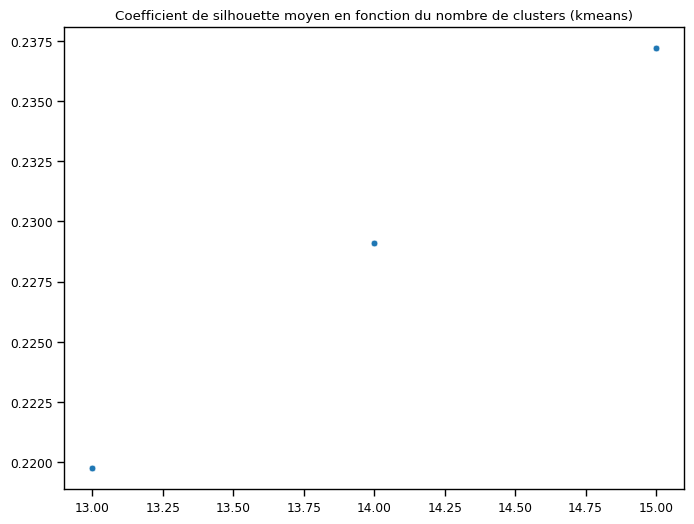

In [83]:
plt.figure(figsize=(8, 6))  # Crée une nouvelle figure avec une taille de 8x6 pouces
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')  # Définit le titre du graphique

# Trace un nuage de points avec le nombre de clusters sur l'axe x et le score de silhouette moyen sur l'axe y
sns.scatterplot(x=list(dict_silhouette.keys()),
                y=list(dict_silhouette.values()))

plt.show()  # Affiche le graphique 

Le coefficient de silhouette est maximal pour 14 clusters

Ce code excecute :
- La première ligne crée une nouvelle figure avec une taille de 8x6 pouces pour le graphique.
- La deuxième ligne définit le titre du graphique.
- La troisième ligne utilise la fonction `sns.scatterplot()` pour tracer un nuage de points. L'axe x représente le nombre de clusters (`list(dict_silhouette.keys())`) et l'axe y représente le score de silhouette moyen (`list(dict_silhouette.values())`).
- Enfin, la dernière ligne `plt.show()` affiche le graphique.

## Clustering hiérarchique

In [84]:
# from joblib import Memory
# if False:
#     cah_total = AgglomerativeClustering(n_clusters = 14, memory=Memory('/cache')
#                              ).fit(X_pca_tot)

# from joblib import Memory  # Importe la classe Memory depuis le module joblib

# # if False:  # Condition toujours fausse, le code ci-dessous ne sera pas exécuté
# cah_total = AgglomerativeClustering(n_clusters=14, memory=Memory('/cache')).fit(X_pca_tot)

# from joblib import Memory
# from sklearn.cluster import AgglomerativeClustering

# # Création d'un objet Memory pour le cache
# memory = Memory('/cache')

# @memory.cache  # Utilisation du cache pour éviter les problèmes de mémoire
# def fit_cah(X):
#     cah = AgglomerativeClustering(n_clusters=14)
#     return cah.fit(X)

# # Appel de la fonction fit_cah avec les données X_pca_tot
# cah_total = fit_cah(X_pca_tot)


In [85]:
# from sklearn.cluster import AgglomerativeClustering

# batch_size = 1000000  # Taille du sous-ensemble de données à traiter à la fois
# n_samples = X_pca_tot.shape[0]  # Nombre total d'échantillons
# n_clusters = 14  # Nombre de clusters souhaité
# cah_total = None

# for i in range(0, n_samples, batch_size):
#     start_index = i
#     end_index = min(i + batch_size, n_samples)
#     X_batch = X_pca_tot[start_index:end_index]  # Sous-ensemble de données à traiter
    
#     cah = AgglomerativeClustering(n_clusters=n_clusters)
#     cah_batch = cah.fit(X_batch)
    
#     if cah_total is None:
#         cah_total = cah_batch
#     else:
#         cah_total.labels_ = np.concatenate([cah_total.labels_, cah_batch.labels_])



Non applicable (problème mémoire)

## Exports

Exportons notre modèle et notre jeu de données

In [86]:
# #export kmeans
# filename = 'models/kmeans_14_full_dataset.obj' 
# with  open(filename, 'wb') as filehandler :
#     pickle.dump(dict_kmeans[14], filehandler)

# # Export du modèle K-means
# filename = 'models/kmeans_14_full_dataset.obj'  # Nom du fichier de sauvegarde
# with open(filename, 'wb') as filehandler:  # Ouverture du fichier en mode écriture binaire
#     pickle.dump(dict_kmeans[14], filehandler)  # Sauvegarde du modèle K-means dans le fichier

import os

# Export du modèle K-means
directory = 'models'  # Nom du répertoire
filename = 'kmeans_14_full_dataset.obj'  # Nom du fichier de sauvegarde
filepath = os.path.join(directory, filename)  # Chemin complet du fichier

# Vérification et création du répertoire si nécessaire
if not os.path.exists(directory):
    os.makedirs(directory)

# Sauvegarde du modèle K-means dans le fichier
with open(filepath, 'wb') as filehandler:  # Ouverture du fichier en mode écriture binaire
    pickle.dump(dict_kmeans[14], filehandler)  # Sauvegarde du modèle K-means dans le fichier


In [87]:
# #export OHE
# filename = 'models/ohe.obj' 
# with  open(filename, 'wb') as filehandler :
#     pickle.dump(ohe, filehandler)
    
# #export SS
# filename = 'models/ss.obj' 
# with  open(filename, 'wb') as filehandler :
#     pickle.dump(ss, filehandler)
    
# #export modèle PCA
# filename = 'models/pca_tot.obj' 
# with  open(filename, 'wb') as filehandler :
#     pickle.dump(pca_tot, filehandler)
# Export du One-Hot Encoder (OHE)
filename_ohe = 'models/ohe.obj'  # Nom du fichier de sauvegarde pour le One-Hot Encoder
with open(filename_ohe, 'wb') as filehandler:  # Ouverture du fichier en mode écriture binaire
    pickle.dump(ohe, filehandler)  # Sauvegarde du One-Hot Encoder dans le fichier

# Export du StandardScaler (SS)
filename_ss = 'models/ss.obj'  # Nom du fichier de sauvegarde pour le StandardScaler
with open(filename_ss, 'wb') as filehandler:  # Ouverture du fichier en mode écriture binaire
    pickle.dump(ss, filehandler)  # Sauvegarde du StandardScaler dans le fichier

# Export du modèle PCA
filename_pca = 'models/pca_tot.obj'  # Nom du fichier de sauvegarde pour le modèle PCA
with open(filename_pca, 'wb') as filehandler:  # Ouverture du fichier en mode écriture binaire
    pickle.dump(pca_tot, filehandler)  # Sauvegarde du modèle PCA dans le fichier

Dans ce code, nous exportons les objets OHE, SS et PCA dans des fichiers pour une utilisation ultérieure. 

- Pour chaque export, nous avons une variable `filename` qui contient le chemin et le nom du fichier de sauvegarde où nous souhaitons stocker l'objet correspondant. Assurez-vous d'adapter le chemin et le nom de fichier selon vos besoins.
- Pour chaque export, la ligne `with open(filename, 'wb') as filehandler:` ouvre le fichier en mode écriture binaire. L'utilisation du gestionnaire de contexte `with` garantit que le fichier sera correctement fermé après son utilisation.
- Pour chaque export, `pickle.dump(objet, filehandler)` enregistre l'objet (OHE, SS ou PCA) dans le fichier spécifié. La fonction `pickle.dump()` sérialise l'objet et l'écrit dans le fichier binaire.

### Import

In [88]:
file = open('models/kmeans_14_full_dataset.obj', 'rb')
model = pickle.load(file)

## Représentation des variables 

In [89]:
nb_clusters = 14
if False:
    tsne = TSNE(n_components=2)
    T = tsne.fit_transform(X_pca_tot.copy())
    graph = pd.DataFrame(data = [T[:,0], T[:,1], model.labels_]).T
    graph.columns = ['X', 'Y', 'label']
    plt.figure(figsize=(10,10))
    plt.title('Représentation de la séparation des données du KMEANS via T-SNE')
    sns.scatterplot(graph['X'], graph['Y'], hue = graph['label'], legend='full',
                   palette=sns.color_palette("hls",14),
                    alpha=1, s=15,)
    plt.legend(loc='upper left', labels=graph['label'].unique())
    plt.show()    
else:
        graph = pd.DataFrame(data = [model.labels_]).T
        graph.columns = ['label']


In [90]:
# Réduction de dimensions avec t-SNE
nb_clusters = 14  # Nombre de clusters souhaité
tsne = TSNE(n_components=2)  # Création d'un objet t-SNE avec 2 dimensions
T = tsne.fit_transform(X_pca_tot.copy())  # Réduction de dimensions de X_pca_tot avec t-SNE

# Création d'un DataFrame pour la visualisation
graph = pd.DataFrame(data=[T[:, 0], T[:, 1], model.labels_]).T  # Création d'un DataFrame avec les coordonnées réduites et les labels
graph.columns = ['X', 'Y', 'label']  # Définition des noms de colonnes du DataFrame

# Affichage de la séparation des données du K-means via t-SNE
plt.figure(figsize=(10, 10))  # Création d'une figure avec la taille spécifiée
plt.title('Représentation de la séparation des données du KMEANS via T-SNE')  # Titre du graphique

# Affichage des points en utilisant un nuage de points coloré par cluster
sns.scatterplot(graph['X'], graph['Y'], hue=graph['label'], legend='full',
                palette=sns.color_palette("hls", nb_clusters),
                alpha=1, s=15)  # Utilisation de la palette de couleurs 'hls' avec le nombre de clusters spécifié
plt.legend(loc='upper left', labels=graph['label'].unique())  # Affichage de la légende avec les labels de clusters uniques
plt.show()  # Affichage du graphique


Un objet t-SNE (t-distributed Stochastic Neighbor Embedding) est un algorithme de réduction de dimension non linéaire couramment utilisé pour la visualisation de données à haute dimension. Il est largement utilisé pour visualiser des données complexes dans un espace bidimensionnel (2D), permettant ainsi de mieux comprendre la structure sous-jacente des données et les relations entre les échantillons.

La ligne de code `tsne = TSNE(n_components=2)` crée un objet t-SNE avec deux composantes (n_components=2). Les deux composantes correspondent aux deux dimensions du nouvel espace dans lequel les données seront réduites.

La ligne de code suivante `T = tsne.fit_transform(X_pca_tot.copy())` applique l'algorithme t-SNE à `X_pca_tot`, qui est la matrice des données après avoir été prétraitées avec l'analyse en composantes principales (PCA). Le résultat est stocké dans `T`, qui représente les données réduites dans les deux nouvelles dimensions.

Le t-SNE fonctionne en modélisant les similitudes entre les points d'origine (dans l'espace à haute dimension) et en cherchant à conserver ces similitudes dans l'espace réduit à deux dimensions. Il est particulièrement utile pour visualiser des données complexes, telles que des données provenant d'analyses de texte ou d'images, où les relations non linéaires entre les échantillons sont importantes.

En résumé, l'objet t-SNE permet de réduire la dimensionnalité de données complexes dans un espace à deux dimensions afin de faciliter leur visualisation et de mettre en évidence les structures et relations cachées entre les échantillons. Il est couramment utilisé dans l'analyse exploratoire de données et la visualisation des résultats d'algorithmes de traitement de données.

Dans ce code, nous utilisons t-SNE pour réduire les dimensions des données X_pca_tot en 2 dimensions (`n_components=2`). Ensuite, nous créons un DataFrame `graph` avec les coordonnées réduites et les labels du modèle K-means. Nous utilisons la fonction `sns.scatterplot()` pour afficher les points en utilisant un nuage de points coloré par cluster, avec une légende affichant les labels de clusters uniques. Le nombre de clusters est spécifié avec `nb_clusters` pour créer une palette de couleurs correspondant à ce nombre de clusters. Enfin, nous utilisons `plt.show()` pour afficher le graphique t-SNE.

In [ ]:
# Ajout des coordonnées réduites x_show, y_show et z_show au DataFrame graph
graph['x_pca'] = x_show  # Colonne 'x_pca' avec les coordonnées x_show
graph['y_pca'] = y_show  # Colonne 'y_pca' avec les coordonnées y_show
graph['z_pca'] = z_show  # Colonne 'z_pca' avec les coordonnées z_show

Dans ce code, nous ajoutons les coordonnées réduites `x_show`, `y_show` et `z_show` au DataFrame `graph`. Nous créons ainsi trois nouvelles colonnes dans le DataFrame pour stocker ces coordonnées dans les colonnes 'x_pca', 'y_pca' et 'z_pca'.

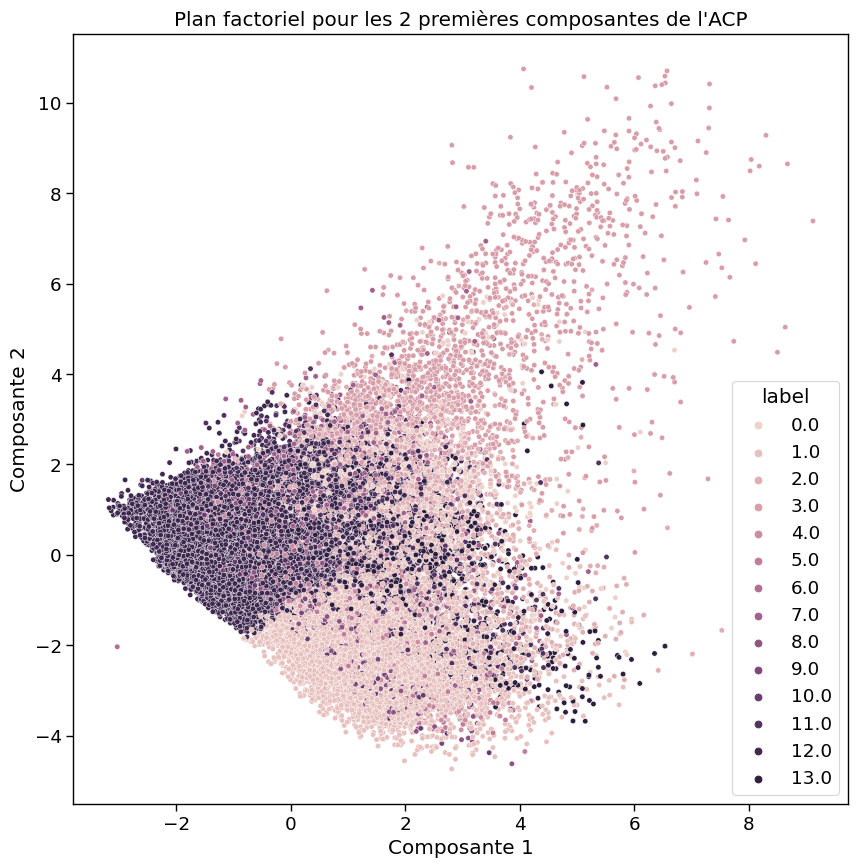

In [ ]:
# from matplotlib.patches import Circle
# sns.set_context("paper", font_scale=1.5) 
# plt.figure(figsize=(10,10))
# chaine = "Plan factoriel pour les 2 premières composantes de l'ACP"
# plt.title(chaine)
# plt.xlabel('Composante 1')
# plt.ylabel('Composante 2')
# ax = plt.gca()

# sns.scatterplot(x = graph['x_pca'], 
#                 y = graph['y_pca'], 
#                 hue = graph['label'],
#                 alpha=1, s=15, legend='full')

# sns.set_context("paper", font_scale=1) 
from matplotlib.patches import Circle
sns.set_context("paper", font_scale=1.5)  # Définit le contexte de l'affichage pour la taille de la police
plt.figure(figsize=(10, 10))  # Crée une figure avec la taille spécifiée

# Définit la chaîne de caractères pour le titre du graphique
chaine = "Plan factoriel pour les 2 premières composantes de l'ACP"
plt.title(chaine)  # Définit le titre du graphique
plt.xlabel('Composante 1')  # Définit le label de l'axe des abscisses
plt.ylabel('Composante 2')  # Définit le label de l'axe des ordonnées
ax = plt.gca()  # Obtient l'axe actuel

# Affichage des points du graphique t-SNE avec les couleurs correspondant aux clusters
sns.scatterplot(x=graph['x_pca'], 
                y=graph['y_pca'], 
                hue=graph['label'],
                alpha=1, s=15, legend='full')

sns.set_context("paper", font_scale=1)  # Réinitialise le contexte de l'affichage pour la taille de la police

Dans ce code, nous utilisons `sns.set_context()` pour définir le contexte de l'affichage avec une taille de police spécifique. Ensuite, nous créons une figure avec la taille spécifiée à l'aide de `plt.figure()`. La chaîne de caractères `chaine` est définie pour le titre du graphique à l'aide de `plt.title()`, et les labels des axes des abscisses et des ordonnées sont définis avec `plt.xlabel()` et `plt.ylabel()`, respectivement. L'objet `ax` est créé pour obtenir l'axe actuel à l'aide de `plt.gca()`.

Ensuite, nous utilisons `sns.scatterplot()` pour afficher les points du graphique t-SNE avec les coordonnées `x_pca` et `y_pca` comme abscisses et ordonnées, respectivement. Les couleurs des points correspondent aux clusters, définis par la colonne 'label' dans le DataFrame `graph`. Les paramètres `alpha=1` et `s=15` définissent respectivement la transparence et la taille des points du nuage de points. Enfin, nous utilisons `sns.set_context()` pour réinitialiser le contexte de l'affichage pour la taille de la police.

<Axes: title={'center': "Distribution du nombre d'individus par cluster, en pourcentage"}>

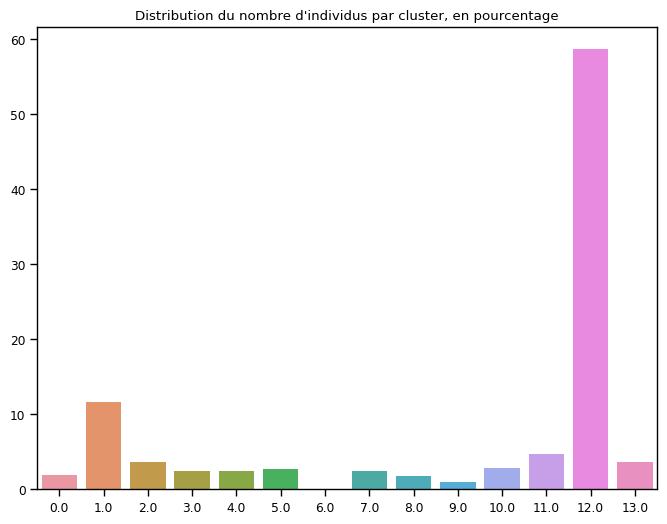

In [ ]:
# plt.figure(figsize=(8,6))
# plt.title('Distribution du nombre d\'individus par cluster, en pourcentage')
# sns.barplot(x = graph['label'].value_counts().index, 
#            y=graph['label'].value_counts().values/len(graph)*100)
# Crée une figure avec la taille spécifiée
plt.figure(figsize=(8, 6))

# Définit le titre du graphique
plt.title('Distribution du nombre d\'individus par cluster, en pourcentage')

# Affiche la distribution du nombre d'individus par cluster en pourcentage à l'aide d'un diagramme à barres
# Les abscisses sont les labels de clusters triés par nombre d'individus
# Les ordonnées sont les pourcentages du nombre d'individus pour chaque cluster
sns.barplot(x=graph['label'].value_counts().index, 
            y=graph['label'].value_counts().values / len(graph) * 100)


Dans ce code, nous utilisons `sns.barplot()` pour afficher la distribution du nombre d'individus par cluster en pourcentage à l'aide d'un diagramme à barres. L'axe des abscisses est constitué des labels de clusters triés par nombre d'individus (c'est-à-dire les clusters les plus fréquents apparaissent en premier). L'axe des ordonnées affiche les pourcentages du nombre d'individus pour chaque cluster, calculés en divisant le nombre d'individus dans chaque cluster par le nombre total d'individus dans le DataFrame `graph`, multiplié par 100 pour obtenir le pourcentage.

Ce graphique permet de visualiser la répartition des individus dans chaque cluster sous forme de pourcentage, ce qui est utile pour comprendre la distribution des données dans les différents groupes identifiés par l'algorithme K-means.

## Caractérisation des clusters 

### Représentation

In [ ]:
graph.sample(10)

,X,Y,label,x_pca,y_pca,z_pca
33660,19.817184,19.322990,2.0,0.995780,0.371670,-0.652650
12739,-16.092775,-26.301970,12.0,-1.750737,0.119475,0.467599
11836,-42.078331,5.309196,12.0,-0.652262,-0.168278,0.097332
29263,11.730019,11.861745,12.0,-0.454529,-0.721127,0.383632
55412,14.041509,-3.445893,12.0,0.237497,-0.107564,-0.068729
62445,7.285047,18.482046,1.0,2.195488,-1.129712,-0.096968
29533,-34.067375,-27.984364,10.0,-0.124422,-0.803355,-0.291631
63782,-18.913378,-2.149711,12.0,-1.161084,-0.799833,0.904660
10316,12.940463,23.924576,12.0,-1.139879,0.151159,-0.356786
31007,16.388910,25.435520,12.0,-1.553679,0.726768,-0.527873


In [ ]:
X2=X_tot.copy()

In [ ]:
X2.shape

(74705, 27)

In [ ]:
X2['label'] = graph['label']
group_columns = X2.groupby('label').mean()

### Répartition par feature 

In [ ]:
X_tot_2 = data.copy()
X_tot_2['label'] = model.labels_

In [ ]:
X_tot_2.head(2)

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,order_purchase_timestamp,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Moy_Paiment,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')",label
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1.0,4.866765,7.0,2018-05-10 10:56:27,10.0,3.0,115.0,5.0,credit_card,8.0,-23.340262,-46.831085,129.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12
0000b849f77a49e4a4ce2b2a4ca5be3f,1.0,2.939162,4.0,2018-05-07 11:11:27,11.0,0.0,118.0,4.0,credit_card,1.0,-23.559044,-46.788516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.9,0.0,0.0,0.0,0.0,0.0,12


In [ ]:
# for column in group_columns.columns:
#     try:
#         plt.figure(figsize=(7,5))
#         titre = 'Moyenne de ' + str(column) + ' pour chaque cluster' 
#         plt.title(titre)
#         sns.barplot(x = 'label',
#                     y = column,
#                     data = X_tot_2, 
#                     ci="sd")
#         plt.show()
#     except:
#         print('Erreur colonne : ', column)

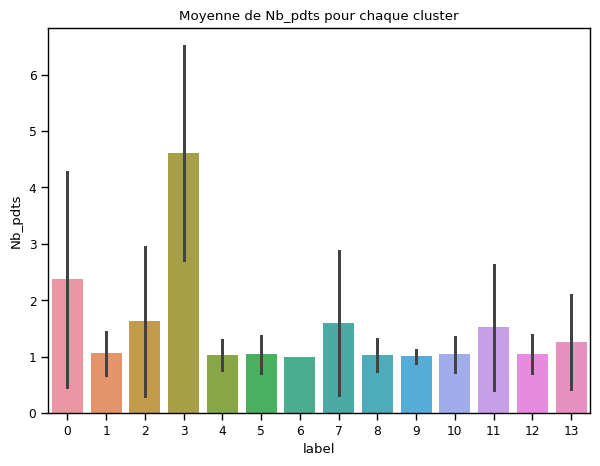

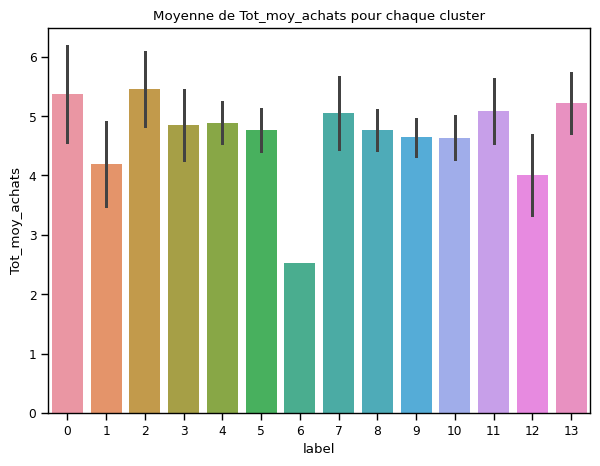

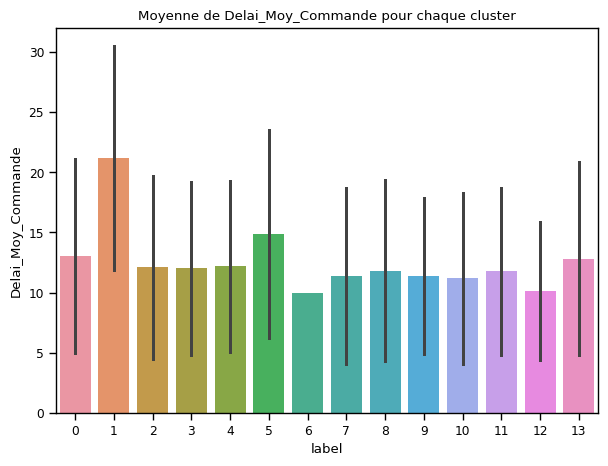

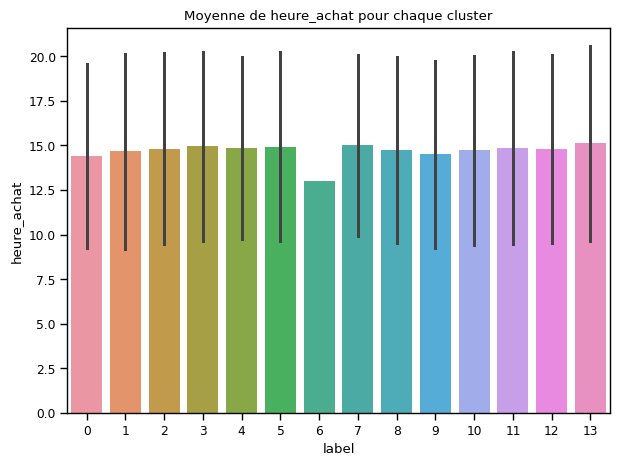

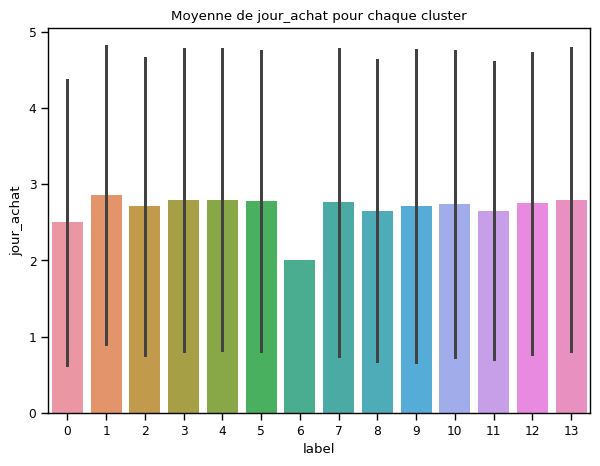

...

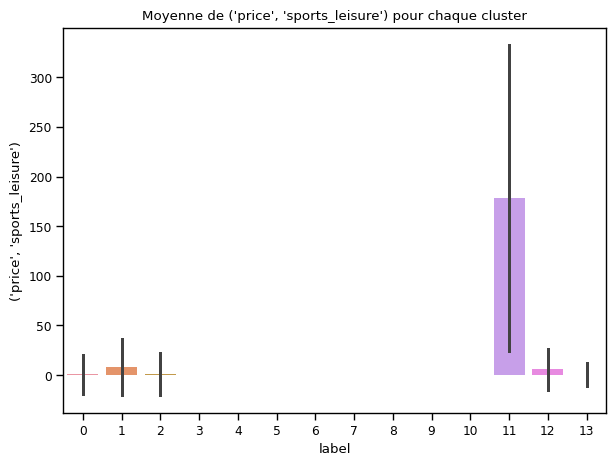

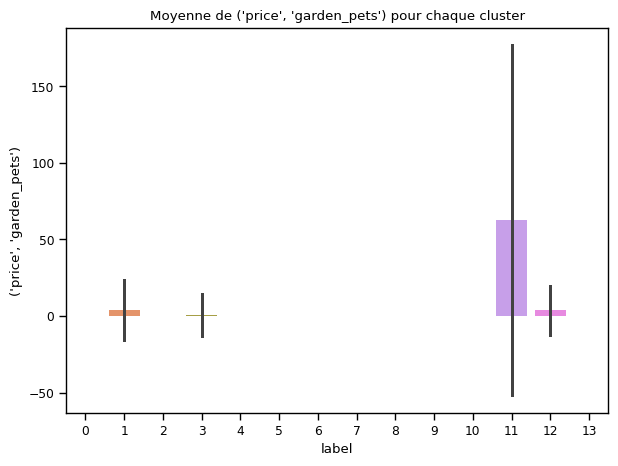

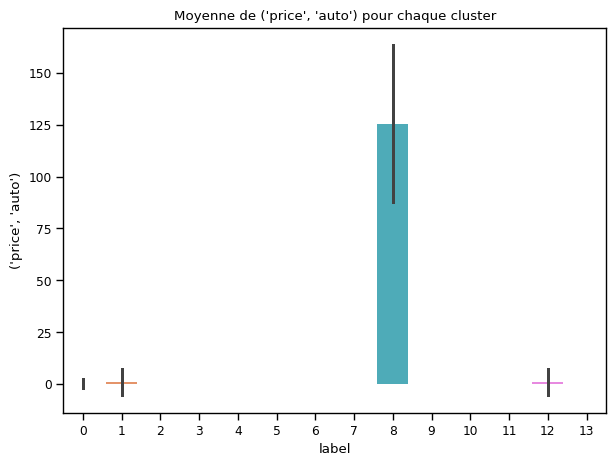

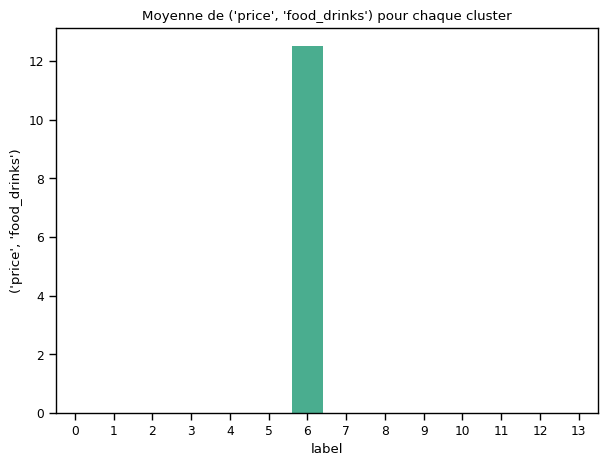

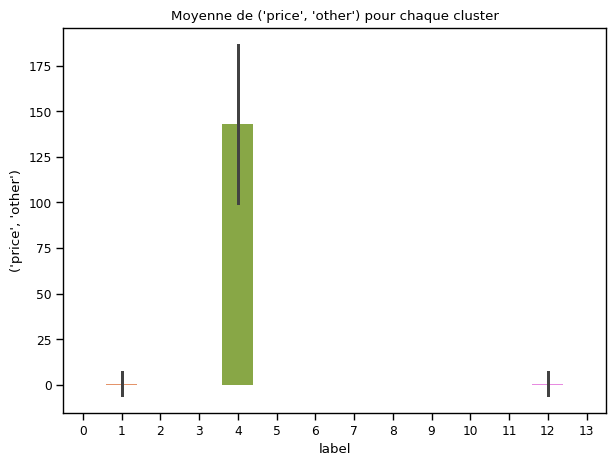

Erreur colonne :  x0_boleto
Erreur colonne :  x0_credit_card
Erreur colonne :  x0_debit_card
Erreur colonne :  x0_voucher


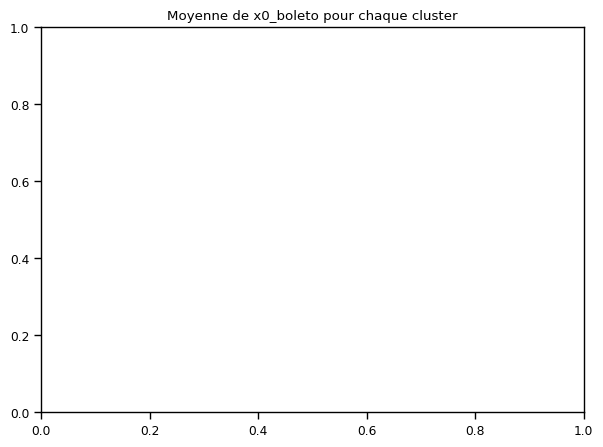

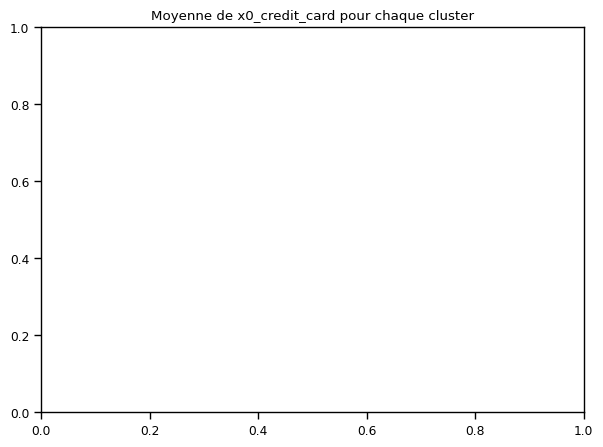

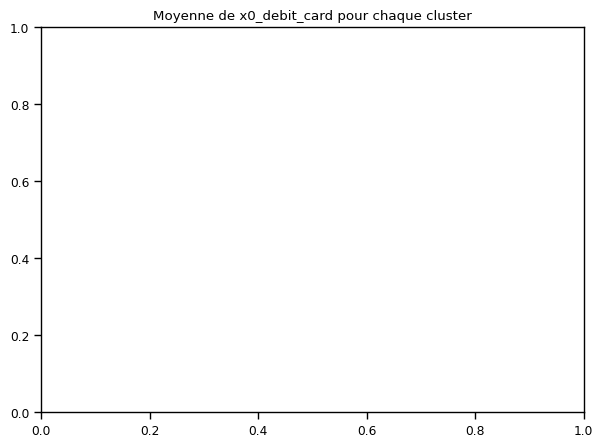

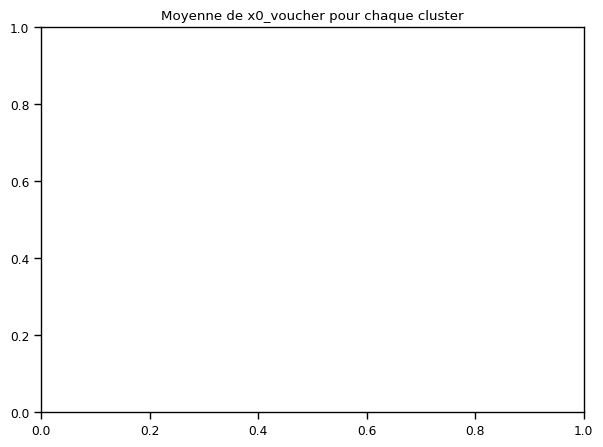

In [ ]:
# Pour chaque colonne dans group_columns.columns
for column in group_columns.columns:
    try:
        # Crée une figure avec la taille spécifiée
        plt.figure(figsize=(7, 5))
        
        # Définit le titre du graphique en utilisant le nom de la colonne
        titre = 'Moyenne de ' + str(column) + ' pour chaque cluster'
        plt.title(titre)
        
        # Affiche la moyenne de la colonne pour chaque cluster à l'aide d'un diagramme à barres
        sns.barplot(x='label',
                    y=column,
                    data=X_tot_2,
                    ci="sd")  # Utilise l'intervalle de confiance pour représenter la dispersion des données

        # Affiche le graphique
        plt.show()
    except:
        # En cas d'erreur, affiche un message avec le nom de la colonne
        print('Erreur colonne : ', column)


Dans ce code, nous utilisons `sns.barplot()` pour afficher la moyenne de la colonne pour chaque cluster à l'aide d'un diagramme à barres. L'axe des abscisses (`x='label'`) correspond aux labels de clusters, et l'axe des ordonnées (`y=column`) correspond aux valeurs moyennes de la colonne. Nous utilisons `data=X_tot_2` pour spécifier les données à utiliser pour le graphique.

Le paramètre `ci="sd"` spécifie que l'intervalle de confiance (confidence interval) doit être utilisé pour représenter la dispersion des données autour de la moyenne.

Enfin, nous utilisons `plt.show()` pour afficher le graphique à chaque itération de la boucle `for`. Si une erreur se produit lors de l'affichage du graphique pour une colonne particulière, nous affichons un message d'erreur contenant le nom de la colonne.

Observation du mode des différents clusters pour chaque feature

In [ ]:
X_tot_2.groupby('label').agg(lambda x:x.value_counts().index[0])

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,order_purchase_timestamp,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Moy_Paiment,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
label,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.0,5.594711,9.0,2018-02-28 11:29:07,10.0,2.0,282.0,5.0,credit_card,1.0,-22.931611,-47.111850,0.0,0.0,0.0,0.0,269.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00
1,1.0,4.092677,16.0,2018-08-03 17:13:19,11.0,4.0,282.0,5.0,credit_card,1.0,-20.344896,-40.288069,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00
2,1.0,5.857647,8.0,2017-10-08 23:56:02,16.0,0.0,282.0,5.0,credit_card,1.0,-23.013945,-43.463020,0.0,0.0,0.0,0.0,0.0,0.00,0.0,349.9,0.0,0.0,0.0,0.0,0.00
3,4.0,4.940213,8.0,2017-08-17 19:10:33,13.0,1.0,282.0,5.0,credit_card,1.0,-22.861518,-46.802172,559.2,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00
4,1.0,4.605070,9.0,2018-01-29 12:54:38,12.0,1.0,270.0,5.0,credit_card,1.0,-16.722630,-43.862910,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,99.99
5,1.0,4.369448,8.0,2017-03-10 21:05:03,16.0,1.0,235.0,5.0,credit_card,1.0,-23.331436,-46.597022,0.0,0.0,0.0,79.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00
6,1.0,2.525729,10.0,2017-08-09 13:23:18,13.0,2.0,389.0,5.0,credit_card,2.0,-22.524734,-44.118652,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,12.5,0.00
7,1.0,4.859812,8.0,2018-07-11 19:49:54,10.0,1.0,282.0,5.0,credit_card,1.0,-22.903660,-43.107256,0.0,129.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00
8,1.0,4.764735,8.0,2018-06-27 11:34:34,15.0,1.0,26.0,5.0,credit_card,1.0,-19.469049,-42.564138,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,117.3,0.0,0.00


In [ ]:
X_tot_2.groupby('label').agg('mean')

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
label,,,,,,,,,,,,,,,,,,,,,,,
0,2.372175,5.371240,13.044492,14.394774,2.500000,252.478814,3.807674,3.295433,-21.527936,-46.000279,3.330452,0.000000,0.009605,0.000000,469.623870,0.000000,0.000000,1.945537,0.840678,0.000000,0.056441,0.0,0.000000
1,1.059506,4.193210,21.155083,14.662378,2.858357,253.815049,3.389604,2.888053,-14.230338,-41.241966,26.762592,3.509177,0.208424,0.554033,18.806451,1.274086,5.746287,17.634790,8.158642,4.152005,0.835478,0.0,0.686200
2,1.623415,5.462849,12.085384,14.824385,2.711037,236.561894,4.187640,4.643550,-21.133914,-46.070248,1.596898,0.000000,0.000000,0.000000,0.527994,0.000000,0.232662,367.181812,0.801372,0.000000,0.000000,0.0,0.000000
3,4.607277,4.851806,12.019083,14.941680,2.786517,236.619048,3.692795,3.645042,-22.158437,-46.259812,757.489791,0.614489,0.000000,0.000000,2.139347,0.000000,0.113858,9.440776,0.000000,0.444302,0.000000,0.0,0.000000
4,1.029924,4.892617,12.177911,14.875952,2.794342,295.860718,4.217356,3.316649,-21.220040,-46.133376,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,142.857873
5,1.040560,4.771455,14.831482,14.936263,2.779817,244.915500,4.122163,2.886287,-21.828446,-46.185750,0.000000,0.000000,0.000000,127.940111,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,1.000000,2.525729,10.000000,13.000000,2.000000,389.000000,5.000000,2.000000,-22.524734,-44.118652,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.5,0.000000
7,1.594944,5.051520,11.395105,15.023669,2.761700,214.293168,4.138515,3.901560,-22.247679,-46.464711,3.938763,241.838198,0.000000,0.000000,1.251899,0.000000,0.000000,0.234406,0.000000,0.000000,0.000000,0.0,0.000000
8,1.030303,4.765973,11.818939,14.757576,2.647727,220.446970,4.202273,2.731061,-21.058298,-46.177928,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,125.506606,0.0,0.000000


In [ ]:
X_tot_2.groupby('label').agg('mean')['delai_dernier_achat'].tolist()

[252.47881355932202,
 253.8150488225158,
 236.561894108874,
 236.61904761904762,
 295.860718171926,
 244.91549975857075,
 389.0,
 214.29316837009145,
 220.4469696969697,
 151.9719495091164,
 266.05570902394106,
 246.58631371444665,
 237.77642917552402,
 218.41573033707866]

Observations : 

* Le cluster 9 correspond aux clients qui ont acheté le plus de produits et aux acheteurs majoritaires de la catégorie 'home'
* le cluster 3 correspond au client qui ont un long délai de traitement de leur commande et également à ceux qui mettent les plus mauvaises notes en moyenne. Ils ne sont pas attachés à une catégorie de produit en particulier
* le cluster 6 correspond au client qui ont fait leur commande le plus récemment et aux acheteurs majoritaires de la catégorie 'construction'
* Le cluster 11 correspond aux acheteurs majoritaires de la catégorie 'appliances' 
* Le cluster 4 correspond aux acheteurs majoritaires de la catégorie  'office'
* Le cluster 13 correspond aux acheteurs majoritaires de la catégorie 'electronics'
* Le cluster 2 correspond aux acheteurs majoritaires de la catégorie 'arts
* Le cluster 0 correspond aux acheteurs majoritaires de la catégorie 'fashion' 
* Le cluster 8 correspond aux acheteurs majoritaires de la catégorie 'health/beauty' 
* Le cluster 1 correspond aux acheteurs majoritaires de la catégorie 'sports_leisure'
* Le cluster 12 correspond aux acheteurs majoritaires de la catégorie 'garden_pets'
* Le cluster 10 correspond aux acheteurs majoritaires de la catégorie 'auto'
* Le cluster 7 correspond aux acheteurs majoritaires de la catégorie 'other'
* pas de catégorie spécifique d'achat identifiée pour le cluster 5 (cluster qui comprend la moitié de notre échantillon)


Premier bilan:
* des clusters d'acheteurs potentiels pour certaines catégories de produits ont été identifiés
* les clients avec un long délai de traitement de commande, qui menttent de moins bonnes notes en moyenne, ont été identifiés
* le cluster des clients qui achète le plus de produits en quantité a également été identifié

Peut-on aller plus loin?

### latitude et longitude

In [ ]:
graph.columns

Index(['X', 'Y', 'label', 'x_pca', 'y_pca', 'z_pca'], dtype='object')

In [ ]:
graph['label'].nunique()

14

In [ ]:
# graph['colors']=pd.cut(graph['label'], bins=nb_clusters, 
#                        labels=['red', 'blue', 'green', 'purple', 
#                                'orange', 'darkred', 'lightred', 'beige', 
#                                'darkblue', 'darkgreen', 'cadetblue', 'darkpurple',
#                                'pink','black'])
# Crée une nouvelle colonne 'colors' dans le DataFrame graph
# La colonne 'colors' va contenir les couleurs correspondant à chaque label de cluster
# Les couleurs sont déterminées en fonction des valeurs des labels
# Le nombre de couleurs utilisées est égal au nombre de clusters (nb_clusters)
# Les couleurs sont spécifiées dans l'ordre donné par la liste labels
graph['colors'] = pd.cut(graph['label'], 
                         bins=nb_clusters,  # Définit les intervalles (bins) pour chaque cluster
                         labels=['red', 'blue', 'green', 'purple',  # Liste des couleurs pour chaque cluster
                                 'orange', 'darkred', 'lightred', 'beige', 
                                 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple',
                                 'pink', 'black'])

Dans ce code, nous utilisons `pd.cut()` pour créer une nouvelle colonne 'colors' dans le DataFrame `graph`. Cette colonne va contenir les couleurs correspondant à chaque label de cluster. Nous utilisons `bins=nb_clusters` pour spécifier le nombre de clusters et définir les intervalles pour chaque cluster.

Ensuite, nous utilisons `labels=['red', 'blue', 'green', ...]` pour spécifier les couleurs que nous souhaitons attribuer à chaque cluster. Dans cet exemple, nous avons défini une liste de 14 couleurs correspondant aux 14 clusters (nb_clusters=14).

La fonction `pd.cut()` attribue automatiquement une couleur à chaque label en fonction des intervalles spécifiés et de la liste de couleurs. Ainsi, chaque cluster dans le DataFrame `graph` est associé à une couleur définie dans la nouvelle colonne 'colors'.

In [ ]:
len(graph)

74705

In [ ]:
if False:
    # Crée une carte Folium vide
    n = folium.Map()

    # Définit les coordonnées du centre de la carte comme la moyenne des coordonnées de géolocalisation
    # Les coordonnées du centre sont calculées en prenant la moyenne des coordonnées de latitude et de longitude
    center_lat = data['geolocation_lat'].mean()
    center_lng = data['geolocation_lng'].mean()

    # Crée une carte Folium centrée sur les coordonnées du centre, avec un zoom de départ de 11
    n = folium.Map(location=[center_lat, center_lng], zoom_start=11)

    # Ajoute des cercles pour les 20 000 premières données à la carte Folium
    # Chaque cercle est placé aux coordonnées de géolocalisation correspondantes
    # La couleur du cercle est déterminée par la colonne 'colors' du DataFrame graph (correspondant aux labels de cluster)
    # Le rayon du cercle est défini à 500 mètres
    for i in range(0, 20000):    
        folium.Circle([data.iloc[i]['geolocation_lat'], data.iloc[i]['geolocation_lng']],
                      popup=graph.iloc[i]['label'], 
                      color=graph.iloc[i]['colors'],
                      radius=500).add_to(n)


"Dans certains code, nous utilisons une condition toujours fausse (`if False:`) pour s'assurer que le code ci-dessous ne sera pas exécuté."

Nous créons une carte Folium vide `n = folium.Map()` qui sera utilisée pour afficher les cercles des données géolocalisées.

Nous calculons ensuite les coordonnées du centre de la carte (`center_lat` et `center_lng`) en prenant la moyenne des coordonnées de géolocalisation de latitude et de longitude.

Ensuite, nous créons une carte Folium centrée sur les coordonnées du centre, avec un zoom de départ de 11.

En utilisant une boucle `for`, nous ajoutons des cercles à la carte Folium pour les 20 000 premières données géolocalisées. Chaque cercle est placé aux coordonnées de géolocalisation correspondantes (latitude et longitude). La couleur du cercle est déterminée par la colonne 'colors' du DataFrame `graph`, qui contient les couleurs correspondant à chaque label de cluster. Le rayon du cercle est défini à 500 mètres.

Bilan : on n'observe pas de tendance nette sur la localisation des points : regroupement des groupes par quartier ou autre.

# Essai de Kmeans en supprimant des features

Peut-on obtenir un autre clustering (éventuellement avec une répartition plus homogène des tailles de clusters) en supprimant des features

In [ ]:
X_tot.head()

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')",x0_boleto,x0_credit_card,x0_debit_card,x0_voucher
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.252934,0.674413,-0.659922,-0.905895,0.125612,-0.844066,0.656979,2.179455,-0.363934,-0.205560,0.662448,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.252934,-1.754239,-1.053042,-0.717425,-1.396007,-0.823856,-0.126992,-0.701164,-0.408854,-0.193730,-0.255630,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.056408,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0000f46a3911fa3c0805444483337064,-0.252934,-0.122695,1.829840,1.167276,0.632818,2.025695,-0.910963,2.179455,-1.226842,-0.706863,-0.255630,-0.203981,-0.108908,2.879229,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,-0.252934,1.085393,0.257359,0.790336,-0.888801,0.348299,0.656979,1.356421,-0.397879,-0.383069,-0.255630,-0.203981,-0.108908,-0.175051,2.121843,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0004bd2a26a76fe21f786e4fbd80607f,-0.252934,0.888838,-1.315122,0.790336,0.125612,-0.608288,-0.126992,2.179455,-0.399954,-0.166360,-0.255630,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,4.725049,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0


In [ ]:
# features_to_drop = ['Delai_Moy_Commande',
#                     'heure_achat',
#                     'Facilités',
#                     'jour_achat', 
#                     'Note_Moy_Com']
# X_reduce = X_tot.drop(features_to_drop, axis=1)

# Liste des noms de colonnes à supprimer du DataFrame X_tot
# Ces colonnes seront exclues de la nouvelle version du DataFrame X_reduce
features_to_drop = ['Delai_Moy_Commande',
                    'heure_achat',
                    'Facilités',
                    'jour_achat', 
                    'Note_Moy_Com']

# Supprime les colonnes spécifiées (features_to_drop) du DataFrame X_tot pour créer le DataFrame X_reduce
# axis=1 indique que les colonnes doivent être supprimées (axis=0 pour supprimer des lignes)
X_reduce = X_tot.drop(features_to_drop, axis=1)

Dans ce code, nous créons une liste `features_to_drop` qui contient les noms des colonnes que nous souhaitons supprimer du DataFrame `X_tot`. Ces colonnes sont `'Delai_Moy_Commande'`, `'heure_achat'`, `'Facilités'`, `'jour_achat'`, et `'Note_Moy_Com'`.

Ensuite, nous utilisons la méthode `drop()` du DataFrame `X_tot` pour supprimer les colonnes spécifiées dans `features_to_drop`. L'argument `axis=1` indique que nous voulons supprimer des colonnes (par opposition à `axis=0` qui supprimerait des lignes).

Le résultat de cette opération est le nouveau DataFrame `X_reduce` qui ne contient pas les colonnes spécifiées dans `features_to_drop`. Ces colonnes sont exclues du DataFrame pour la suite de l'analyse ou de la modélisation.

In [ ]:
X_reduce.head()

,Nb_pdts,Tot_moy_achats,delai_dernier_achat,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')",x0_boleto,x0_credit_card,x0_debit_card,x0_voucher
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.252934,0.674413,-0.844066,-0.363934,-0.205560,0.662448,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.252934,-1.754239,-0.823856,-0.408854,-0.193730,-0.255630,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.056408,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0000f46a3911fa3c0805444483337064,-0.252934,-0.122695,2.025695,-1.226842,-0.706863,-0.255630,-0.203981,-0.108908,2.879229,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,-0.252934,1.085393,0.348299,-0.397879,-0.383069,-0.255630,-0.203981,-0.108908,-0.175051,2.121843,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0004bd2a26a76fe21f786e4fbd80607f,-0.252934,0.888838,-0.608288,-0.399954,-0.166360,-0.255630,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,4.725049,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0


In [ ]:
# pca_reduce = PCA(random_state=1)
# pca_reduce.fit(X_reduce)
# Instancie un objet PCA (Analyse en Composantes Principales) avec une graine aléatoire fixée à 1
pca_reduce = PCA(random_state=1)

# Applique la méthode fit() de l'objet PCA à X_reduce
# La méthode fit() est utilisée pour estimer les composantes principales à partir des données dans X_reduce
pca_reduce.fit(X_reduce)

PCA(random_state=1)

Dans ce code, nous créons un objet `pca_reduce` de type PCA (Analyse en Composantes Principales). L'argument `random_state=1` permet de fixer la graine aléatoire pour que les résultats soient reproductibles.

Ensuite, nous utilisons la méthode `fit()` de l'objet PCA pour ajuster le modèle aux données du DataFrame `X_reduce`. La méthode `fit()` est utilisée pour estimer les composantes principales à partir des données fournies. Après cette étape, l'objet `pca_reduce` contiendra les informations nécessaires pour effectuer une réduction de dimension basée sur l'analyse en composantes principales (PCA) sur les données de `X_reduce`.

In [ ]:
# np.cumsum(pca_reduce.explained_variance_ratio_)[14]
# Calcule la somme cumulative des ratios de variance expliquée par les 14 premières composantes principales
# La méthode explained_variance_ratio_ de l'objet PCA contient les pourcentages de variance expliquée par chaque composante
# La fonction np.cumsum() calcule la somme cumulative des pourcentages de variance expliquée
# L'index 14 indique que nous prenons les 14 premières composantes (0 à 13 inclus)
somme_cumulative = np.cumsum(pca_reduce.explained_variance_ratio_)[14]
somme_cumulative

0.9193428423523842

Dans ce code, nous utilisons la méthode `explained_variance_ratio_` de l'objet PCA `pca_reduce`. Cette méthode contient les pourcentages de variance expliquée par chaque composante principale calculée lors de l'analyse en composantes principales (PCA).

Ensuite, nous utilisons la fonction `np.cumsum()` de la bibliothèque NumPy pour calculer la somme cumulative des pourcentages de variance expliquée. L'index `[14]` indique que nous prenons les 14 premières composantes, de l'indice 0 à l'indice 13 inclus.

Le résultat `somme_cumulative` sera le pourcentage total de variance expliquée par les 14 premières composantes principales du DataFrame après avoir effectué l'analyse en composantes principales (PCA).

In [ ]:
# X_pca_reduce = pca_reduce.transform(X_reduce)[:,:14]
# Applique la transformation PCA sur les données du DataFrame X_reduce
# La méthode transform() de l'objet PCA est utilisée pour projeter les données dans l'espace des composantes principales
# Nous prenons seulement les 14 premières composantes principales en utilisant l'index [:,:14]
X_pca_reduce = pca_reduce.transform(X_reduce)[:, :14]


Dans ce code, nous utilisons la méthode `transform()` de l'objet PCA `pca_reduce` pour projeter les données du DataFrame `X_reduce` dans l'espace des composantes principales. Cela signifie que nous transformons les données d'origine en utilisant les composantes principales estimées lors de l'analyse en composantes principales (PCA).

L'index `[:, :14]` est utilisé pour sélectionner seulement les 14 premières composantes principales résultantes de la transformation. Les autres composantes principales ne sont pas incluses dans `X_pca_reduce`.

Après avoir exécuté ce code, `X_pca_reduce` contiendra les données réduites en dimension, projetées dans l'espace des 14 premières composantes principales. Cela signifie que `X_pca_reduce` aura moins de dimensions que `X_reduce`, car nous avons réduit le nombre de variables grâce à l'analyse en composantes principales (PCA).

In [ ]:
# kmeans_reduce = KMeans(n_clusters=14, 
#                 verbose=1, 
#                 random_state=0).fit(X_reduce)
# Instancie un objet KMeans avec 14 clusters (groupes) souhaités
# La méthode fit() sera utilisée pour effectuer le clustering KMeans sur les données réduites X_reduce
# verbose=1 affiche les détails du processus de clustering à chaque itération
# random_state=0 fixe la graine aléatoire pour que les résultats soient reproductibles

kmeans_reduce = KMeans(n_clusters=14, verbose=1, random_state=0)

# Effectue le clustering KMeans sur les données réduites X_reduce
kmeans_reduce.fit(X_reduce)

Initialization complete
Iteration 0, inertia 802609.6039435547
Iteration 1, inertia 666518.7359122486
Iteration 2, inertia 619581.8024069418
Iteration 3, inertia 599529.7632738388
Iteration 4, inertia 582945.8917921557
Iteration 5, inertia 569786.6952317129
Iteration 6, inertia 565925.247511627
Iteration 7, inertia 563673.5326613009
Iteration 8, inertia 562757.8129895356
Iteration 9, inertia 562073.9628827448
Iteration 10, inertia 561517.2673014993
Iteration 11, inertia 561275.1795431727
Iteration 12, inertia 561175.4823303142
Iteration 13, inertia 560956.2483241017
Iteration 14, inertia 560644.7435590399
Iteration 15, inertia 560327.2563051849
Iteration 16, inertia 559964.9645920033
Iteration 17, inertia 558683.5318284455
Iteration 18, inertia 555483.511914304
Iteration 19, inertia 555470.7503877177
Iteration 20, inertia 555465.8341763604
Iteration 21, inertia 555464.8851975577
Converged at iteration 21: center shift 4.742168565571806e-05 within tolerance 8.350512223975176e-05.
Initia

Initialization complete
Iteration 0, inertia 780393.3844719747
Iteration 1, inertia 640224.6685485523
Iteration 2, inertia 609959.8049704988
Iteration 3, inertia 599089.920949316
Iteration 4, inertia 594476.7252065738
Iteration 5, inertia 592208.1663576734
Iteration 6, inertia 590603.3741963259
Iteration 7, inertia 588564.4328995364
Iteration 8, inertia 585194.0126661074
Iteration 9, inertia 582141.3502253812
Iteration 10, inertia 578797.7075364562
Iteration 11, inertia 575610.8495207578
Iteration 12, inertia 574427.4364612019
Iteration 13, inertia 573902.7348124989
Iteration 14, inertia 573709.1707443437
Iteration 15, inertia 573680.2029339675
Iteration 16, inertia 573672.2434896671
Iteration 17, inertia 573668.641383301
Converged at iteration 17: center shift 8.335176973189967e-05 within tolerance 8.350512223975176e-05.


KMeans(n_clusters=14, random_state=0, verbose=1)

Dans ce code, nous créons un objet `kmeans_reduce` de type KMeans (clustering K-means) avec 14 clusters (groupes) souhaités. Cet objet sera utilisé pour effectuer le clustering KMeans sur les données réduites `X_reduce`, qui sont le résultat de l'analyse en composantes principales (PCA).

Ensuite, nous utilisons la méthode `fit()` de l'objet KMeans pour effectuer le clustering KMeans sur `X_reduce`. Le clustering KMeans regroupe les données en 14 clusters distincts en fonction de leurs similarités dans l'espace des composantes principales.

Les paramètres `verbose=1` et `random_state=0` sont utilisés pour afficher les détails du processus de clustering et fixer la graine aléatoire pour que les résultats soient reproductibles.

In [ ]:
# silhouette_score(X = X_pca_reduce, labels= kmeans_reduce.labels_)
# Calcule le score de silhouette pour évaluer la qualité du clustering KMeans
# Le score de silhouette mesure à quel point chaque point est similaire aux points de son propre cluster par rapport aux autres clusters
# X_pca_reduce est l'ensemble de données réduit en dimension après l'analyse en composantes principales (PCA)
# kmeans_reduce.labels_ contient les étiquettes de cluster attribuées par KMeans à chaque point dans X_pca_reduce
silhouette_score(X=X_pca_reduce, labels=kmeans_reduce.labels_)

0.37909359442098384

Dans ce code, nous utilisons la fonction `silhouette_score` de la bibliothèque scikit-learn pour calculer le score de silhouette du clustering KMeans. Le score de silhouette mesure à quel point chaque point est similaire aux points de son propre cluster par rapport aux autres clusters. Un score de silhouette élevé indique que les points sont bien regroupés dans leurs clusters respectifs.

Les arguments de la fonction `silhouette_score` sont les suivants :

- `X`: L'ensemble de données réduit en dimension après l'analyse en composantes principales (PCA), c'est-à-dire `X_pca_reduce`.

- `labels`: Les étiquettes de cluster attribuées par KMeans à chaque point dans `X_pca_reduce`, c'est-à-dire `kmeans_reduce.labels_`.

Après avoir exécuté ce code, le résultat sera le score de silhouette qui évalue la qualité du clustering KMeans réalisé sur les données réduites en dimension `X_pca_reduce`. Un score de silhouette proche de 1 est généralement considéré comme bon, indiquant que les clusters sont bien séparés et que les points sont bien regroupés.

<Axes: >

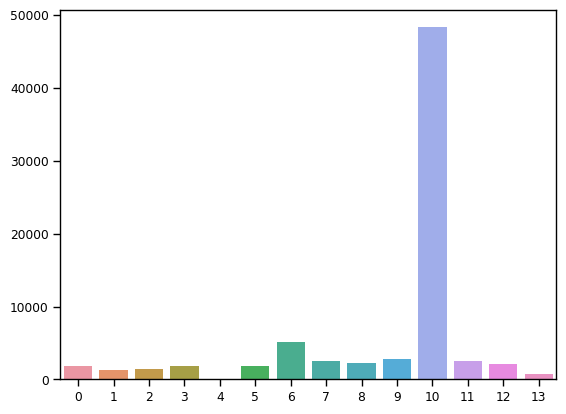

In [ ]:
# sns.barplot(y = pd.Series(kmeans_reduce.labels_).value_counts().values,
#            x = pd.Series(kmeans_reduce.labels_).value_counts().index)

# Calcule le nombre d'occurrences de chaque cluster dans les étiquettes attribuées par KMeans
# La fonction value_counts() de pandas renvoie une série contenant le nombre d'occurrences de chaque élément unique dans la liste des étiquettes
# kmeans_reduce.labels_ contient les étiquettes de cluster attribuées par KMeans à chaque point
occurrences_clusters = pd.Series(kmeans_reduce.labels_).value_counts()

# Affiche un graphique à barres pour visualiser la distribution des occurrences de chaque cluster
# y : les hauteurs des barres, c'est-à-dire le nombre d'occurrences de chaque cluster
# x : les positions des barres, c'est-à-dire les identifiants numériques de chaque cluster (0, 1, 2, ..., nb_clusters-1)
sns.barplot(y=occurrences_clusters.values, x=occurrences_clusters.index)

Dans ce code, nous utilisons la fonction `value_counts()` de pandas pour compter le nombre d'occurrences de chaque cluster dans les étiquettes attribuées par KMeans. La variable `occurrences_clusters` est une série contenant le nombre d'occurrences de chaque cluster, indexée par les identifiants numériques de chaque cluster (0, 1, 2, ..., nb_clusters-1).

Ensuite, nous utilisons `sns.barplot()` de la bibliothèque seaborn pour créer un graphique à barres. L'axe des ordonnées (`y`) représente le nombre d'occurrences de chaque cluster, c'est-à-dire la hauteur des barres. L'axe des abscisses (`x`) représente les identifiants numériques de chaque cluster, c'est-à-dire les positions des barres.

Ce graphique à barres permet de visualiser la distribution du nombre d'occurrences de chaque cluster, ce qui peut être utile pour évaluer l'équilibre ou la répartition des points dans les différents clusters obtenus à partir du clustering KMeans.

taille des clusters

In [ ]:
# pd.DataFrame(kmeans_reduce.labels_, columns=['cluster'])['cluster'].value_counts().sort_values()
# Crée un DataFrame contenant une colonne 'cluster' avec les étiquettes attribuées par KMeans à chaque point
# kmeans_reduce.labels_ contient les étiquettes de cluster attribuées par KMeans à chaque point
# pd.DataFrame() permet de créer un DataFrame à partir de la liste d'étiquettes
df_clusters = pd.DataFrame(kmeans_reduce.labels_, columns=['cluster'])

# Compte le nombre d'occurrences de chaque cluster dans la colonne 'cluster' du DataFrame
# La fonction value_counts() de pandas renvoie une série contenant le nombre d'occurrences de chaque élément unique dans la colonne
occurrences_clusters = df_clusters['cluster'].value_counts()

# Trie les valeurs par ordre croissant (du plus petit au plus grand)
# Cela permet de visualiser les occurrences des clusters dans l'ordre croissant
occurrences_clusters_sorted = occurrences_clusters.sort_values()

Dans ce code, nous commençons par créer un DataFrame `df_clusters` contenant une colonne `'cluster'` avec les étiquettes de cluster attribuées par KMeans à chaque point. La liste des étiquettes est extraite de `kmeans_reduce.labels_` et transformée en un DataFrame à l'aide de `pd.DataFrame()`.

Ensuite, nous utilisons la fonction `value_counts()` de pandas pour compter le nombre d'occurrences de chaque cluster dans la colonne `'cluster'` du DataFrame `df_clusters`. La variable `occurrences_clusters` est une série contenant le nombre d'occurrences de chaque cluster, indexée par les identifiants numériques de chaque cluster (0, 1, 2, ..., nb_clusters-1).

Enfin, nous utilisons la méthode `sort_values()` pour trier les valeurs par ordre croissant, ce qui permet d'obtenir `occurrences_clusters_sorted`, une série contenant les occurrences des clusters dans l'ordre croissant. Cette série peut être utilisée pour visualiser les occurrences des clusters dans un ordre plus lisible et croissant.

In [ ]:
# X_tot_2['label_reduce'] = kmeans_reduce.labels_
# Ajoute une nouvelle colonne 'label_reduce' au DataFrame X_tot_2
# kmeans_reduce.labels_ contient les étiquettes de cluster attribuées par KMeans à chaque point dans X_reduce
# Cette nouvelle colonne contiendra les étiquettes de cluster pour chaque ligne du DataFrame X_tot_2
X_tot_2['label_reduce'] = kmeans_reduce.labels_

Dans ce code, nous ajoutons une nouvelle colonne `'label_reduce'` au DataFrame `X_tot_2`. Cette colonne contiendra les étiquettes de cluster attribuées par KMeans à chaque point dans `X_reduce`.

Les étiquettes de cluster sont stockées dans `kmeans_reduce.labels_`, qui est un attribut de l'objet KMeans `kmeans_reduce`. Ces étiquettes correspondent aux groupes/clusters dans lesquels chaque point a été assigné par le modèle KMeans lors du processus de clustering. Chaque ligne du DataFrame `X_tot_2` se verra attribuer l'étiquette correspondante à son point dans l'espace réduit `X_reduce`.

Après avoir exécuté cette ligne de code, le DataFrame `X_tot_2` contiendra une nouvelle colonne `'label_reduce'` avec les étiquettes de cluster obtenues à partir du clustering KMeans sur les données réduites en dimension `X_reduce`.

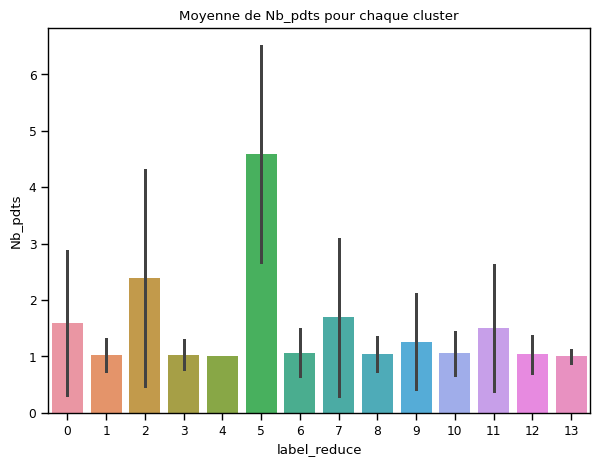

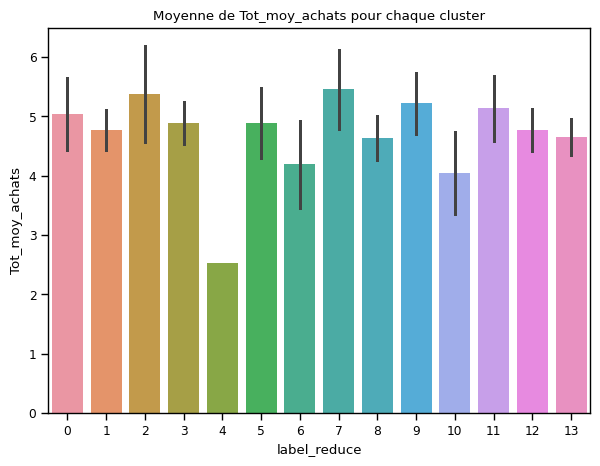

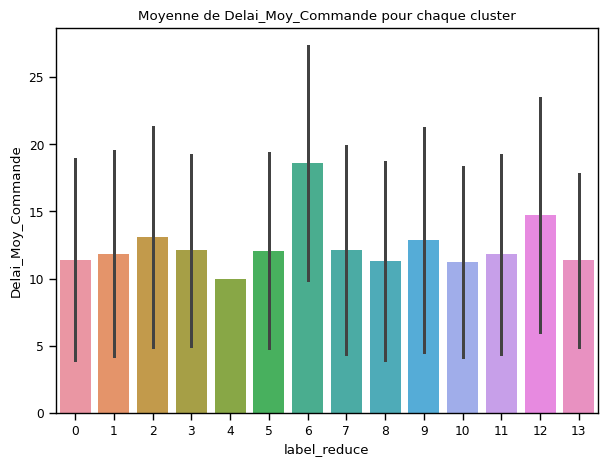

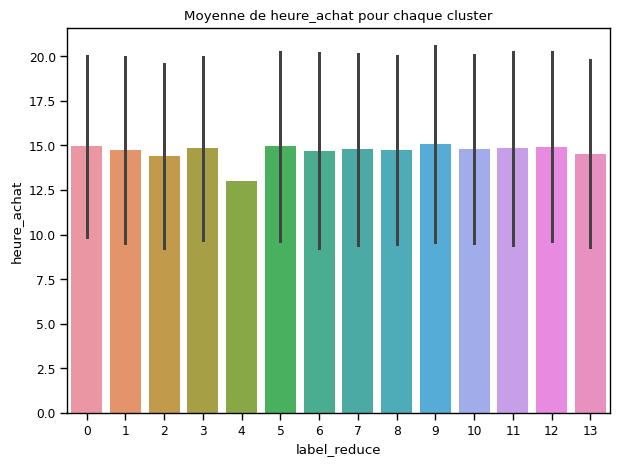

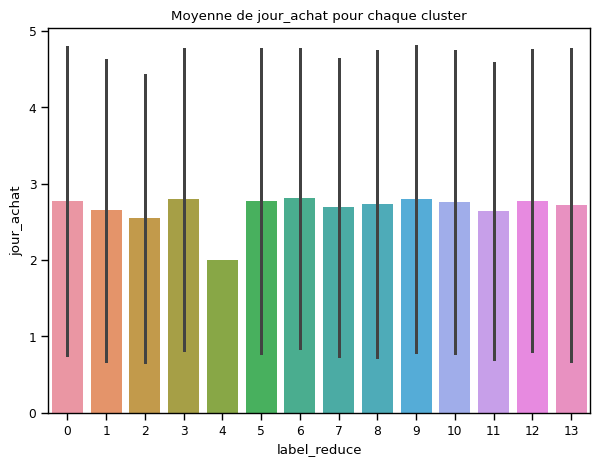

...

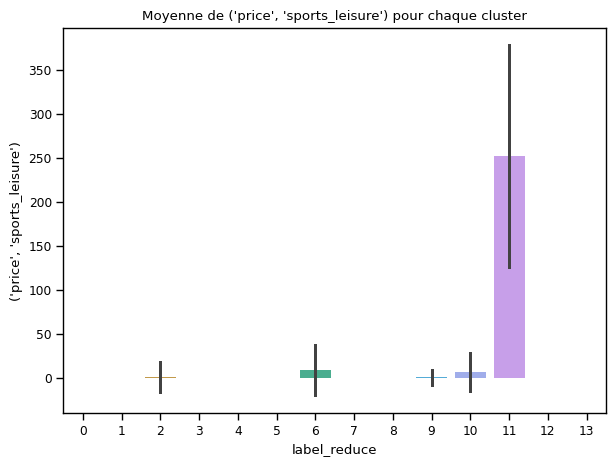

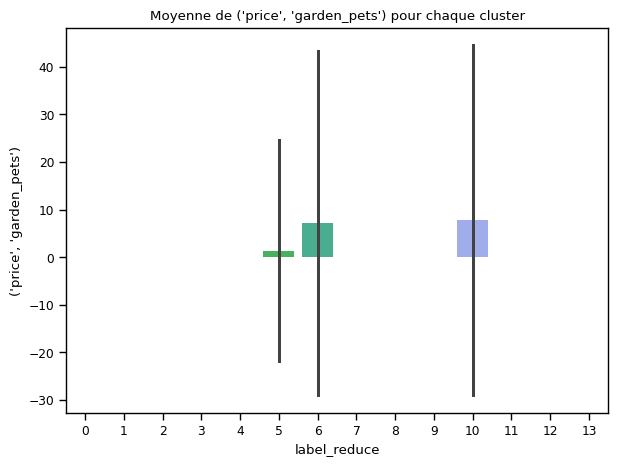

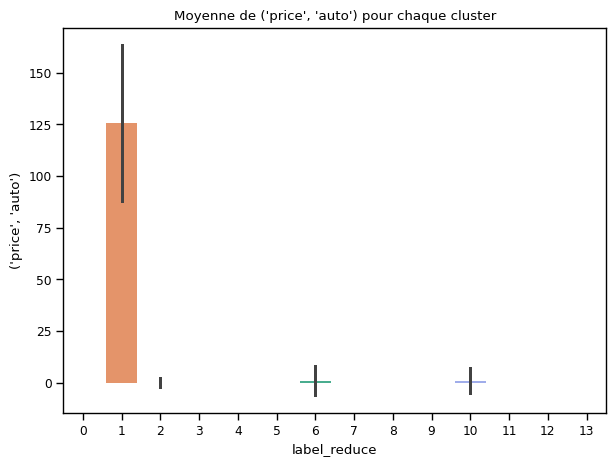

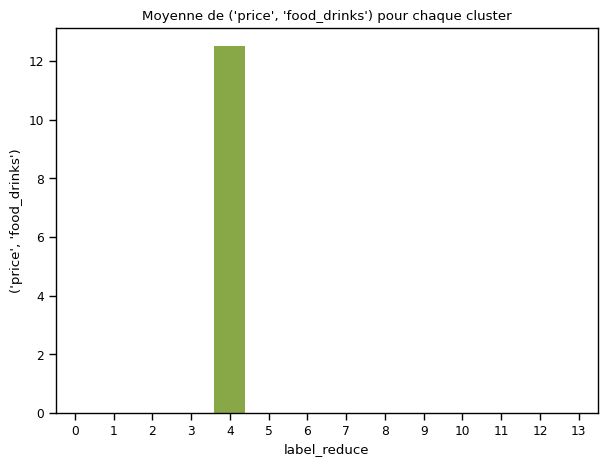

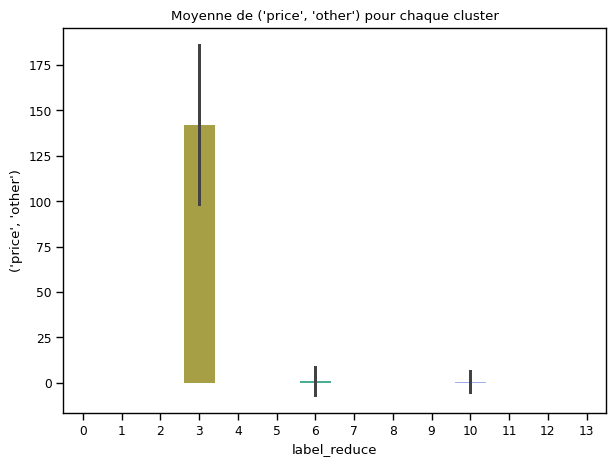

Erreur colonne :  x0_boleto
Erreur colonne :  x0_credit_card
Erreur colonne :  x0_debit_card
Erreur colonne :  x0_voucher


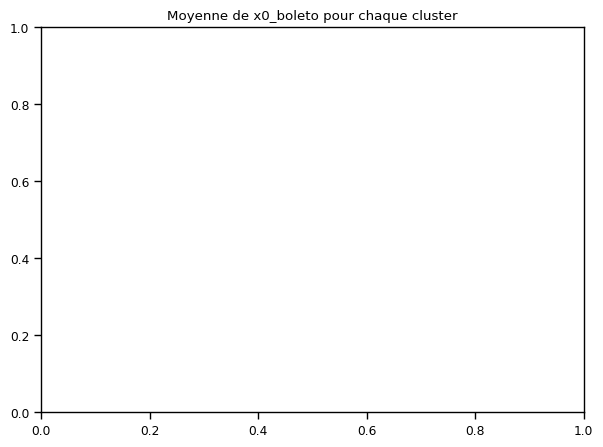

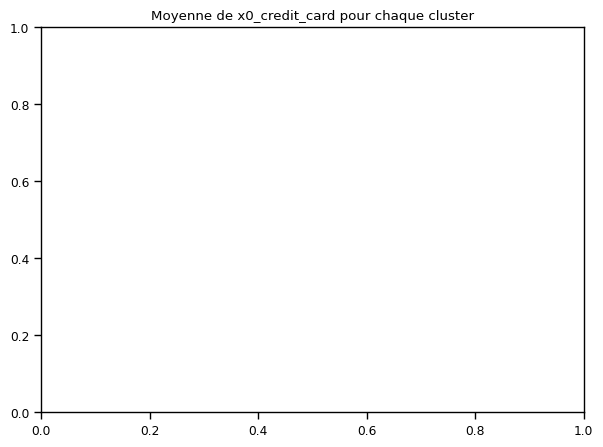

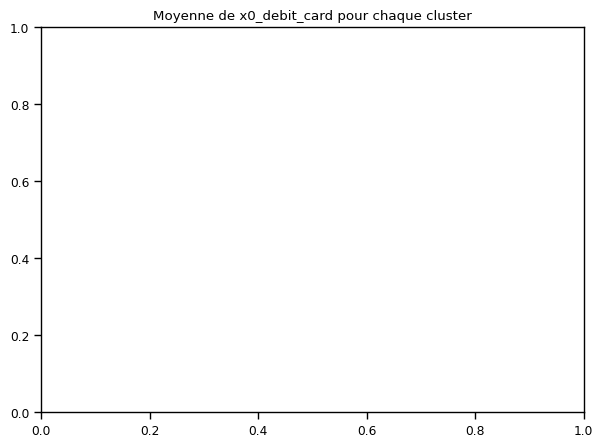

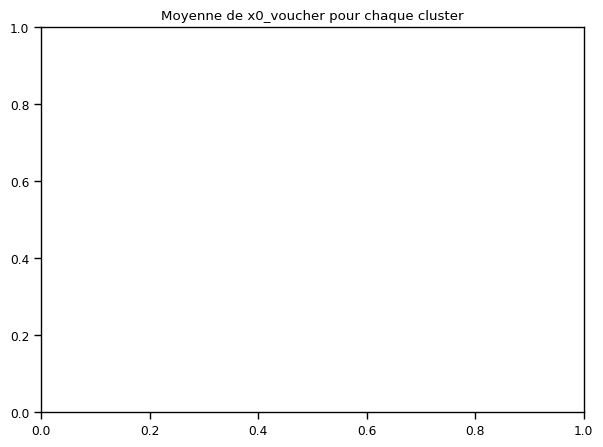

In [ ]:
# for column in group_columns.columns:
#     try:
#         plt.figure(figsize=(7,5))
#         titre = 'Moyenne de ' + str(column) + ' pour chaque cluster' 
#         plt.title(titre)
#         sns.barplot(x = 'label_reduce',
#                     y = column,
#                     data = X_tot_2, 
#                     ci="sd")
#         plt.show()
#     except:
#         print('Erreur colonne : ', column)

# Parcours chaque colonne du DataFrame group_columns
for column in group_columns.columns:
    try:
        # Crée une nouvelle figure pour chaque colonne
        plt.figure(figsize=(7, 5))
        
        # Génère le titre du graphique en indiquant la moyenne de la colonne pour chaque cluster
        titre = 'Moyenne de ' + str(column) + ' pour chaque cluster'
        plt.title(titre)
        
        # Crée un graphique à barres pour visualiser la moyenne de la colonne pour chaque cluster
        # x : étiquettes de cluster, c'est-à-dire les valeurs de la colonne 'label_reduce' de X_tot_2
        # y : valeurs de la colonne spécifiée par 'column'
        # data : DataFrame X_tot_2 contenant les données et les étiquettes de cluster 'label_reduce'
        # ci="sd" indique que l'intervalle de confiance est affiché sur le graphique (écart-type)
        sns.barplot(x='label_reduce', y=column, data=X_tot_2, ci="sd")
        
        # Affiche le graphique
        plt.show()
    except:
        # Si une erreur se produit lors de la création du graphique, affiche un message d'erreur avec le nom de la colonne
        print('Erreur colonne : ', column)


Le Kmeans réduit semble réaliser un clustering comparable : on observe les mêmes features qui se détachent en fonction des catégories (catégories de dépenses, nombre d'achats, etc.)

# Résultats et problématique

Les résultats ne sont pas parfaitement satisfaisants vis à vis de la problématique:  
* on obtient un trop grand nombre de clusters, non adapté à la problématique business
* un cluster principal qui contient trop de données
* coefficient de silhouette relativement faible indiquant un chevauchement partiel des clusters,
* le clustering suit principalement les catégories de produits prédéfinies. On aurait pu faire ce tri sans faire appel à des algorithmes 

La base de données permet de faire difficilement mieux par des algorithmes traditionnels car peu de clients ont fait plusieurs achats, ce qui limite le nombre de possibilités qu'on peut envisager (fréquence des achats, complémentarité des catégories d'achats, date du dernier achat, etc.)

Revenons à une analyse manuelle des données pour identifier des segments exploitables pour les équipes marketing

## Clusters actionnables

**Identification des clusters**

In [ ]:
cluster = []
for i in range(14):
    cluster.append(data.loc[X_tot_2['label'] == i])

Nombre de clients par cluster

In [ ]:
a = 0
for i in range(14):
    b = cluster[i].shape[0]
    a += b
    print('cluster {} : {} clients'.format(i,b))

cluster 0 : 1416 clients
cluster 1 : 8705 clients
cluster 2 : 2682 clients
cluster 3 : 1869 clients
cluster 4 : 1838 clients
cluster 5 : 2071 clients
cluster 6 : 1 clients
cluster 7 : 1859 clients
cluster 8 : 1320 clients
cluster 9 : 713 clients
cluster 10 : 2172 clients
cluster 11 : 3551 clients
cluster 12 : 43749 clients
cluster 13 : 2759 clients


la catégorie 5 contient trop de clients et est difficilement exploitable directement. Peut-on la redécouper?

### Clustering de la catégorie 5

In [ ]:
# dict_silhouette_cat5 = {}
# dict_kmeans_cat5 = {}
# for i in range(2,15,1):
#     dict_kmeans_cat5[i] = KMeans(n_clusters=i, 
#                     verbose=1, 
#                     random_state=0).fit(X3.loc[X_tot_2[X_tot_2['label'] == 5].index])
#     dict_silhouette_cat5[i] = (silhouette_score(X = X3.loc[X_tot_2[X_tot_2['label'] == 5].index],
#                          labels= list(dict_kmeans_cat5[i].labels_)))
# Dictionnaire pour stocker les scores de silhouette pour différents nombres de clusters
dict_silhouette_cat5 = {}

# Dictionnaire pour stocker les modèles K-means pour différents nombres de clusters
dict_kmeans_cat5 = {}

# Parcours des nombres de clusters de 2 à 14
for i in range(2, 15, 1):
    # Crée un modèle K-means avec le nombre de clusters actuel
    # en utilisant les données du DataFrame X3, filtrées pour les échantillons avec le label 5 du DataFrame X_tot_2
    # verbose=1 affiche des informations sur le processus de clustering
    # random_state=0 fixe la graine aléatoire pour assurer la reproductibilité
    dict_kmeans_cat5[i] = KMeans(n_clusters=i,
                                 verbose=1,
                                 random_state=0).fit(X3.loc[X_tot_2[X_tot_2['label'] == 5].index])
    
    # Calcule le score de silhouette pour le modèle K-means actuel
    # en utilisant les données du DataFrame X3, filtrées pour les échantillons avec le label 5 du DataFrame X_tot_2
    # silhouette_score calcule la cohérence des clusters, un score plus élevé indique une meilleure séparation des clusters
    dict_silhouette_cat5[i] = (silhouette_score(X=X3.loc[X_tot_2[X_tot_2['label'] == 5].index],
                                                labels=list(dict_kmeans_cat5[i].labels_)))


Initialization complete
Iteration 0, inertia 26266.187892861508
Iteration 1, inertia 16546.9632926516
Iteration 2, inertia 16391.328613764133
Iteration 3, inertia 16376.339242192513
Iteration 4, inertia 16373.68315637622
Iteration 5, inertia 16372.950075502806
Iteration 6, inertia 16372.73815230104
Iteration 7, inertia 16372.68449786566
Converged at iteration 7: strict convergence.
Initialization complete
Iteration 0, inertia 25084.794240236384
Iteration 1, inertia 16473.77204077933
Iteration 2, inertia 16387.68626466307
Iteration 3, inertia 16377.274905201708
Iteration 4, inertia 16374.968513828917
Iteration 5, inertia 16374.127974377252
Iteration 6, inertia 16373.762358527883
Iteration 7, inertia 16373.342100928307
Iteration 8, inertia 16373.228908817458
Converged at iteration 8: center shift 2.6701636768501938e-05 within tolerance 5.6004825737306386e-05.
Initialization complete
Iteration 0, inertia 26502.254178956286
Iteration 1, inertia 18947.700531529714
Iteration 2, inertia 17065

Initialization complete
Iteration 0, inertia 20846.46426182918
Iteration 1, inertia 14194.198216000717
Iteration 2, inertia 13949.957778643988
Iteration 3, inertia 13911.82744484539
Iteration 4, inertia 13888.122387397312
Iteration 5, inertia 13861.489195260312
Iteration 6, inertia 13827.877981613208
Iteration 7, inertia 13794.590617136786
Iteration 8, inertia 13771.718466920503
Iteration 9, inertia 13758.23226036571
Iteration 10, inertia 13741.754228138028
Iteration 11, inertia 13728.279580642615
Iteration 12, inertia 13717.035965032363
Iteration 13, inertia 13705.388796228865
Iteration 14, inertia 13698.317563142477
Iteration 15, inertia 13695.188147638286
Iteration 16, inertia 13694.032639714134
Iteration 17, inertia 13692.500071111077
Iteration 18, inertia 13691.679347026611
Iteration 19, inertia 13690.988655216355
Iteration 20, inertia 13690.174479661579
Iteration 21, inertia 13689.504013050617
Iteration 22, inertia 13688.408953517293
Iteration 23, inertia 13687.68964065862
Iterat

Initialization complete
Iteration 0, inertia 18031.127830917816
Iteration 1, inertia 13684.34314375556
Iteration 2, inertia 13346.832349393222
Iteration 3, inertia 13246.939481871132
Iteration 4, inertia 13201.655737402376
Iteration 5, inertia 13155.231054312186
Iteration 6, inertia 13126.933492322063
Iteration 7, inertia 13116.584841575359
Iteration 8, inertia 13102.743161370063
Iteration 9, inertia 13089.793128714593
Iteration 10, inertia 13081.178783120626
Iteration 11, inertia 13071.845931003025
Iteration 12, inertia 13062.864055099939
Iteration 13, inertia 13052.820706670103
Iteration 14, inertia 13046.334640584193
Iteration 15, inertia 13039.382564455698
Iteration 16, inertia 13035.548975148578
Iteration 17, inertia 13032.235353475822
Iteration 18, inertia 13029.403421983703
Iteration 19, inertia 13027.293586263424
Iteration 20, inertia 13024.311600155152
Iteration 21, inertia 13022.361531809118
Iteration 22, inertia 13021.186171280222
Iteration 23, inertia 13020.802411187913
Ite

Iteration 7, inertia 13271.769127327643
Iteration 8, inertia 13228.537042862536
Iteration 9, inertia 13198.207730426846
Iteration 10, inertia 13175.67709274685
Iteration 11, inertia 13151.428503839365
Iteration 12, inertia 13112.403624187795
Iteration 13, inertia 13044.35947314865
Iteration 14, inertia 12987.91550169604
Iteration 15, inertia 12956.138255853803
Iteration 16, inertia 12927.163965560723
Iteration 17, inertia 12899.164980426052
Iteration 18, inertia 12859.19276336096
Iteration 19, inertia 12834.043322360812
Iteration 20, inertia 12819.283231059402
Iteration 21, inertia 12811.507329217951
Iteration 22, inertia 12806.44823930359
Iteration 23, inertia 12803.389122187222
Iteration 24, inertia 12801.309219149032
Iteration 25, inertia 12800.55147174242
Iteration 26, inertia 12800.317533080264
Iteration 27, inertia 12800.001559029199
Iteration 28, inertia 12799.679349236216
Iteration 29, inertia 12799.14359162397
Iteration 30, inertia 12799.050907362707
Iteration 31, inertia 1279

Iteration 41, inertia 12227.755472600657
Iteration 42, inertia 12227.333199441202
Iteration 43, inertia 12226.763239852768
Iteration 44, inertia 12225.934618001498
Iteration 45, inertia 12225.222781385324
Iteration 46, inertia 12224.98872630466
Iteration 47, inertia 12224.916673412263
Iteration 48, inertia 12224.83540248326
Iteration 49, inertia 12224.794921683875
Iteration 50, inertia 12224.603352608814
Iteration 51, inertia 12224.528256901925
Converged at iteration 51: strict convergence.
Initialization complete
Iteration 0, inertia 16478.84096664059
Iteration 1, inertia 13805.96028726256
Iteration 2, inertia 13259.703629637554
Iteration 3, inertia 13033.254073666496
Iteration 4, inertia 12932.414592713949
Iteration 5, inertia 12860.645892617751
Iteration 6, inertia 12826.21174012177
Iteration 7, inertia 12792.149412732497
Iteration 8, inertia 12762.627842171838
Iteration 9, inertia 12735.713070106958
Iteration 10, inertia 12704.402744177765
Iteration 11, inertia 12675.336491716025
I

Iteration 12, inertia 11722.297980468367
Iteration 13, inertia 11687.58177753848
Iteration 14, inertia 11657.693935832966
Iteration 15, inertia 11616.085226507901
Iteration 16, inertia 11581.980865652495
Iteration 17, inertia 11552.128186866554
Iteration 18, inertia 11526.121836603088
Iteration 19, inertia 11500.981269279893
Iteration 20, inertia 11488.105681522777
Iteration 21, inertia 11477.249540406405
Iteration 22, inertia 11469.601653359541
Iteration 23, inertia 11466.991083391704
Iteration 24, inertia 11466.3420150358
Iteration 25, inertia 11465.541888380449
Iteration 26, inertia 11464.745241698129
Iteration 27, inertia 11463.8407001204
Iteration 28, inertia 11462.503016095116
Iteration 29, inertia 11461.988032155741
Iteration 30, inertia 11461.59689193129
Iteration 31, inertia 11461.210220635323
Iteration 32, inertia 11461.173346230575
Converged at iteration 32: strict convergence.
Initialization complete
Iteration 0, inertia 16445.073094381514
Iteration 1, inertia 12285.3168356

Iteration 1, inertia 12322.661304228273
Iteration 2, inertia 11778.953536590967
Iteration 3, inertia 11528.152644510723
Iteration 4, inertia 11408.064062547093
Iteration 5, inertia 11320.439941048666
Iteration 6, inertia 11242.873703508874
Iteration 7, inertia 11182.76629439201
Iteration 8, inertia 11128.749547960244
Iteration 9, inertia 11089.980222253464
Iteration 10, inertia 11064.85993094684
Iteration 11, inertia 11047.928375884143
Iteration 12, inertia 11040.277021357278
Iteration 13, inertia 11037.438147761713
Iteration 14, inertia 11036.015555288173
Iteration 15, inertia 11034.71857035533
Iteration 16, inertia 11033.167942262155
Iteration 17, inertia 11032.046786857998
Iteration 18, inertia 11031.886906805785
Iteration 19, inertia 11031.747990643968
Iteration 20, inertia 11031.387299775855
Iteration 21, inertia 11030.91779932523
Iteration 22, inertia 11030.190892984621
Iteration 23, inertia 11029.980799534971
Converged at iteration 23: strict convergence.
Initialization complete

Initialization complete
Iteration 0, inertia 13835.049496782916
Iteration 1, inertia 11713.406203038361
Iteration 2, inertia 11481.237974675556
Iteration 3, inertia 11373.31916127587
Iteration 4, inertia 11269.59427196019
Iteration 5, inertia 11164.625470206642
Iteration 6, inertia 11056.707996566514
Iteration 7, inertia 10971.08875832532
Iteration 8, inertia 10893.77255575495
Iteration 9, inertia 10823.791563656934
Iteration 10, inertia 10765.799629701942
Iteration 11, inertia 10740.756481958097
Iteration 12, inertia 10726.498719085337
Iteration 13, inertia 10716.35132098687
Iteration 14, inertia 10708.56485672907
Iteration 15, inertia 10697.251554561715
Iteration 16, inertia 10689.208548569191
Iteration 17, inertia 10684.59872421654
Iteration 18, inertia 10681.967672213223
Iteration 19, inertia 10678.952375487346
Iteration 20, inertia 10676.178462733451
Iteration 21, inertia 10673.843590054714
Iteration 22, inertia 10671.140504819594
Iteration 23, inertia 10669.015266155393
Iteration

Iteration 23, inertia 10403.511608803914
Iteration 24, inertia 10396.70056490731
Iteration 25, inertia 10390.453255671377
Iteration 26, inertia 10384.151576125701
Iteration 27, inertia 10380.899411461041
Iteration 28, inertia 10379.986759527212
Iteration 29, inertia 10379.56492001729
Iteration 30, inertia 10378.780392986506
Iteration 31, inertia 10377.726788072088
Iteration 32, inertia 10376.196868797135
Iteration 33, inertia 10374.584993265229
Iteration 34, inertia 10373.570237904563
Iteration 35, inertia 10372.134208644276
Iteration 36, inertia 10370.871558867468
Iteration 37, inertia 10370.427928347806
Iteration 38, inertia 10370.08743269663
Iteration 39, inertia 10369.895617720656
Iteration 40, inertia 10369.760480902254
Iteration 41, inertia 10369.69747520195
Iteration 42, inertia 10369.662450912881
Converged at iteration 42: strict convergence.
Initialization complete
Iteration 0, inertia 13626.779472520639
Iteration 1, inertia 11327.913000234146
Iteration 2, inertia 10941.308302

Iteration 17, inertia 10060.727221102326
Iteration 18, inertia 10058.970666558858
Iteration 19, inertia 10056.718293544864
Iteration 20, inertia 10055.476580438488
Iteration 21, inertia 10054.778738349785
Iteration 22, inertia 10054.27223218421
Iteration 23, inertia 10053.73348960467
Iteration 24, inertia 10053.525804258636
Iteration 25, inertia 10053.296693827591
Converged at iteration 25: strict convergence.
Initialization complete
Iteration 0, inertia 13561.45061632253
Iteration 1, inertia 10866.145288525375
Iteration 2, inertia 10597.747092106109
Iteration 3, inertia 10451.303608873339
Iteration 4, inertia 10331.55661468978
Iteration 5, inertia 10266.309557573537
Iteration 6, inertia 10224.53023927526
Iteration 7, inertia 10196.640567315175
Iteration 8, inertia 10177.507967670526
Iteration 9, inertia 10166.221577434944
Iteration 10, inertia 10156.429238456243
Iteration 11, inertia 10147.305146681998
Iteration 12, inertia 10129.95193063542
Iteration 13, inertia 10110.910722170454
It

Initialization complete
Iteration 0, inertia 13147.013789317742
Iteration 1, inertia 11022.18384354919
Iteration 2, inertia 10704.722601920634
Iteration 3, inertia 10509.490758852005
Iteration 4, inertia 10411.91131436595
Iteration 5, inertia 10340.339808558187
Iteration 6, inertia 10273.96709222308
Iteration 7, inertia 10203.309194189802
Iteration 8, inertia 10141.96800833104
Iteration 9, inertia 10091.189067822492
Iteration 10, inertia 10040.21575395
Iteration 11, inertia 9992.153693395578
Iteration 12, inertia 9938.941508197195
Iteration 13, inertia 9905.844232705378
Iteration 14, inertia 9889.0061032964
Iteration 15, inertia 9874.022533251542
Iteration 16, inertia 9861.370407615255
Iteration 17, inertia 9851.583610386497
Iteration 18, inertia 9845.188528579449
Iteration 19, inertia 9840.586344175033
Iteration 20, inertia 9836.315622988554
Iteration 21, inertia 9832.411822881282
Iteration 22, inertia 9831.617945226006
Iteration 23, inertia 9830.748803691167
Iteration 24, inertia 982

Initialization complete
Iteration 0, inertia 12373.83937441842
Iteration 1, inertia 10380.261660625873
Iteration 2, inertia 10118.30767261401
Iteration 3, inertia 10001.373079609897
Iteration 4, inertia 9899.473432741015
Iteration 5, inertia 9810.601820666036
Iteration 6, inertia 9745.582488510183
Iteration 7, inertia 9695.670314914161
Iteration 8, inertia 9659.516621584457
Iteration 9, inertia 9631.50224596268
Iteration 10, inertia 9612.28157981366
Iteration 11, inertia 9595.932129289875
Iteration 12, inertia 9580.030579605216
Iteration 13, inertia 9567.986438888956
Iteration 14, inertia 9562.736812003212
Iteration 15, inertia 9557.405152146612
Iteration 16, inertia 9551.503109883437
Iteration 17, inertia 9547.012575560564
Iteration 18, inertia 9544.88223146589
Iteration 19, inertia 9541.574702672111
Iteration 20, inertia 9533.49091093011
Iteration 21, inertia 9525.524293381639
Iteration 22, inertia 9518.74512844985
Iteration 23, inertia 9514.25995540092
Iteration 24, inertia 9511.581

Initialization complete
Iteration 0, inertia 12702.442330326341
Iteration 1, inertia 10295.754018953236
Iteration 2, inertia 9908.29548820216
Iteration 3, inertia 9742.470192080298
Iteration 4, inertia 9606.538645628298
Iteration 5, inertia 9500.790907843715
Iteration 6, inertia 9414.736284676468
Iteration 7, inertia 9360.409279236635
Iteration 8, inertia 9330.676905602992
Iteration 9, inertia 9311.908585682355
Iteration 10, inertia 9301.231521060632
Iteration 11, inertia 9296.936666995736
Iteration 12, inertia 9291.248558345922
Iteration 13, inertia 9287.373455128642
Iteration 14, inertia 9285.10917018813
Iteration 15, inertia 9283.413355512017
Iteration 16, inertia 9279.283659715595
Iteration 17, inertia 9275.77125189315
Iteration 18, inertia 9274.005837613262
Iteration 19, inertia 9272.738755551616
Iteration 20, inertia 9271.491676796684
Iteration 21, inertia 9268.5662094146
Iteration 22, inertia 9267.070857008252
Iteration 23, inertia 9264.933873008493
Iteration 24, inertia 9262.13

Ce code parcourt différents nombres de clusters de 2 à 14 et pour chaque nombre de clusters, il crée un modèle K-means en utilisant les données du DataFrame X3, mais filtrées uniquement pour les échantillons ayant le label 5 dans le DataFrame X_tot_2. Ensuite, il calcule le score de silhouette pour chaque modèle K-means, ce qui permet d'évaluer la qualité du clustering pour chaque nombre de clusters. Les scores de silhouette sont stockés dans le dictionnaire dict_silhouette_cat5, et les modèles K-means correspondants sont stockés dans le dictionnaire dict_kmeans_cat5.

In [ ]:
dict_silhouette_cat5

{2: 0.25073070399690367,
 3: 0.21547512282731845,
 4: 0.14423325295251962,
 5: 0.14663353696880801,
 6: 0.12667213547650136,
 7: 0.13441955315764945,
 8: 0.1282596123330373,
 9: 0.13186873345383276,
 10: 0.12602777196966736,
 11: 0.12776341247778625,
 12: 0.12572861654341366,
 13: 0.12258434349856176,
 14: 0.12130856087995366}

Ce sous clustering n'est pas concluant

### Les clients les plus dépensiers

In [ ]:
# recap = X_tot_2.drop(['Nb_pdts', 'Tot_moy_achats', 'Delai_Moy_Commande',
#        'order_purchase_timestamp', 'heure_achat', 'jour_achat',
#        'delai_dernier_achat', 'Note_Moy_Com', 'Moy_Paiment', 'Facilités',
#        'geolocation_lat', 'geolocation_lng','label_reduce'], axis=1).groupby('label').sum(axis=1).sum(axis=1)

In [ ]:
recap = X_tot_2.drop(['Nb_pdts', 'Tot_moy_achats', 'Delai_Moy_Commande',
                     'order_purchase_timestamp', 'heure_achat', 'jour_achat',
                     'delai_dernier_achat', 'Note_Moy_Com', 'Moy_Paiment', 'Facilités',
                     'geolocation_lat', 'geolocation_lng','label_reduce'], axis=1).groupby('label').sum().sum(axis=1)


In [ ]:
recap.columns = ['sum']

In [ ]:
recap = pd.DataFrame(recap)

In [ ]:
recap.columns = ['sum']

In [ ]:
recap['count'] = X_tot_2.groupby('label').count().mean(axis=1)

In [ ]:
recap['mean'] = recap['sum'].divide(recap['count'])

In [ ]:
recap

,sum,count,mean
label,,,
0,673742.12,1416.0,475.806582
1,768896.69,8705.0,88.328167
2,993253.86,2682.0,370.340738
3,1439583.35,1869.0,770.242563
4,262572.77,1838.0,142.857873
5,264963.97,2071.0,127.940111
6,12.50,1.0,12.500000
7,459662.41,1859.0,247.263265
8,165668.72,1320.0,125.506606


In [ ]:
recap['mean'].sort_index().values.tolist()

[475.806581920904,
 88.32816657093622,
 370.34073825503356,
 770.2425628678437,
 142.85787268770403,
 127.94011105746019,
 12.5,
 247.26326519634213,
 125.50660606060606,
 109.86615708274894,
 113.05489871086556,
 243.33505773021682,
 71.69680152689205,
 242.4714860456687]

In [ ]:
recap.sort_values(by='mean', inplace=True)

<Axes: xlabel='label', ylabel='mean'>

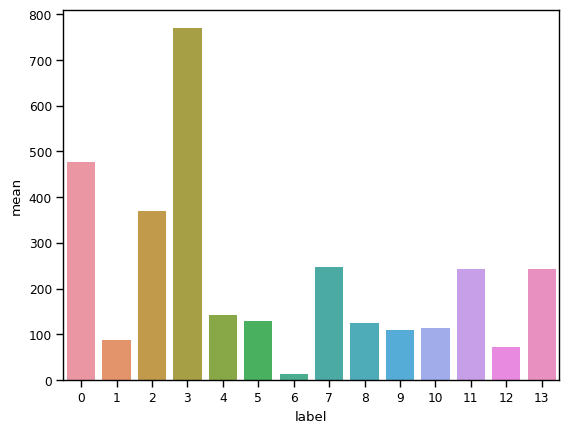

In [ ]:
sns.barplot(x = recap.index,
            y = recap['mean'])

Clusters les plus dépensiers : Clusters 9 et 13
il s'agit des catégories qui dépensent le plus dans les catégories "home" et "electronics"

In [ ]:
cluster[9].describe().loc[['mean', 'std', 'min','50%','max']]

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
mean,1.004208,4.643823,11.363254,14.507714,2.709677,151.971950,4.248247,2.993689,-21.793676,-46.214000,0.0,0.0,108.912553,0.0,0.0,0.0,0.0,0.953604,0.0,0.0,0.0,0.0,0.0
std,0.112351,0.309085,6.471298,5.241929,2.048192,126.943506,1.208037,2.594349,4.349558,3.487788,0.0,0.0,31.873384,0.0,0.0,0.0,0.0,25.463204,0.0,0.0,0.0,0.0,0.0
min,1.000000,3.911823,-1.000000,0.000000,0.000000,13.000000,1.000000,1.000000,-30.064053,-54.686073,0.0,0.0,54.400000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
50%,1.000000,4.699571,10.000000,15.000000,2.000000,117.000000,5.000000,2.000000,-22.903459,-46.634471,0.0,0.0,109.900000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
max,4.000000,5.135740,39.000000,23.000000,6.000000,577.000000,5.000000,10.000000,-3.716776,-35.204746,0.0,0.0,169.990000,0.0,0.0,0.0,0.0,679.920000,0.0,0.0,0.0,0.0,0.0


In [ ]:
cluster[13].describe().loc[['mean', 'std', 'min','50%','max']]

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
mean,1.258789,5.222957,12.816238,15.115622,2.796303,218.415730,4.130391,4.307901,-21.095124,-45.828353,1.178398,0.0,0.0,0.0,0.0,0.010149,239.174233,1.723378,0.385328,0.0,0.0,0.0,0.0
std,0.838094,0.509238,8.033296,5.448623,1.987408,139.008577,1.331400,2.883758,4.999324,3.641166,24.192612,0.0,0.0,0.0,0.0,0.533067,118.240569,29.502238,11.741286,0.0,0.0,0.0,0.0
min,1.000000,3.214868,-1.000000,0.000000,0.000000,13.000000,1.000000,1.000000,-30.071007,-56.086513,0.000000,0.0,0.0,0.0,0.0,0.000000,89.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
50%,1.000000,5.192401,11.000000,16.000000,3.000000,193.000000,5.000000,4.000000,-22.882235,-46.554341,0.000000,0.0,0.0,0.0,0.0,0.000000,199.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
max,9.000000,6.396596,46.000000,23.000000,6.000000,579.000000,5.000000,10.000000,-2.538363,-34.932184,720.000000,0.0,0.0,0.0,0.0,28.000000,599.800000,656.000000,399.920000,0.0,0.0,0.0,0.0


In [ ]:
for i in [9,13]:
    print('Nombre clients cluster ',i,': ', cluster[i].shape[0])

Nombre clients cluster  9 :  713
Nombre clients cluster  13 :  2759


### Les clients les moins dépensiers

Cluster 5 : les moins dépensiers et qui ont le moins recours aux facilités de paiement => opportunité de leur faire des offres sur les facilités de paiement

In [ ]:
cluster[5].describe().loc[['mean', 'std', 'min','50%','max']]

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
mean,1.040560,4.771455,14.831482,14.936263,2.779817,244.915500,4.122163,2.886287,-21.828446,-46.185750,0.0,0.0,0.0,127.940111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.329392,0.353394,8.638812,5.306799,1.969526,144.911654,1.248785,2.489346,4.550557,3.498026,0.0,0.0,0.0,43.574655,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,1.000000,3.257327,-1.000000,0.000000,0.000000,13.000000,1.000000,1.000000,-30.080304,-56.082433,0.0,0.0,0.0,59.900000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,1.000000,4.786658,13.000000,15.000000,3.000000,233.000000,5.000000,2.000000,-22.931611,-46.629100,0.0,0.0,0.0,119.980000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,4.000000,5.521061,46.000000,23.000000,6.000000,579.000000,5.000000,10.000000,-2.516840,-34.932184,0.0,0.0,0.0,249.900000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print('Nombre clients cluster ',5,': ', cluster[5].shape[0])

Nombre clients cluster  5 :  2071


### Les clients qui ont acheté le plus grand nombre de produits

Cluster 12 : ils mettent en moyenne une moins bonne note

In [ ]:
cluster[9].describe().loc[['mean', 'std', 'min','50%','max']]

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
mean,1.004208,4.643823,11.363254,14.507714,2.709677,151.971950,4.248247,2.993689,-21.793676,-46.214000,0.0,0.0,108.912553,0.0,0.0,0.0,0.0,0.953604,0.0,0.0,0.0,0.0,0.0
std,0.112351,0.309085,6.471298,5.241929,2.048192,126.943506,1.208037,2.594349,4.349558,3.487788,0.0,0.0,31.873384,0.0,0.0,0.0,0.0,25.463204,0.0,0.0,0.0,0.0,0.0
min,1.000000,3.911823,-1.000000,0.000000,0.000000,13.000000,1.000000,1.000000,-30.064053,-54.686073,0.0,0.0,54.400000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
50%,1.000000,4.699571,10.000000,15.000000,2.000000,117.000000,5.000000,2.000000,-22.903459,-46.634471,0.0,0.0,109.900000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
max,4.000000,5.135740,39.000000,23.000000,6.000000,577.000000,5.000000,10.000000,-3.716776,-35.204746,0.0,0.0,169.990000,0.0,0.0,0.0,0.0,679.920000,0.0,0.0,0.0,0.0,0.0


In [ ]:
print('Nombre clients cluster ',9,': ', cluster[9].shape[0])

Nombre clients cluster  9 :  713


### Les longs délais de livraison

Cluster 3 : ceux qui ont eu un long délai de commande et mettent des mauvaises notes => leur proposer une livraison rapide pour améliorer leur expérience

In [ ]:
cluster[3].describe().loc[['mean', 'std', 'min','50%','max']]

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
mean,4.607277,4.851806,12.019083,14.941680,2.786517,236.619048,3.692795,3.645042,-22.158437,-46.259812,757.489791,0.614489,0.0,0.0,2.139347,0.0,0.113858,9.440776,0.0,0.444302,0.0,0.0,0.0
std,1.896935,0.587409,7.190980,5.313846,1.980340,147.964231,1.544593,2.977133,3.839780,3.326379,402.119125,15.046681,0.0,0.0,26.036168,0.0,4.922287,64.728496,0.0,13.588577,0.0,0.0,0.0
min,1.000000,2.647828,-1.000000,0.000000,0.000000,13.000000,1.000000,1.000000,-30.060963,-56.084154,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0
50%,4.000000,4.787408,10.000000,15.000000,3.000000,216.000000,4.000000,3.000000,-22.956040,-46.612001,647.600000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0
max,10.000000,6.801283,46.000000,23.000000,6.000000,579.000000,5.000000,10.000000,-2.542308,-35.034567,1944.000000,463.840000,0.0,0.0,519.120000,0.0,212.800000,798.400000,0.0,431.200000,0.0,0.0,0.0


In [ ]:
print('Nombre clients cluster ',3,': ', cluster[3].shape[0])

Nombre clients cluster  3 :  1869


### Les très longs délais de livraison (> 1 mois)

In [ ]:
cluster[3][cluster[3]['Delai_Moy_Commande']>30].describe()

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
count,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.0,49.0,49.0,49.0,49.0,49.0,49.000000,49.0,49.0,49.0,49.0,49.0
mean,4.408163,4.943707,36.448980,14.938776,3.224490,241.040816,2.107143,3.755102,-20.864591,-45.156546,831.742857,0.0,0.0,0.0,0.0,0.0,0.0,6.530612,0.0,0.0,0.0,0.0,0.0
std,1.869919,0.662621,4.456088,5.680406,2.043947,118.012704,1.534329,2.995000,5.459680,4.275574,440.054669,0.0,0.0,0.0,0.0,0.0,0.0,45.714286,0.0,0.0,0.0,0.0,0.0
min,1.000000,3.610918,30.500000,0.000000,0.000000,44.000000,1.000000,1.000000,-29.995724,-55.503513,239.920000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
25%,4.000000,4.603168,33.000000,12.000000,1.000000,181.000000,1.000000,1.000000,-22.977648,-47.195927,488.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
50%,4.000000,4.940213,36.000000,16.000000,4.000000,204.000000,1.000000,2.000000,-22.828671,-43.505640,698.900000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
75%,4.000000,5.347108,39.000000,20.000000,5.000000,280.000000,3.000000,6.000000,-19.939460,-42.539315,1118.800000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
max,9.000000,6.549508,46.000000,23.000000,6.000000,560.000000,5.000000,10.000000,-3.753296,-38.324473,1944.000000,0.0,0.0,0.0,0.0,0.0,0.0,320.000000,0.0,0.0,0.0,0.0,0.0


In [ ]:
cluster[3][cluster[3]['Delai_Moy_Commande']>30].shape

(49, 25)

### Les catégories les plus achetées

**les catégories les plus achetées:**

<Axes: title={'center': 'Montant moyen de dépense par catégorie de produit'}, xlabel='price', ylabel='index'>

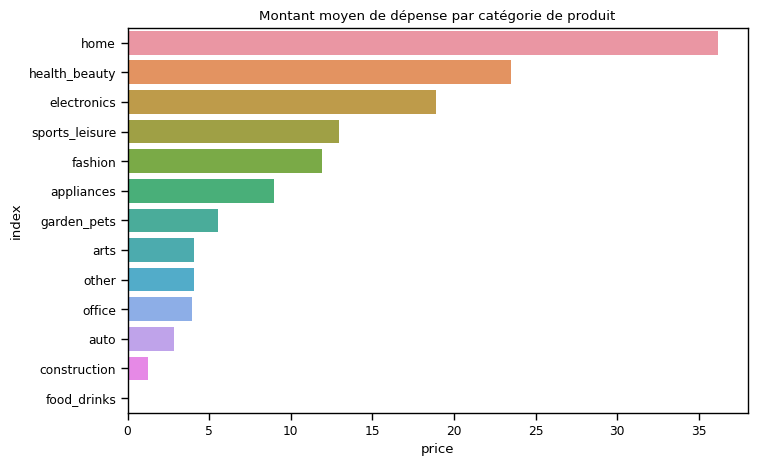

In [ ]:
# liste_col = [('price', 'home'), ('price', 'appliances'),
#        ('price', 'construction'), ('price', 'office'),
#        ('price', 'electronics'), ('price', 'arts'), ('price', 'fashion'),
#        ('price', 'health_beauty'), ('price', 'sports_leisure'),
#        ('price', 'garden_pets'), ('price', 'auto'),
#        ('price', 'food_drinks'), ('price', 'other')]
# dict_val = {}
# for column in liste_col:
#     dict_val[str(column).split("'")[3]] = data[str(column)].sum()/data.shape[0]

# plt.figure(figsize=(8,5))
# plt.title('Montant moyen de dépense par catégorie de produit')
# sns.barplot(y = 'index',
#             x='price',
#             data = pd.DataFrame(dict_val, index=['price']).T.reset_index().sort_values(by='price', ascending=False))
# Liste des colonnes de produits et de leur catégorie
liste_col = [('price', 'home'), ('price', 'appliances'),
             ('price', 'construction'), ('price', 'office'),
             ('price', 'electronics'), ('price', 'arts'), ('price', 'fashion'),
             ('price', 'health_beauty'), ('price', 'sports_leisure'),
             ('price', 'garden_pets'), ('price', 'auto'),
             ('price', 'food_drinks'), ('price', 'other')]

# Dictionnaire pour stocker les montants moyens de dépense par catégorie de produit
dict_val = {}

# Parcours de chaque colonne de produits et de leur catégorie dans la liste
for column in liste_col:
    # Calcule le montant moyen de dépense pour la catégorie de produit
    dict_val[str(column).split("'")[3]] = data[str(column)].sum() / data.shape[0]

# Crée une nouvelle figure avec une taille de 8x5
plt.figure(figsize=(8, 5))

# Définit le titre de la figure comme 'Montant moyen de dépense par catégorie de produit'
plt.title('Montant moyen de dépense par catégorie de produit')

# Affiche un graphique à barres horizontales avec les catégories de produits sur l'axe y,
# les montants moyens de dépense sur l'axe x,
# en utilisant les données du DataFrame créé à partir du dictionnaire dict_val,
# triées par ordre décroissant des montants moyens de dépense
sns.barplot(y='index',
            x='price',
            data=pd.DataFrame(dict_val, index=['price']).T.reset_index().sort_values(by='price', ascending=False))

Ce code calcule le montant moyen de dépense pour chaque catégorie de produit, à partir des colonnes de prix et de catégorie dans la liste liste_col. Ensuite, il crée un graphique à barres horizontales montrant les montants moyens de dépense pour chaque catégorie de produit, triées par ordre décroissant des montants.

In [ ]:
cluster[11].describe().loc[['mean', 'std', 'min','50%','max']]

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
mean,1.518164,5.085837,11.749226,14.870177,2.651647,246.586314,4.219656,3.488876,-22.064092,-46.453366,1.054058,0.0,0.0,0.0,0.526297,0.0,0.488426,0.409327,178.508786,62.348164,0.0,0.0,0.0
std,1.112107,0.532869,6.916462,5.375614,1.951532,147.060205,1.260915,2.911962,4.183134,3.366456,19.684857,0.0,0.0,0.0,11.425468,0.0,13.575643,12.345621,153.748568,114.246185,0.0,0.0,0.0
min,1.000000,2.493205,-1.000000,0.000000,0.000000,13.000000,1.000000,1.000000,-30.077807,-56.086513,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
50%,1.000000,5.068904,10.000000,15.000000,3.000000,223.000000,5.000000,2.000000,-22.937050,-46.658460,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,159.900000,0.000000,0.0,0.0,0.0
max,9.000000,6.505784,46.000000,23.000000,6.000000,580.000000,5.000000,10.000000,-2.550546,-34.939870,551.200000,0.0,0.0,0.0,439.200000,0.0,479.200000,439.920000,669.000000,431.200000,0.0,0.0,0.0


In [ ]:
cluster[7][cluster[7]['Nb_pdts']>2].describe().loc[['mean', 'std', 'min','50%','max']]

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
mean,4.233974,4.223122,9.735577,15.000000,2.823718,229.067308,3.806090,3.131410,-22.469047,-46.502951,23.468462,345.563878,0.0,0.0,7.459231,0.0,0.0,1.396667,0.0,0.0,0.0,0.0,0.0
std,1.048533,0.502258,6.242664,5.199555,1.983294,148.136567,1.524208,2.673024,3.749467,2.933296,116.714987,122.664543,0.0,0.0,60.769227,0.0,0.0,24.670052,0.0,0.0,0.0,0.0,0.0
min,4.000000,2.637628,-1.000000,0.000000,0.000000,14.000000,1.000000,1.000000,-30.073588,-53.916205,0.000000,135.200000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
50%,4.000000,4.273884,8.000000,15.000000,3.000000,196.500000,5.000000,2.000000,-23.403978,-46.695299,0.000000,344.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
max,10.000000,4.982236,45.000000,23.000000,6.000000,570.000000,5.000000,10.000000,-2.567402,-34.939870,1112.000000,583.200000,0.0,0.0,624.000000,0.0,0.0,435.760000,0.0,0.0,0.0,0.0,0.0


In [ ]:
cluster[7][cluster[7]['Nb_pdts']>2].describe().loc[['mean', 'std', 'min','50%','max']]

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
mean,4.233974,4.223122,9.735577,15.000000,2.823718,229.067308,3.806090,3.131410,-22.469047,-46.502951,23.468462,345.563878,0.0,0.0,7.459231,0.0,0.0,1.396667,0.0,0.0,0.0,0.0,0.0
std,1.048533,0.502258,6.242664,5.199555,1.983294,148.136567,1.524208,2.673024,3.749467,2.933296,116.714987,122.664543,0.0,0.0,60.769227,0.0,0.0,24.670052,0.0,0.0,0.0,0.0,0.0
min,4.000000,2.637628,-1.000000,0.000000,0.000000,14.000000,1.000000,1.000000,-30.073588,-53.916205,0.000000,135.200000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
50%,4.000000,4.273884,8.000000,15.000000,3.000000,196.500000,5.000000,2.000000,-23.403978,-46.695299,0.000000,344.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
max,10.000000,4.982236,45.000000,23.000000,6.000000,570.000000,5.000000,10.000000,-2.567402,-34.939870,1112.000000,583.200000,0.0,0.0,624.000000,0.0,0.0,435.760000,0.0,0.0,0.0,0.0,0.0


In [ ]:
for i in range(13):
    print('Nombre clients cluster ',i,': ', cluster[i].shape[0])

Nombre clients cluster  0 :  1416
Nombre clients cluster  1 :  8705
Nombre clients cluster  2 :  2682
Nombre clients cluster  3 :  1869
Nombre clients cluster  4 :  1838
Nombre clients cluster  5 :  2071
Nombre clients cluster  6 :  1
Nombre clients cluster  7 :  1859
Nombre clients cluster  8 :  1320
Nombre clients cluster  9 :  713
Nombre clients cluster  10 :  2172
Nombre clients cluster  11 :  3551
Nombre clients cluster  12 :  43749


### Les clients ayant acheté le plus de produits

In [ ]:
data[data['Nb_pdts'] >=4].shape

(4545, 25)

In [ ]:
data.loc[data[data['Nb_pdts'] >=2].index].shape

(5803, 25)

### Les clients les plus satisfaits de leurs produits

In [ ]:
data['Note_Moy_Com'].describe()

count    74705.000000
mean         4.161986
std          1.275566
min          1.000000
25%          4.000000
50%          5.000000
75%          5.000000
max          5.000000
Name: Note_Moy_Com, dtype: float64

In [ ]:
data[data['Note_Moy_Com']==5].shape

(44167, 25)

In [ ]:
data.head()

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,order_purchase_timestamp,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Moy_Paiment,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')"
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1.0,4.866765,7.0,2018-05-10 10:56:27,10.0,3.0,115.0,5.0,credit_card,8.0,-23.340262,-46.831085,129.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1.0,2.939162,4.0,2018-05-07 11:11:27,11.0,0.0,118.0,4.0,credit_card,1.0,-23.559044,-46.788516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.9,0.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,1.0,4.234107,26.0,2017-03-10 21:05:03,21.0,4.0,541.0,3.0,credit_card,8.0,-27.543010,-48.634938,0.0,0.0,0.0,69.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,1.0,5.192957,14.0,2017-11-14 19:45:42,19.0,1.0,292.0,5.0,credit_card,6.0,-23.505588,-47.469820,0.0,0.0,0.0,0.0,180.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0004bd2a26a76fe21f786e4fbd80607f,1.0,5.036953,2.0,2018-04-05 19:33:16,19.0,3.0,150.0,4.0,credit_card,8.0,-23.515693,-46.690031,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,154.0,0.0,0.0,0.0


In [ ]:
data.loc[data[data['Nb_pdts'] >=2].index].shape

(5803, 25)

### clients les moins satisfaits de leurs produits

In [ ]:
data[data['Note_Moy_Com']==1].shape

(7129, 25)

### clustering des clients qui consomment le plus

In [ ]:
X3 = pd.DataFrame(X_pca_tot, index = data.index)

Sélection des clients qui ont acheté plus de 4 produits

In [ ]:
# dict_silhouette = {}
# dict_kmeans_consumers = {}
# for i in range(3,15,1):
#     dict_kmeans_consumers[i] = KMeans(n_clusters=i, 
#                     verbose=1, 
#                     random_state=0).fit(X3.loc[data[data['Nb_pdts'] >=4].index])
#     dict_silhouette[i] = (silhouette_score(X = X3.loc[data[data['Nb_pdts'] >=4].index],
#                          labels= list(dict_kmeans_consumers[i].labels_)))
dict_silhouette = {}  # Dictionnaire pour stocker les scores de silhouette pour chaque nombre de clusters
dict_kmeans_consumers = {}  # Dictionnaire pour stocker les modèles KMeans pour chaque nombre de clusters

for i in range(3, 15, 1):  # Boucle pour essayer différents nombres de clusters de 3 à 14 inclus
    # Entraînement du modèle KMeans avec i clusters pour les consommateurs ayant acheté au moins 4 produits
    dict_kmeans_consumers[i] = KMeans(n_clusters=i,
                                      verbose=1,
                                      random_state=0).fit(X3.loc[data[data['Nb_pdts'] >= 4].index])
    # Calcul du score de silhouette pour le modèle KMeans et enregistrement dans le dictionnaire 'dict_silhouette'
    dict_silhouette[i] = silhouette_score(X=X3.loc[data[data['Nb_pdts'] >= 4].index],
                                          labels=list(dict_kmeans_consumers[i].labels_))


Initialization complete
Iteration 0, inertia 212283.69742577898
Iteration 1, inertia 169783.5266267534
Iteration 2, inertia 160572.68262336694
Iteration 3, inertia 160275.7341502086
Iteration 4, inertia 160266.82798278745
Iteration 5, inertia 160266.58688422389
Converged at iteration 5: strict convergence.
Initialization complete
Iteration 0, inertia 219356.39532234694
Iteration 1, inertia 158765.58759817955
Iteration 2, inertia 158143.85402249603
Iteration 3, inertia 158017.74690393204
Iteration 4, inertia 157996.61309577565
Iteration 5, inertia 157993.6778076498
Iteration 6, inertia 157992.8059399647
Converged at iteration 6: center shift 8.6502628252875e-05 within tolerance 0.00023676814706386688.
Initialization complete
Iteration 0, inertia 170740.1481087291
Iteration 1, inertia 149255.4925650505
Iteration 2, inertia 148767.356435854
Iteration 3, inertia 148579.32491043903
Iteration 4, inertia 148499.72710135984
Iteration 5, inertia 148469.85776550532
Iteration 6, inertia 148455.64

Initialization complete
Iteration 0, inertia 174534.73744505076
Iteration 1, inertia 125540.37904907136
Iteration 2, inertia 113052.02199474466
Iteration 3, inertia 111965.92509810862
Iteration 4, inertia 111650.15587685964
Iteration 5, inertia 111507.78600377409
Iteration 6, inertia 111438.05935700912
Iteration 7, inertia 111400.79611752195
Iteration 8, inertia 111388.91298205368
Iteration 9, inertia 111382.12621228803
Iteration 10, inertia 111380.03126387634
Iteration 11, inertia 111377.35629591948
Iteration 12, inertia 111376.13385481221
Converged at iteration 12: center shift 0.0001461226303326111 within tolerance 0.00023676814706386688.
Initialization complete
Iteration 0, inertia 168876.39690960382
Iteration 1, inertia 115005.17038389354
Iteration 2, inertia 113290.16022950233
Iteration 3, inertia 112701.5344126196
Iteration 4, inertia 112451.17229899288
Iteration 5, inertia 112337.33489742399
Iteration 6, inertia 112290.465150106
Iteration 7, inertia 112265.3472738051
Iteration 

Initialization complete
Iteration 0, inertia 132731.57515787028
Iteration 1, inertia 81035.17808799431
Iteration 2, inertia 73947.32719337981
Iteration 3, inertia 73082.20631935936
Iteration 4, inertia 72797.36345956217
Iteration 5, inertia 72686.17012523384
Iteration 6, inertia 72666.61889295935
Iteration 7, inertia 72658.14401666577
Iteration 8, inertia 72655.70986151746
Iteration 9, inertia 72654.59864372377
Iteration 10, inertia 72654.13871501619
Iteration 11, inertia 72653.84803678376
Converged at iteration 11: center shift 0.00013465002454870066 within tolerance 0.00023676814706386688.
Initialization complete
Iteration 0, inertia 111627.32476571658
Iteration 1, inertia 84151.14352838288
Iteration 2, inertia 82390.09919762333
Iteration 3, inertia 82012.57155544336
Iteration 4, inertia 81836.37973805585
Iteration 5, inertia 81726.92597759089
Iteration 6, inertia 81625.92962183127
Iteration 7, inertia 81539.69804591658
Iteration 8, inertia 81477.46392428635
Iteration 9, inertia 8140

Iteration 5, inertia 66876.86285542135
Iteration 6, inertia 66858.41233618573
Iteration 7, inertia 66850.76930439204
Iteration 8, inertia 66844.81250330369
Iteration 9, inertia 66839.74690789275
Iteration 10, inertia 66836.2890143987
Iteration 11, inertia 66834.03491078892
Iteration 12, inertia 66833.81226715722
Converged at iteration 12: center shift 5.726010419416339e-05 within tolerance 0.00023676814706386688.
Initialization complete
Iteration 0, inertia 110397.32764349853
Iteration 1, inertia 80267.9693744169
Iteration 2, inertia 70941.57661427006
Iteration 3, inertia 67901.49826258926
Iteration 4, inertia 66968.14211676546
Iteration 5, inertia 66885.38170477556
Iteration 6, inertia 66859.38242093578
Iteration 7, inertia 66837.55172790898
Iteration 8, inertia 66834.5348736187
Iteration 9, inertia 66834.0925876052
Converged at iteration 9: center shift 0.0001567833791034543 within tolerance 0.00023676814706386688.
Initialization complete
Iteration 0, inertia 94431.58599188432
Iterat

Initialization complete
Iteration 0, inertia 86325.55232876181
Iteration 1, inertia 59151.98611309482
Iteration 2, inertia 58066.91952031239
Iteration 3, inertia 57982.00978110866
Iteration 4, inertia 57974.55735644086
Iteration 5, inertia 57972.78305924214
Iteration 6, inertia 57972.07345285824
Iteration 7, inertia 57971.76589443417
Converged at iteration 7: center shift 0.0002073176557298948 within tolerance 0.00023676814706386688.
Initialization complete
Iteration 0, inertia 86331.9660748198
Iteration 1, inertia 64036.66188147239
Iteration 2, inertia 63426.66809820455
Iteration 3, inertia 63245.69579669898
Iteration 4, inertia 63187.378637442416
Iteration 5, inertia 63162.061115885816
Iteration 6, inertia 63142.21040980128
Iteration 7, inertia 63134.91845488391
Iteration 8, inertia 63124.190523427744
Iteration 9, inertia 63119.247541167475
Iteration 10, inertia 63115.44466163831
Iteration 11, inertia 63112.25881703061
Iteration 12, inertia 63109.38308324794
Iteration 13, inertia 631

Initialization complete
Iteration 0, inertia 81805.70657716598
Iteration 1, inertia 59350.522955247216
Iteration 2, inertia 57055.87814893991
Iteration 3, inertia 55998.05486626499
Iteration 4, inertia 55355.687905991
Iteration 5, inertia 55105.05347435182
Iteration 6, inertia 55024.330364495705
Iteration 7, inertia 55003.09912647062
Iteration 8, inertia 54992.18865033169
Iteration 9, inertia 54986.74605730707
Iteration 10, inertia 54984.17750632515
Iteration 11, inertia 54983.13534532337
Iteration 12, inertia 54982.160514406634
Iteration 13, inertia 54981.618421329265
Iteration 14, inertia 54981.39587423927
Converged at iteration 14: center shift 4.5712873164316016e-05 within tolerance 0.00023676814706386688.
Initialization complete
Iteration 0, inertia 89981.89095213592
Iteration 1, inertia 63213.15205491996
Iteration 2, inertia 60918.32372600522
Iteration 3, inertia 60197.18776210386
Iteration 4, inertia 59427.503634968896
Iteration 5, inertia 56831.99433308077
Iteration 6, inertia 

Initialization complete
Iteration 0, inertia 79649.34422287648
Iteration 1, inertia 54636.79330338351
Iteration 2, inertia 53743.88049841277
Iteration 3, inertia 53531.18088319745
Iteration 4, inertia 53385.38379305989
Iteration 5, inertia 53260.8431395481
Iteration 6, inertia 53152.71140202313
Iteration 7, inertia 53075.09737051217
Iteration 8, inertia 53024.85091908726
Iteration 9, inertia 52979.26529354043
Iteration 10, inertia 52928.066169215585
Iteration 11, inertia 52872.77028391942
Iteration 12, inertia 52823.94335658338
Iteration 13, inertia 52758.638547778726
Iteration 14, inertia 52664.75769393245
Iteration 15, inertia 52562.11200976604
Iteration 16, inertia 52470.71682285354
Iteration 17, inertia 52403.556524907355
Iteration 18, inertia 52374.22627498875
Iteration 19, inertia 52357.49899189485
Iteration 20, inertia 52335.68950922703
Iteration 21, inertia 52315.501286989136
Iteration 22, inertia 52250.986015749266
Iteration 23, inertia 52142.168050240216
Iteration 24, inertia

Iteration 12, inertia 51727.18021529345
Iteration 13, inertia 51712.366337718
Iteration 14, inertia 51700.716846018295
Iteration 15, inertia 51688.0952122042
Iteration 16, inertia 51674.145085608485
Iteration 17, inertia 51664.450828092085
Iteration 18, inertia 51659.15195168261
Iteration 19, inertia 51655.896386454595
Iteration 20, inertia 51654.45666382169
Iteration 21, inertia 51653.12680230035
Iteration 22, inertia 51651.730311397754
Iteration 23, inertia 51649.95415757914
Iteration 24, inertia 51648.5059470521
Iteration 25, inertia 51647.75918483229
Iteration 26, inertia 51646.83837395985
Iteration 27, inertia 51645.76905907106
Iteration 28, inertia 51644.09435957563
Iteration 29, inertia 51641.80511969501
Iteration 30, inertia 51639.69504782978
Iteration 31, inertia 51638.664291024375
Iteration 32, inertia 51637.83807495352
Iteration 33, inertia 51636.93201300338
Iteration 34, inertia 51636.32739844728
Iteration 35, inertia 51635.84458205226
Iteration 36, inertia 51635.3900540018

Iteration 47, inertia 50473.56938550976
Converged at iteration 47: strict convergence.
Initialization complete
Iteration 0, inertia 78812.11785925686
Iteration 1, inertia 52991.96115140823
Iteration 2, inertia 52275.37526919385
Iteration 3, inertia 52059.55853365754
Iteration 4, inertia 51907.898218625145
Iteration 5, inertia 51798.676532263984
Iteration 6, inertia 51698.96691369191
Iteration 7, inertia 51598.70140682753
Iteration 8, inertia 51488.00121029204
Iteration 9, inertia 51401.448305623795
Iteration 10, inertia 51356.725084510865
Iteration 11, inertia 51328.847821213385
Iteration 12, inertia 51305.43427849186
Iteration 13, inertia 51289.72962896935
Iteration 14, inertia 51272.44280293428
Iteration 15, inertia 51246.56224673057
Iteration 16, inertia 51205.44912383018
Iteration 17, inertia 51126.720069697876
Iteration 18, inertia 51017.85721683627
Iteration 19, inertia 50938.81268635122
Iteration 20, inertia 50879.19058335212
Iteration 21, inertia 50841.108338287086
Iteration 22

Ce code essaie différents nombres de clusters (de 3 à 14 inclus) en utilisant KMeans, mais seulement pour les consommateurs ayant acheté au moins 4 produits (c'est ce que fait la sélection de l'index data[data['Nb_pdts'] >= 4].index dans X3.loc). Ensuite, il enregistre le score de silhouette pour chaque nombre de clusters dans le dictionnaire 'dict_silhouette' et enregistre également le modèle KMeans correspondant dans le dictionnaire 'dict_kmeans_consumers'.

In [ ]:
dict_silhouette

{3: 0.18857102308605483,
 4: 0.22875673036596408,
 5: 0.2589555139142689,
 6: 0.29277714273144867,
 7: 0.32449171141494193,
 8: 0.3388237257418915,
 9: 0.27683344855791603,
 10: 0.25972544593373376,
 11: 0.2490573996313648,
 12: 0.24172372816212645,
 13: 0.2320413355109247,
 14: 0.21250935155155115}

In [ ]:
print(max(dict_silhouette.values()))

0.3388237257418915


In [ ]:
best_num_clusters = max(dict_silhouette, key=dict_silhouette.get)
print("Le meilleur nombre de clusters est :", best_num_clusters)

Le meilleur nombre de clusters est : 13


In [ ]:
list(dict_silhouette.keys())[list(dict_silhouette.values()).index(max(dict_silhouette.values()))]

8

In [ ]:
X_most_imp_cat = data.copy()[data['Nb_pdts'] >=4]
X_most_imp_cat['label'] = dict_kmeans_consumers[8].labels_

In [ ]:
X_most_imp_cat.shape

(4545, 26)

cela représente 4600 clients potentiels

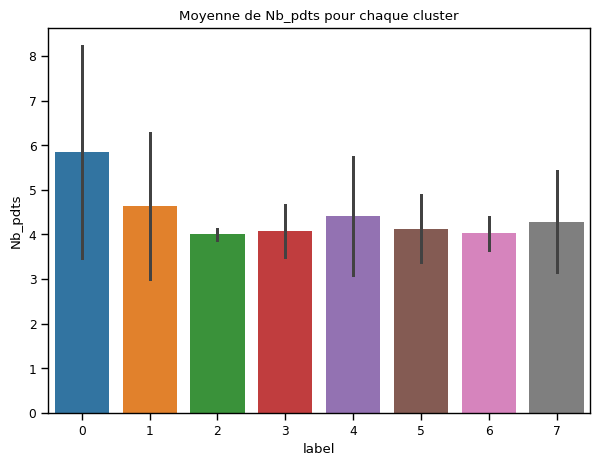

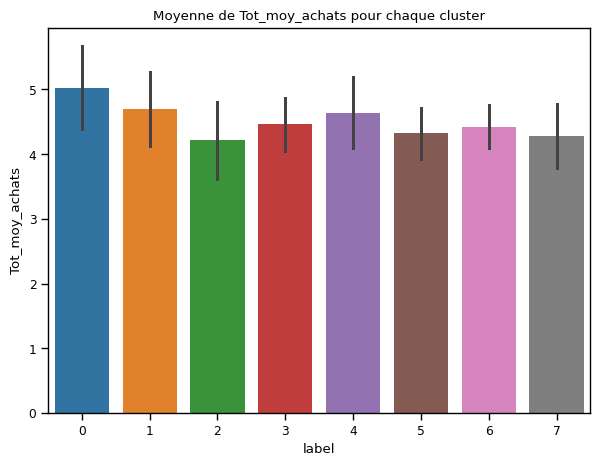

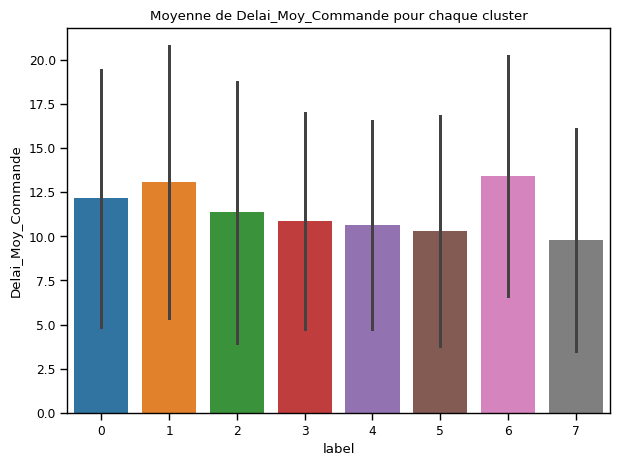

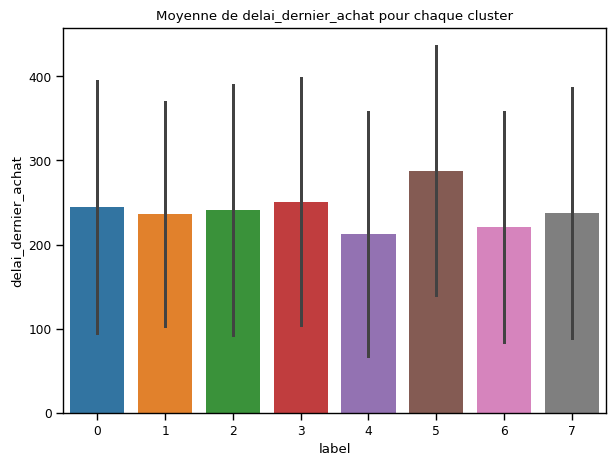

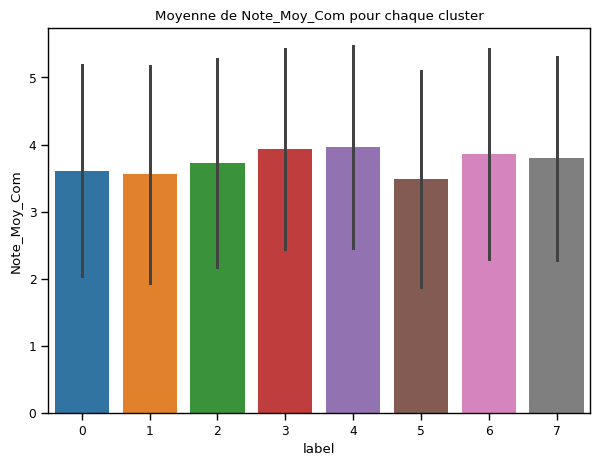

...

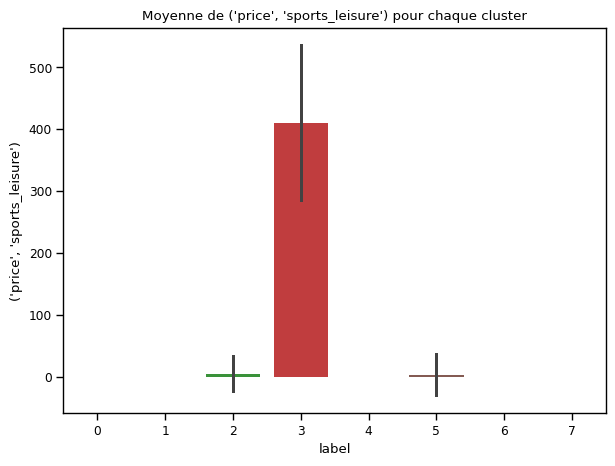

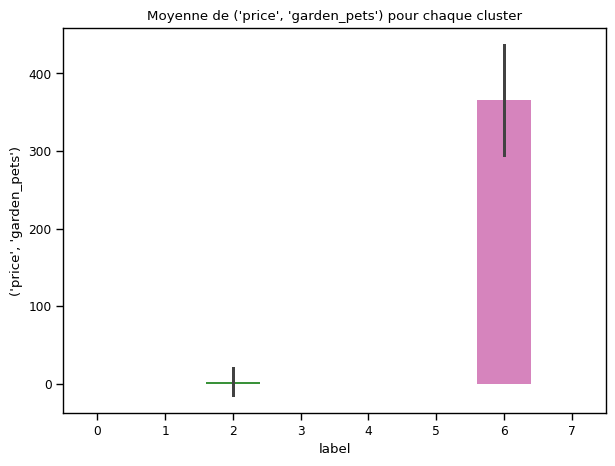

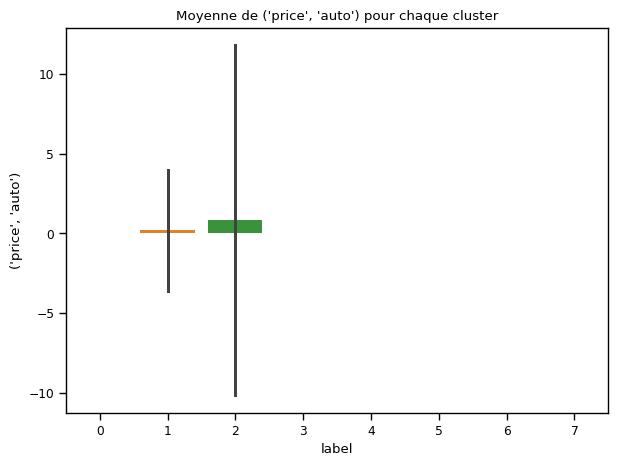

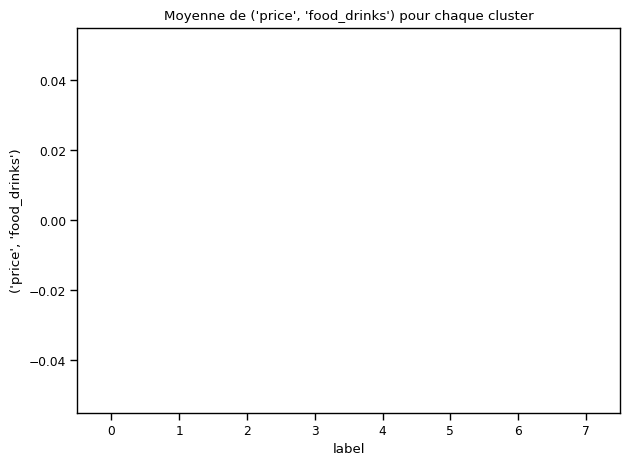

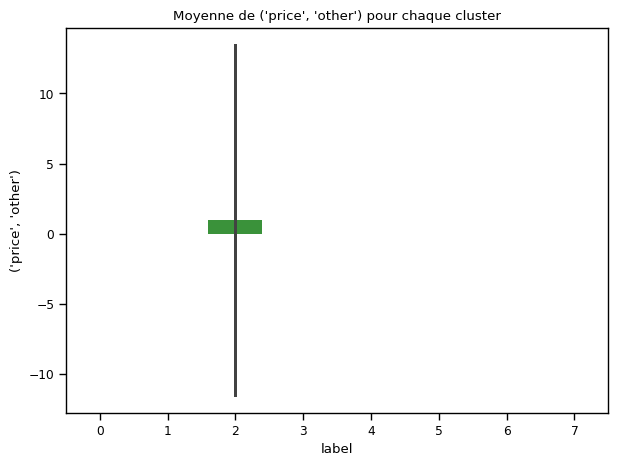

In [ ]:
# for column in X_most_imp_cat.drop(['order_purchase_timestamp', 'heure_achat', 'jour_achat', 'label'], axis=1).columns:
#     plt.figure(figsize=(7,5))
#     titre = 'Moyenne de ' + str(column) + ' pour chaque cluster' 
#     plt.title(titre)
#     sns.barplot(x = 'label',
#                 y = column,
#                 data = X_most_imp_cat, 
#                 ci="sd")
#     plt.show()
# Parcours de chaque colonne dans X_most_imp_cat (à l'exception de certaines colonnes) pour afficher les moyennes pour chaque cluster
for column in X_most_imp_cat.drop(['order_purchase_timestamp', 'heure_achat', 'jour_achat', 'label'], axis=1).columns:
    # Crée une nouvelle figure pour chaque colonne avec une taille de 7x5
    plt.figure(figsize=(7, 5))
    # Définit le titre de la figure comme 'Moyenne de [nom de la colonne] pour chaque cluster'
    titre = 'Moyenne de ' + str(column) + ' pour chaque cluster' 
    plt.title(titre)
    # Affiche un graphique à barres avec les clusters sur l'axe x, les valeurs moyennes de la colonne sur l'axe y,
    # en utilisant les données du DataFrame X_most_imp_cat et en incluant un intervalle de confiance ('ci="sd"')
    sns.barplot(x='label',
                y=column,
                data=X_most_imp_cat,
                ci="sd")
    # Affiche le graphique
    plt.show()


Ce code parcourt chaque colonne dans le DataFrame X_most_imp_cat, à l'exception des colonnes 'order_purchase_timestamp', 'heure_achat', 'jour_achat' et 'label'. Pour chaque colonne, il crée un graphique à barres montrant la moyenne de la colonne pour chaque cluster. Les clusters sont représentés sur l'axe des x, les valeurs moyennes de la colonne sont représentées sur l'axe des y, et l'intervalle de confiance est inclus pour montrer la variabilité des données. Le code affiche ensuite chaque graphique.

In [ ]:
X_most_imp_cat.shape

(4545, 26)

La différence entre les clusters se fait principalement par les catégories de dépense:
* les individus du cluster 1 a dépensé en moyenne 1200 en produit 'home'
* les individus du  du cluster 3 ont dépensé en moyenne plus de 370 dans la catégorie 'appliances'
* les individus du cluster 5 ont dépensé en moyenne 600 dans la catégorie electronics
* les individus du cluster 0 ont dépensé en moyenne 600 dans la catégorie health/beauty
* les individus du cluster 6 ont dépensé en moyenne 350 dans la catégorie fashion
* les individus du cluster 7 ont dépensé en moyenne 400 dans la catégorie sport/leisure
* les individus du cluster 2 ont dépensé en moyenne plus de 400 dans la catégorie "garden" / pets
* les individus du cluster 4 ont dépensé en moyenne 300 dans la catégorie 'home' 

on peut par exemple cibler prioritairement ces clients pour des publicités de produits des catégories indiquées ci-dessus

Certaines catégories de produits séduisent davantage de catégories de clients que d'autres, c'est notamment le cas des catégories home, electronics et health beauty qui ont des acheteurs dans tous les clusters. Il y a un levier potentiellement exploitable pour rediriger les clients des autres catégories vers ces catégories

# Caractérisation évolution dans le temps  

* Idée : on pourrait réduire les données en retirant les derniers mois de données et voir si les clusters évoluent ou non : si oui cela veut dire qu’il faut actualiser sur une période de temps plus faible
* Essayer en isolant une région ou autre variable pour voir si le cluster est robuste ou non


In [ ]:
data['order_purchase_timestamp'] = data['order_purchase_timestamp'].astype('datetime64')

In [ ]:
data['order_purchase_timestamp'].describe()

count                   74705
unique                  74547
top       2018-02-19 15:37:47
freq                        3
first     2017-01-30 10:03:21
last      2018-08-21 09:04:45
Name: order_purchase_timestamp, dtype: object

Pour voir si le clustering est stable:
* on va retirer du jeu de données tous les clients dont le dernier achat date d'il y a moins de n mois avec différents pas

In [ ]:
X_tot

,Nb_pdts,Tot_moy_achats,Delai_Moy_Commande,heure_achat,jour_achat,delai_dernier_achat,Note_Moy_Com,Facilités,geolocation_lat,geolocation_lng,"('price', 'home')","('price', 'appliances')","('price', 'construction')","('price', 'office')","('price', 'electronics')","('price', 'arts')","('price', 'fashion')","('price', 'health_beauty')","('price', 'sports_leisure')","('price', 'garden_pets')","('price', 'auto')","('price', 'food_drinks')","('price', 'other')",x0_boleto,x0_credit_card,x0_debit_card,x0_voucher
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.252934,0.674413,-0.659922,-0.905895,0.125612,-0.844066,0.656979,2.179455,-0.363934,-0.205560,0.662448,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.252934,-1.754239,-1.053042,-0.717425,-1.396007,-0.823856,-0.126992,-0.701164,-0.408854,-0.193730,-0.255630,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.056408,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0000f46a3911fa3c0805444483337064,-0.252934,-0.122695,1.829840,1.167276,0.632818,2.025695,-0.910963,2.179455,-1.226842,-0.706863,-0.255630,-0.203981,-0.108908,2.879229,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,-0.252934,1.085393,0.257359,0.790336,-0.888801,0.348299,0.656979,1.356421,-0.397879,-0.383069,-0.255630,-0.203981,-0.108908,-0.175051,2.121843,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
0004bd2a26a76fe21f786e4fbd80607f,-0.252934,0.888838,-1.315122,0.790336,0.125612,-0.608288,-0.126992,2.179455,-0.399954,-0.166360,-0.255630,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,4.725049,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffb09418989a0dbff854a28163e47c6,-0.252934,-0.341499,-0.397842,0.790336,1.647231,0.125994,0.656979,-0.701164,-1.513058,-1.516901,-0.255630,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,0.880644,-0.289022,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,1.0,0.0,0.0,0.0
fffea47cd6d3cc0a88bd621562a9d061,-0.252934,-0.200071,2.485040,0.978806,1.647231,0.173150,-0.126992,-0.701164,1.919709,1.982079,-0.255630,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,0.509620,-0.241773,-0.176654,-0.159481,-0.003659,-0.171063,0.0,1.0,0.0,0.0
ffff371b4d645b6ecea244b27531430a,-0.252934,0.210673,0.388399,0.036455,-0.888801,2.234527,0.656979,-0.701164,1.998387,-2.616972,-0.255630,-0.203981,-0.108908,-0.175051,-0.249208,-0.195361,-0.227077,-0.289022,-0.241773,-0.176654,4.837696,-0.003659,-0.171063,0.0,1.0,0.0,0.0


## Préparation jeu de données

Faisons un test de clustering en retirant les 3 derniers mois du jeu de données (test de faisabilité en retirant tous les clients qui ont fait un achat dans les 3 derniers mois)

In [ ]:
data['order_purchase_timestamp'].max()

Timestamp('2018-08-21 09:04:45')

In [ ]:
data[data['order_purchase_timestamp'] < '2018-05-21 09:04:45'].shape

(59105, 25)

In [ ]:
X_old = data[data['order_purchase_timestamp'] < '2018-05-21 09:04:45'].copy()

In [ ]:
categorical_columns = X_old.select_dtypes(['category','object']).columns
numerical_columns = X_old.select_dtypes(['int32','float64']).columns


X_old[numerical_columns] = ss.transform(X_old[numerical_columns])
ohe.fit(X_old[categorical_columns])

OneHotEncoder(sparse=False)

In [ ]:
X_old = pd.merge(X_old[numerical_columns], 
          pd.DataFrame(columns = ohe.get_feature_names().tolist(),
              data = ohe.fit_transform(X_old[categorical_columns])).set_index(X_old.index),
        left_index = True, right_index = True)

## ACP

In [ ]:
X_pca_old = pca_tot.transform(X_old)[:,:18]

## Kmeans

In [ ]:
# inertia = {}
# dict_kmeans = {}
# dict_silhouette = {}
# for k in range(5,20):
#     kmeans_old = KMeans(n_clusters=k,
#                    verbose=1,
#                    random_state=0).fit(X_pca_old)
#     inertia[k] = kmeans.inertia_
#     dict_kmeans[k] = kmeans
#     dict_silhouette[k] = silhouette_score(X = X_pca_old, labels= kmeans_old.labels_)
#     print('Boucle {} - Silhouette score : {}'.format(k, dict_silhouette[k]))
inertia = {}  # Dictionnaire pour stocker l'inertie pour chaque nombre de clusters
dict_kmeans = {}  # Dictionnaire pour stocker les modèles KMeans pour chaque nombre de clusters
dict_silhouette = {}  # Dictionnaire pour stocker le score de silhouette pour chaque nombre de clusters

for k in range(5, 20):  # Boucle pour essayer différents nombres de clusters de 5 à 19 inclus
    kmeans_old = KMeans(n_clusters=k,
                        verbose=1,
                        random_state=0).fit(X_pca_old)  # Entraînement du modèle KMeans avec k clusters
    inertia[k] = kmeans.inertia_  # Enregistrement de l'inertie du modèle dans le dictionnaire 'inertia'
    dict_kmeans[k] = kmeans_old  # Enregistrement du modèle KMeans dans le dictionnaire 'dict_kmeans'
    dict_silhouette[k] = silhouette_score(X=X_pca_old, labels=kmeans_old.labels_)  # Calcul du score de silhouette pour le modèle et enregistrement dans le dictionnaire 'dict_silhouette'
    print('Boucle {} - Silhouette score : {}'.format(k, dict_silhouette[k]))  # Affichage du score de silhouette pour chaque nombre de clusters


Initialization complete
Iteration 0, inertia 1207523.858448941
Iteration 1, inertia 980012.4275386131
Iteration 2, inertia 973153.8453265539
Iteration 3, inertia 967093.9587477405
Iteration 4, inertia 962939.8170899265
Iteration 5, inertia 960873.4180915917
Iteration 6, inertia 959817.0683814653
Iteration 7, inertia 959121.5602281459
Iteration 8, inertia 958590.1981707071
Iteration 9, inertia 958218.5208893805
Iteration 10, inertia 957973.9754645424
Iteration 11, inertia 957816.3526348164
Iteration 12, inertia 957749.3300620315
Iteration 13, inertia 957712.3550455603
Iteration 14, inertia 957689.4013496041
Iteration 15, inertia 957675.1664311949
Iteration 16, inertia 957666.9398701831
Iteration 17, inertia 957662.3171939233
Iteration 18, inertia 957659.6576833733
Converged at iteration 18: center shift 0.00010147553548092276 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 1226848.384128261
Iteration 1, inertia 1018480.7033176824
Iteration 2, inerti

Initialization complete
Iteration 0, inertia 1247281.3796542208
Iteration 1, inertia 1020363.3749364456
Iteration 2, inertia 1004487.8982404473
Iteration 3, inertia 993902.5609439797
Iteration 4, inertia 985699.2071732414
Iteration 5, inertia 980019.250098863
Iteration 6, inertia 976695.4647301506
Iteration 7, inertia 975316.0758618605
Iteration 8, inertia 974859.0882038937
Iteration 9, inertia 974721.4049854745
Iteration 10, inertia 974671.7601178358
Iteration 11, inertia 974642.1290772505
Iteration 12, inertia 974615.2693559988
Iteration 13, inertia 974576.0421607667
Iteration 14, inertia 974526.6350999123
Iteration 15, inertia 974494.1247294017
Iteration 16, inertia 974467.2590607032
Iteration 17, inertia 974450.5544134848
Iteration 18, inertia 974441.6846455487
Iteration 19, inertia 974435.0790380486
Iteration 20, inertia 974429.2124611958
Iteration 21, inertia 974424.675832502
Iteration 22, inertia 974420.9802201203
Converged at iteration 22: center shift 9.642012751382742e-05 wit

Iteration 35, inertia 940069.7947973835
Iteration 36, inertia 937509.2596402356
Iteration 37, inertia 935757.1678414233
Iteration 38, inertia 934864.5883139787
Iteration 39, inertia 934470.4009306324
Iteration 40, inertia 934263.4647246911
Iteration 41, inertia 934144.4040580792
Iteration 42, inertia 934083.7126165141
Iteration 43, inertia 934055.1375780582
Iteration 44, inertia 934040.1976738262
Iteration 45, inertia 934031.8661721769
Iteration 46, inertia 934026.3133613508
Iteration 47, inertia 934023.3689760456
Iteration 48, inertia 934021.7993189816
Converged at iteration 48: center shift 4.234323194126238e-05 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 1153632.5709892523
Iteration 1, inertia 958489.6552090234
Iteration 2, inertia 949863.5343580891
Iteration 3, inertia 944025.1167607538
Iteration 4, inertia 940950.3407673963
Iteration 5, inertia 939477.3512811371
Iteration 6, inertia 938527.6034030572
Iteration 7, inertia 937711.0691571457


Iteration 31, inertia 871543.7045465938
Iteration 32, inertia 871533.4844669331
Iteration 33, inertia 871520.8222535953
Iteration 34, inertia 871500.8722911633
Iteration 35, inertia 871467.5279142379
Iteration 36, inertia 871416.6349116242
Iteration 37, inertia 871342.4149110338
Iteration 38, inertia 871212.9477381394
Iteration 39, inertia 870977.2498146658
Iteration 40, inertia 870488.8395944396
Iteration 41, inertia 869622.5663571175
Iteration 42, inertia 868763.9982648793
Iteration 43, inertia 867566.9504832064
Iteration 44, inertia 865344.9808523845
Iteration 45, inertia 862616.7894347783
Iteration 46, inertia 861488.0464612716
Iteration 47, inertia 860777.5832826531
Iteration 48, inertia 859577.1159334071
Iteration 49, inertia 857824.4827123644
Iteration 50, inertia 855657.975608537
Iteration 51, inertia 853062.3790291637
Iteration 52, inertia 850054.6270899161
Iteration 53, inertia 847530.6353243522
Iteration 54, inertia 846076.6960030951
Iteration 55, inertia 845303.2453514478
I

Iteration 5, inertia 883188.8127558369
Iteration 6, inertia 880663.7056107793
Iteration 7, inertia 879466.5404517885
Iteration 8, inertia 878926.2577855106
Iteration 9, inertia 878699.0447826729
Iteration 10, inertia 878582.7997666188
Iteration 11, inertia 878497.6052094764
Iteration 12, inertia 878409.3776856707
Iteration 13, inertia 878361.9881683958
Iteration 14, inertia 878347.7367443489
Iteration 15, inertia 878343.3845164062
Converged at iteration 15: center shift 8.553271159159674e-05 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 1028150.7729509023
Iteration 1, inertia 930986.960688738
Iteration 2, inertia 909983.5314184283
Iteration 3, inertia 898562.2820687415
Iteration 4, inertia 891938.8951712188
Iteration 5, inertia 885899.6385181504
Iteration 6, inertia 881830.6233986644
Iteration 7, inertia 879043.5611014693
Iteration 8, inertia 876002.6600039575
Iteration 9, inertia 869527.3554133247
Iteration 10, inertia 860597.7221444569
Iteratio

Iteration 32, inertia 820202.8330966329
Converged at iteration 32: center shift 8.694280485830902e-05 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 1086233.0478517567
Iteration 1, inertia 901953.878833948
Iteration 2, inertia 878732.9451452825
Iteration 3, inertia 867661.0037770381
Iteration 4, inertia 862804.3306375969
Iteration 5, inertia 860812.3385239912
Iteration 6, inertia 859310.3893375265
Iteration 7, inertia 858251.0556595079
Iteration 8, inertia 857780.7090669211
Iteration 9, inertia 857461.6687747238
Iteration 10, inertia 857200.389709965
Iteration 11, inertia 856928.1002716798
Iteration 12, inertia 856629.8389025672
Iteration 13, inertia 856283.5741272008
Iteration 14, inertia 855693.2737485083
Iteration 15, inertia 855437.7998337458
Iteration 16, inertia 855180.7869946269
Iteration 17, inertia 854656.2493497828
Iteration 18, inertia 853809.3252783705
Iteration 19, inertia 853462.1685072943
Iteration 20, inertia 853449.4709039874
Iter

Iteration 4, inertia 814419.9594603338
Iteration 5, inertia 810881.2534034174
Iteration 6, inertia 806754.8129176423
Iteration 7, inertia 802979.9055480983
Iteration 8, inertia 800864.655527281
Iteration 9, inertia 799504.0187217097
Iteration 10, inertia 798589.7175544496
Iteration 11, inertia 798032.9706750927
Iteration 12, inertia 797761.2210955757
Iteration 13, inertia 797607.0114851469
Iteration 14, inertia 797532.8578879688
Iteration 15, inertia 797494.0732393966
Iteration 16, inertia 797475.2410597679
Iteration 17, inertia 797463.668969734
Iteration 18, inertia 797453.0958639637
Iteration 19, inertia 797448.4571442585
Iteration 20, inertia 797445.8514029774
Iteration 21, inertia 797442.0991451307
Iteration 22, inertia 797438.5414505627
Iteration 23, inertia 797435.8078765468
Iteration 24, inertia 797434.3092378397
Converged at iteration 24: center shift 6.891526050660548e-05 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 1071199.8405397432
I

Initialization complete
Iteration 0, inertia 993432.4732826425
Iteration 1, inertia 861499.389986198
Iteration 2, inertia 830867.910948351
Iteration 3, inertia 819899.9778113521
Iteration 4, inertia 811949.6688529061
Iteration 5, inertia 806163.7953884186
Iteration 6, inertia 801217.1631989965
Iteration 7, inertia 797538.0681977887
Iteration 8, inertia 794512.9501422103
Iteration 9, inertia 790529.1694660422
Iteration 10, inertia 781509.0316691671
Iteration 11, inertia 773445.8248703016
Iteration 12, inertia 771646.1424055337
Iteration 13, inertia 771129.563127293
Iteration 14, inertia 770857.4212029245
Iteration 15, inertia 770694.8644266316
Iteration 16, inertia 770591.569246039
Iteration 17, inertia 770524.5848984333
Iteration 18, inertia 770463.2232670541
Iteration 19, inertia 770389.5290149617
Iteration 20, inertia 770342.1687565413
Iteration 21, inertia 770326.2871299004
Iteration 22, inertia 770321.394829391
Iteration 23, inertia 770318.9938896338
Converged at iteration 23: cent

Iteration 8, inertia 798736.574924211
Iteration 9, inertia 796012.5635512349
Iteration 10, inertia 793890.6723526757
Iteration 11, inertia 792192.7223845599
Iteration 12, inertia 790812.028353302
Iteration 13, inertia 789607.0176008166
Iteration 14, inertia 788301.8597692773
Iteration 15, inertia 784830.3550437784
Iteration 16, inertia 768070.5664126301
Iteration 17, inertia 753628.0939938859
Iteration 18, inertia 752685.2607701819
Iteration 19, inertia 752138.0208453046
Iteration 20, inertia 751283.7870948742
Iteration 21, inertia 749633.2490842213
Iteration 22, inertia 743432.149252705
Iteration 23, inertia 736704.4066982332
Iteration 24, inertia 736430.1203609325
Iteration 25, inertia 736318.221609405
Iteration 26, inertia 736252.9135701613
Iteration 27, inertia 736224.6272318315
Iteration 28, inertia 736208.6463869985
Iteration 29, inertia 736199.633956405
Iteration 30, inertia 736192.3904050638
Iteration 31, inertia 736185.8203517692
Iteration 32, inertia 736181.2191016111
Iterati

Iteration 0, inertia 911836.8994347642
Iteration 1, inertia 768238.0761762451
Iteration 2, inertia 757188.8279797712
Iteration 3, inertia 745025.2594046438
Iteration 4, inertia 735070.5255830224
Iteration 5, inertia 728188.4437224498
Iteration 6, inertia 723545.6797079588
Iteration 7, inertia 720319.7906663716
Iteration 8, inertia 718639.6978856787
Iteration 9, inertia 717983.0354249247
Iteration 10, inertia 717657.5818671646
Iteration 11, inertia 717456.0959057233
Iteration 12, inertia 717335.4129443502
Iteration 13, inertia 717253.964341571
Iteration 14, inertia 717164.3495395981
Iteration 15, inertia 717115.5722242156
Iteration 16, inertia 717099.7656156474
Iteration 17, inertia 717094.0368029556
Iteration 18, inertia 717091.1647825825
Converged at iteration 18: center shift 8.814547575168309e-05 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 901430.4879095732
Iteration 1, inertia 776573.6549258013
Iteration 2, inertia 761033.1437784494
Iterati

Iteration 29, inertia 690215.6964325106
Iteration 30, inertia 688585.8214717302
Iteration 31, inertia 687424.6003966918
Iteration 32, inertia 686473.5811132551
Iteration 33, inertia 685494.6842536246
Iteration 34, inertia 683982.3259343114
Iteration 35, inertia 679619.5833696907
Iteration 36, inertia 678176.602620552
Iteration 37, inertia 678007.6956086702
Iteration 38, inertia 677921.5646620125
Iteration 39, inertia 677876.7995804199
Iteration 40, inertia 677858.6056266099
Iteration 41, inertia 677853.7169794048
Iteration 42, inertia 677851.5655523641
Iteration 43, inertia 677849.3455864724
Iteration 44, inertia 677839.1750622748
Iteration 45, inertia 677729.4704918044
Iteration 46, inertia 677458.8956116231
Iteration 47, inertia 677438.0137502532
Iteration 48, inertia 677435.6499342003
Iteration 49, inertia 677435.0501577538
Converged at iteration 49: center shift 4.381278393260514e-05 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 936442.259435

Iteration 13, inertia 653094.1830115278
Iteration 14, inertia 643464.7683391965
Iteration 15, inertia 642801.6560042868
Iteration 16, inertia 642592.4833704748
Iteration 17, inertia 642347.9806919697
Iteration 18, inertia 642057.9838706418
Iteration 19, inertia 641876.422184283
Iteration 20, inertia 641788.3155854165
Iteration 21, inertia 641755.9521842205
Iteration 22, inertia 641741.0853996081
Iteration 23, inertia 641734.5825501935
Iteration 24, inertia 641729.9375415915
Iteration 25, inertia 641726.2368921288
Iteration 26, inertia 641723.8671451253
Iteration 27, inertia 641721.6219198545
Converged at iteration 27: center shift 8.061478698793822e-05 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 836893.7519000272
Iteration 1, inertia 665816.8976661492
Iteration 2, inertia 648844.4761154456
Iteration 3, inertia 646135.6193579797
Iteration 4, inertia 645220.4813136113
Iteration 5, inertia 644829.683875616
Iteration 6, inertia 644678.1976132889
It

Iteration 4, inertia 674799.9772652491
Iteration 5, inertia 668997.3049843798
Iteration 6, inertia 663916.4620648847
Iteration 7, inertia 658439.2701126992
Iteration 8, inertia 654345.2963347491
Iteration 9, inertia 653144.2229203217
Iteration 10, inertia 652791.2600199482
Iteration 11, inertia 652454.8114827119
Iteration 12, inertia 651760.8535865335
Iteration 13, inertia 649479.4902858348
Iteration 14, inertia 648246.0691015697
Iteration 15, inertia 647847.5592913679
Iteration 16, inertia 647454.8619228681
Iteration 17, inertia 647042.0348957137
Iteration 18, inertia 646555.3352492654
Iteration 19, inertia 645985.0980040763
Iteration 20, inertia 645423.6748562866
Iteration 21, inertia 644865.5085749975
Iteration 22, inertia 644346.3342699896
Iteration 23, inertia 643881.6742969631
Iteration 24, inertia 643526.066551581
Iteration 25, inertia 643236.0799099491
Iteration 26, inertia 642985.1049716147
Iteration 27, inertia 642746.8482875201
Iteration 28, inertia 642562.3858217231
Iterati

Boucle 12 - Silhouette score : 0.22349098962913322
Initialization complete
Iteration 0, inertia 812331.4318596332
Iteration 1, inertia 682231.0786220685
Iteration 2, inertia 650344.539065189
Iteration 3, inertia 633115.9687738345
Iteration 4, inertia 627855.9861006711
Iteration 5, inertia 624903.3584384411
Iteration 6, inertia 622915.8857801515
Iteration 7, inertia 621361.4041869757
Iteration 8, inertia 619982.5688505457
Iteration 9, inertia 618447.5216559526
Iteration 10, inertia 616055.6831830305
Iteration 11, inertia 609297.59679418
Iteration 12, inertia 602245.1460019336
Iteration 13, inertia 601640.1259468799
Iteration 14, inertia 601288.9914768137
Iteration 15, inertia 601062.6453499675
Iteration 16, inertia 600944.8617418918
Iteration 17, inertia 600885.668970787
Iteration 18, inertia 600858.8470521396
Iteration 19, inertia 600838.492024565
Iteration 20, inertia 600821.2622257547
Iteration 21, inertia 600806.9500773693
Iteration 22, inertia 600794.7894333451
Iteration 23, inerti

Iteration 55, inertia 659207.4449589984
Iteration 56, inertia 656741.4115032541
Iteration 57, inertia 654209.8955827074
Iteration 58, inertia 652115.3863626908
Iteration 59, inertia 650598.4798421322
Iteration 60, inertia 649198.8221183721
Iteration 61, inertia 648036.7960049286
Iteration 62, inertia 646978.2419709709
Iteration 63, inertia 645848.2330257918
Iteration 64, inertia 645119.9800200813
Iteration 65, inertia 644727.7196121404
Iteration 66, inertia 644390.8761913251
Iteration 67, inertia 644090.555784799
Iteration 68, inertia 643877.7543711992
Iteration 69, inertia 643715.9475815245
Iteration 70, inertia 643614.7483546913
Iteration 71, inertia 643553.3076460175
Iteration 72, inertia 643515.4614541064
Iteration 73, inertia 643484.0461383521
Iteration 74, inertia 643459.0916826951
Iteration 75, inertia 643439.4419206325
Iteration 76, inertia 643424.8633843048
Iteration 77, inertia 643416.9146465609
Iteration 78, inertia 643413.8420004646
Iteration 79, inertia 643411.8127031254
I

Initialization complete
Iteration 0, inertia 835861.1175504607
Iteration 1, inertia 640026.8165248185
Iteration 2, inertia 624744.8902444824
Iteration 3, inertia 617251.4478210789
Iteration 4, inertia 612847.4452267094
Iteration 5, inertia 610438.5553416632
Iteration 6, inertia 609136.4078921464
Iteration 7, inertia 608393.9568312666
Iteration 8, inertia 607849.8017724279
Iteration 9, inertia 607463.0124194778
Iteration 10, inertia 607165.5551799476
Iteration 11, inertia 606919.2146694006
Iteration 12, inertia 606714.394075484
Iteration 13, inertia 606539.22270709
Iteration 14, inertia 606440.4069998675
Iteration 15, inertia 606363.1735698176
Iteration 16, inertia 606289.681175841
Iteration 17, inertia 606206.9560928305
Iteration 18, inertia 606070.4857447727
Iteration 19, inertia 605802.2256326507
Iteration 20, inertia 605332.9982416109
Iteration 21, inertia 604747.7316205009
Iteration 22, inertia 603679.814059887
Iteration 23, inertia 601302.5234894436
Iteration 24, inertia 596824.56

Iteration 16, inertia 621134.0844085141
Iteration 17, inertia 620516.8218407987
Iteration 18, inertia 619273.0644972345
Iteration 19, inertia 615493.2427924083
Iteration 20, inertia 610010.7803607117
Iteration 21, inertia 609345.5516327869
Iteration 22, inertia 609255.8426847688
Iteration 23, inertia 609208.783807972
Iteration 24, inertia 609177.129031731
Iteration 25, inertia 609149.63305713
Iteration 26, inertia 609122.103207673
Iteration 27, inertia 609102.2667456754
Iteration 28, inertia 609089.4590811585
Iteration 29, inertia 609077.4701206312
Iteration 30, inertia 609061.9548489989
Iteration 31, inertia 609043.1585125702
Iteration 32, inertia 609022.8807766094
Iteration 33, inertia 608999.6181012747
Iteration 34, inertia 608973.0731073502
Iteration 35, inertia 608951.1929595977
Iteration 36, inertia 608932.1818694843
Iteration 37, inertia 608912.3899983638
Iteration 38, inertia 608898.6979460956
Iteration 39, inertia 608886.4076421546
Iteration 40, inertia 608875.1251489649
Itera

Initialization complete
Iteration 0, inertia 765124.7614132706
Iteration 1, inertia 603871.7741778161
Iteration 2, inertia 591877.1207282871
Iteration 3, inertia 587562.784360162
Iteration 4, inertia 585363.0312925506
Iteration 5, inertia 584019.6101161832
Iteration 6, inertia 583135.7976914748
Iteration 7, inertia 582616.2084652851
Iteration 8, inertia 582320.2284339957
Iteration 9, inertia 582081.3696551315
Iteration 10, inertia 581882.7055103107
Iteration 11, inertia 581662.2456298678
Iteration 12, inertia 581376.6525956577
Iteration 13, inertia 580846.9768206762
Iteration 14, inertia 580178.9617608548
Iteration 15, inertia 579890.3126343252
Iteration 16, inertia 579825.0402876125
Iteration 17, inertia 579800.1523134612
Iteration 18, inertia 579784.4565599455
Iteration 19, inertia 579772.934450133
Iteration 20, inertia 579764.7894525313
Iteration 21, inertia 579759.5105149266
Iteration 22, inertia 579753.6423778377
Iteration 23, inertia 579749.462470065
Iteration 24, inertia 579744.

Initialization complete
Iteration 0, inertia 857858.27205855
Iteration 1, inertia 666324.1367348315
Iteration 2, inertia 621541.9552173738
Iteration 3, inertia 615455.0038278918
Iteration 4, inertia 613050.8709019594
Iteration 5, inertia 611950.1351200069
Iteration 6, inertia 611327.9438576164
Iteration 7, inertia 610829.6559700782
Iteration 8, inertia 610365.1186972145
Iteration 9, inertia 609820.926525534
Iteration 10, inertia 609157.1969459973
Iteration 11, inertia 608362.9416774553
Iteration 12, inertia 607067.2532970808
Iteration 13, inertia 605718.8768370419
Iteration 14, inertia 605095.4077799781
Iteration 15, inertia 604570.7339876055
Iteration 16, inertia 604123.3218671092
Iteration 17, inertia 603800.4672152321
Iteration 18, inertia 603505.4767401853
Iteration 19, inertia 603201.273914962
Iteration 20, inertia 602804.318053812
Iteration 21, inertia 602191.2226943
Iteration 22, inertia 601142.60235569
Iteration 23, inertia 599059.4347610067
Iteration 24, inertia 592782.5488289

Initialization complete
Iteration 0, inertia 810238.2255352226
Iteration 1, inertia 619720.4276436481
Iteration 2, inertia 582076.8354671873
Iteration 3, inertia 565882.0579513699
Iteration 4, inertia 558166.3771494146
Iteration 5, inertia 547214.3813052846
Iteration 6, inertia 531109.8623292147
Iteration 7, inertia 525294.0577839925
Iteration 8, inertia 518075.2897668086
Iteration 9, inertia 510381.4977772202
Iteration 10, inertia 499876.18557392014
Iteration 11, inertia 498132.94044174603
Iteration 12, inertia 497982.25909529347
Iteration 13, inertia 497956.3895738001
Iteration 14, inertia 497946.92873325414
Iteration 15, inertia 497941.72094894876
Iteration 16, inertia 497938.1382895709
Iteration 17, inertia 497935.1073971437
Converged at iteration 17: center shift 0.0001099898546265116 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 782909.7364748976
Iteration 1, inertia 608853.1669208173
Iteration 2, inertia 575229.435189185
Iteration 3, inert

Initialization complete
Iteration 0, inertia 737627.5439893518
Iteration 1, inertia 568494.4276650025
Iteration 2, inertia 542804.155296777
Iteration 3, inertia 531962.2197866247
Iteration 4, inertia 527015.9658940103
Iteration 5, inertia 523080.68205370766
Iteration 6, inertia 517660.26376257464
Iteration 7, inertia 509546.625156433
Iteration 8, inertia 502402.4373446159
Iteration 9, inertia 499470.865736298
Iteration 10, inertia 498680.8023464956
Iteration 11, inertia 498315.5196903172
Iteration 12, inertia 498141.1955309081
Iteration 13, inertia 498068.6986061413
Iteration 14, inertia 498028.0518165045
Iteration 15, inertia 498000.098085831
Iteration 16, inertia 497981.78401143174
Iteration 17, inertia 497967.7019281877
Iteration 18, inertia 497957.4765166131
Iteration 19, inertia 497949.17392125755
Iteration 20, inertia 497941.6168947613
Iteration 21, inertia 497935.3976167339
Iteration 22, inertia 497931.0533298375
Iteration 23, inertia 497928.25999243744
Converged at iteration 23

Iteration 23, inertia 521574.5503883631
Iteration 24, inertia 521531.72744698887
Iteration 25, inertia 521495.58145926154
Iteration 26, inertia 521464.57570795936
Iteration 27, inertia 521431.4092157708
Iteration 28, inertia 521396.06302563
Iteration 29, inertia 521359.4031473494
Iteration 30, inertia 521317.5923004962
Iteration 31, inertia 521271.709627609
Iteration 32, inertia 521221.23936084314
Iteration 33, inertia 521167.87396090856
Iteration 34, inertia 521116.1941890612
Iteration 35, inertia 521068.276332
Iteration 36, inertia 521018.38950077107
Iteration 37, inertia 520962.686600804
Iteration 38, inertia 520906.6963659519
Iteration 39, inertia 520863.17528416525
Iteration 40, inertia 520823.7938634727
Iteration 41, inertia 520788.59137375985
Iteration 42, inertia 520757.6590650184
Iteration 43, inertia 520735.37614519615
Iteration 44, inertia 520719.2050539487
Iteration 45, inertia 520705.1391068349
Iteration 46, inertia 520692.5390453804
Iteration 47, inertia 520684.292090515


Initialization complete
Iteration 0, inertia 731730.2630270548
Iteration 1, inertia 550302.4172305989
Iteration 2, inertia 515838.80588135996
Iteration 3, inertia 500904.5854302061
Iteration 4, inertia 490121.2484699796
Iteration 5, inertia 484434.43866839854
Iteration 6, inertia 480828.0293558351
Iteration 7, inertia 475325.5367248941
Iteration 8, inertia 468252.7620604813
Iteration 9, inertia 465618.5613283098
Iteration 10, inertia 464282.9572410904
Iteration 11, inertia 463669.2843314693
Iteration 12, inertia 463478.42000688636
Iteration 13, inertia 463419.02365870005
Iteration 14, inertia 463384.9115695781
Iteration 15, inertia 463367.844522899
Iteration 16, inertia 463350.9681488231
Iteration 17, inertia 463341.7782408445
Iteration 18, inertia 463332.0011525881
Iteration 19, inertia 463323.62848093646
Iteration 20, inertia 463316.2080355202
Iteration 21, inertia 463308.92587040673
Iteration 22, inertia 463300.30133842304
Iteration 23, inertia 463291.58328340616
Iteration 24, inert

Iteration 100, inertia 464777.97622336895
Iteration 101, inertia 464766.13905184926
Iteration 102, inertia 464754.4393926151
Iteration 103, inertia 464743.40417744045
Iteration 104, inertia 464732.5316519051
Iteration 105, inertia 464722.3274558833
Iteration 106, inertia 464712.6571401827
Iteration 107, inertia 464703.59396893077
Iteration 108, inertia 464693.2148560536
Iteration 109, inertia 464680.82008813403
Iteration 110, inertia 464665.6808062908
Iteration 111, inertia 464646.0991112991
Iteration 112, inertia 464611.0249900668
Iteration 113, inertia 464557.19773495465
Iteration 114, inertia 464460.527955778
Iteration 115, inertia 464252.2327702586
Iteration 116, inertia 463711.9819038883
Iteration 117, inertia 461314.89077119087
Iteration 118, inertia 450653.16939476173
Iteration 119, inertia 447578.32927720307
Iteration 120, inertia 447306.46197985555
Iteration 121, inertia 447292.3766905607
Iteration 122, inertia 447290.2220964129
Converged at iteration 122: center shift 7.97603

Iteration 17, inertia 448820.97408607445
Iteration 18, inertia 448806.8918472588
Iteration 19, inertia 448800.816394235
Iteration 20, inertia 448798.1794099634
Iteration 21, inertia 448794.83985085133
Iteration 22, inertia 448789.79126327456
Iteration 23, inertia 448787.1697797052
Iteration 24, inertia 448784.6144490911
Iteration 25, inertia 448782.69759028236
Iteration 26, inertia 448781.16827385296
Iteration 27, inertia 448780.1811639721
Iteration 28, inertia 448779.50652302004
Iteration 29, inertia 448778.77647780627
Iteration 30, inertia 448778.26890460454
Converged at iteration 30: center shift 7.93367675144841e-05 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 730706.4447725825
Iteration 1, inertia 566811.7234986731
Iteration 2, inertia 528780.247251693
Iteration 3, inertia 503907.5476377517
Iteration 4, inertia 491811.5444826509
Iteration 5, inertia 481217.4887882252
Iteration 6, inertia 471011.3883107024
Iteration 7, inertia 463972.6221632

Iteration 18, inertia 464752.74381017586
Iteration 19, inertia 464709.27185468713
Iteration 20, inertia 464662.09117202414
Iteration 21, inertia 464613.34028993535
Iteration 22, inertia 464566.36800966074
Iteration 23, inertia 464521.72450190963
Iteration 24, inertia 464476.0472256387
Iteration 25, inertia 464433.429073807
Iteration 26, inertia 464393.33886880294
Iteration 27, inertia 464361.5301398452
Iteration 28, inertia 464337.5868486685
Iteration 29, inertia 464322.13207628886
Iteration 30, inertia 464311.12731650315
Iteration 31, inertia 464302.5189845902
Iteration 32, inertia 464296.6597868915
Iteration 33, inertia 464292.3981764987
Iteration 34, inertia 464289.382066375
Converged at iteration 34: center shift 9.373010104852927e-05 within tolerance 0.00011360210512493267.
Initialization complete
Iteration 0, inertia 675392.8194055823
Iteration 1, inertia 502419.48367699236
Iteration 2, inertia 478163.42165157734
Iteration 3, inertia 451615.9801042072
Iteration 4, inertia 441157.

Ce code essaie différents nombres de clusters (de 5 à 19 inclus) en utilisant KMeans, puis enregistre l'inertie (somme des distances au carré des échantillons à leur centre de cluster le plus proche) dans le dictionnaire 'inertia', le modèle KMeans lui-même dans le dictionnaire 'dict_kmeans', et le score de silhouette (mesure de la similarité entre chaque point et son propre cluster par rapport aux autres clusters) dans le dictionnaire 'dict_silhouette'. Ensuite, il affiche le score de silhouette pour chaque nombre de clusters.

In [ ]:
print(dict_silhouette)

{5: 0.20514626835371877, 6: 0.1832072659269319, 7: 0.17502636265676672, 8: 0.18397336128566535, 9: 0.19331715962859766, 10: 0.20482089130492315, 11: 0.21133862777975285, 12: 0.22349098962913322, 13: 0.22885434010402658, 14: 0.1552260927811776, 15: 0.15838609741399653, 16: 0.16087791195573334, 17: 0.1680703284151835, 18: 0.15804506462945736, 19: 0.15509704146848066}


In [ ]:
best_num_clusters = max(dict_silhouette, key=dict_silhouette.get)
print("Le meilleur nombre de clusters est :", best_num_clusters)

Le meilleur nombre de clusters est : 13


Le nombre de clusters qui maximise le coefficient de silhouette est toujours 13. Sa valeur est comparable à celle obtenue pour le jeu complet

## Représentation

In [ ]:
X_old.shape

(59105, 27)

In [ ]:
kmeans_old.labels_.shape

(59105,)

In [ ]:
X_tot_old = data[data['order_purchase_timestamp'] < '2018-05-21 09:04:45'].copy().copy()
X_tot_old['label'] = kmeans_old.labels_

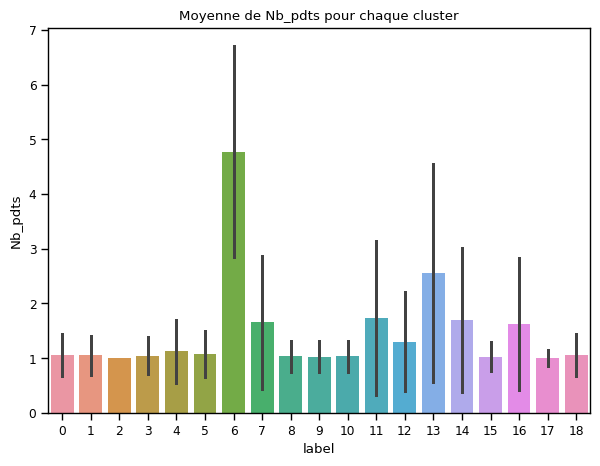

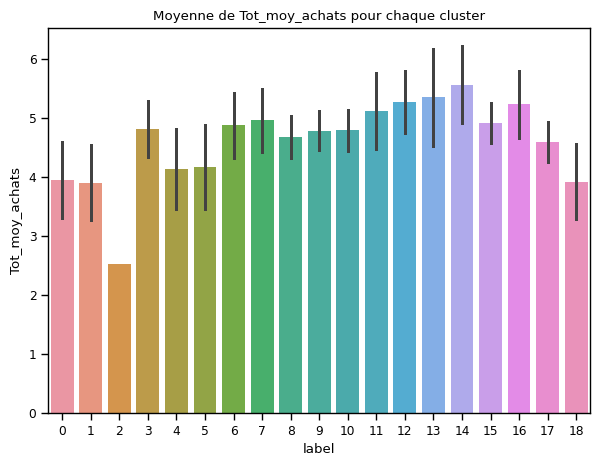

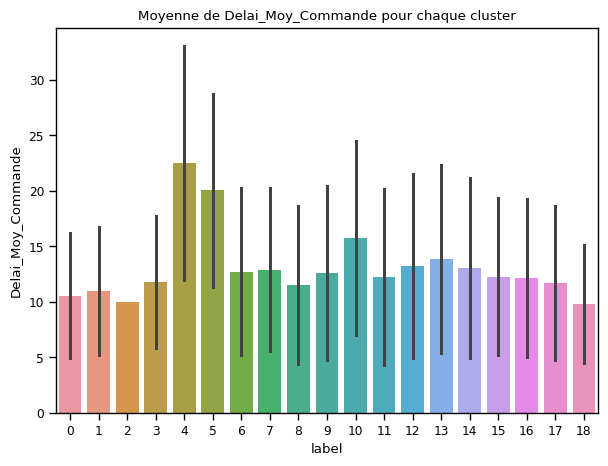

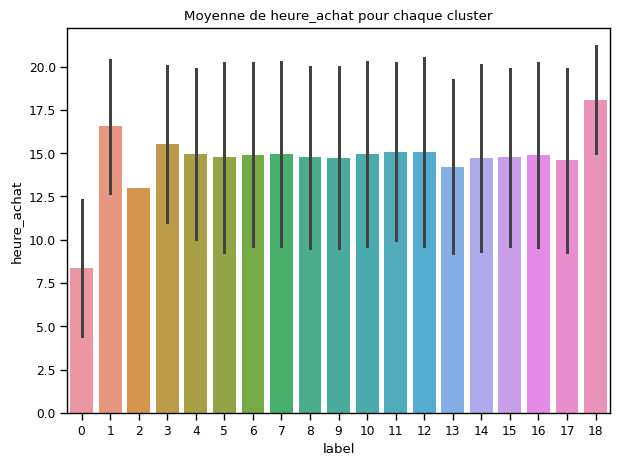

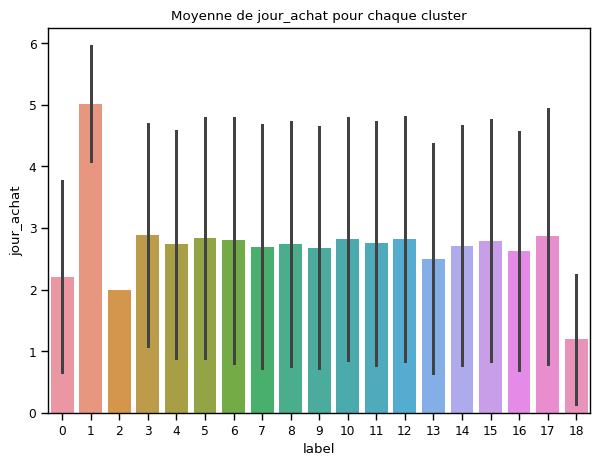

...

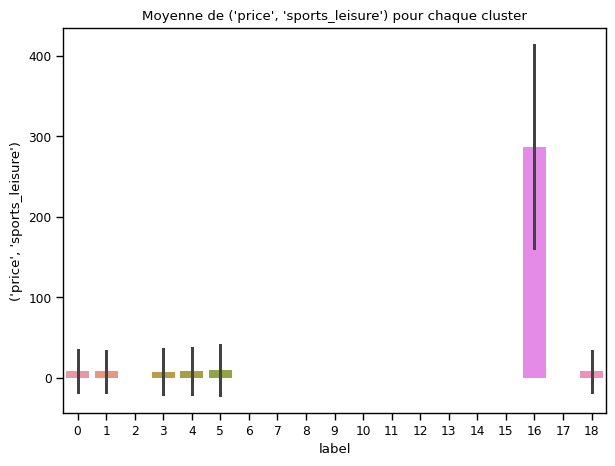

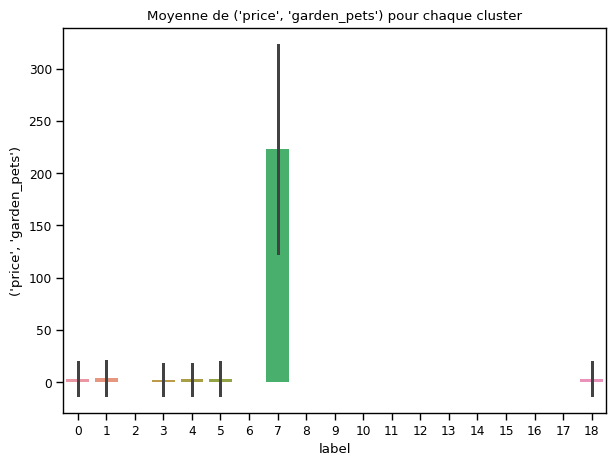

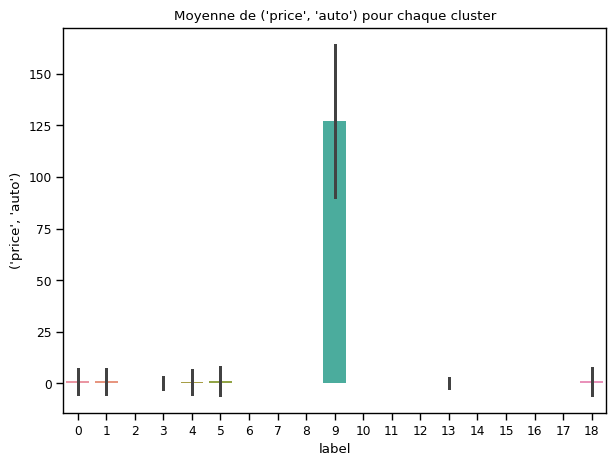

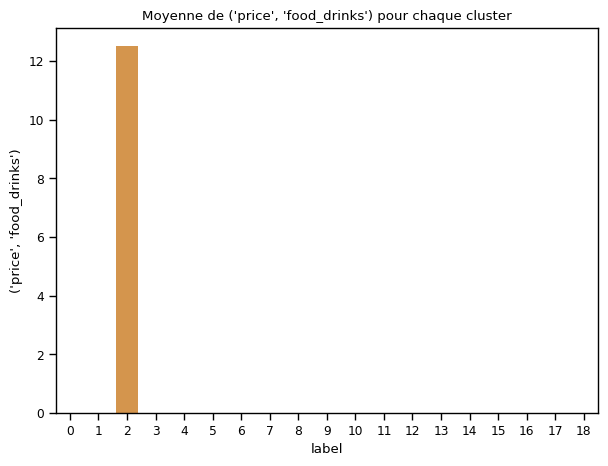

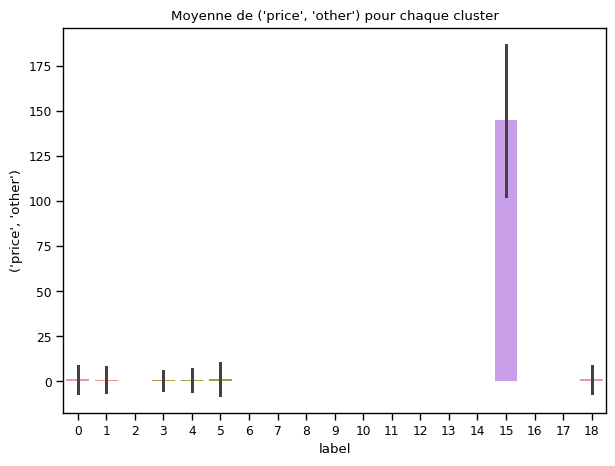

Erreur colonne :  x0_boleto
Erreur colonne :  x0_credit_card
Erreur colonne :  x0_debit_card
Erreur colonne :  x0_voucher


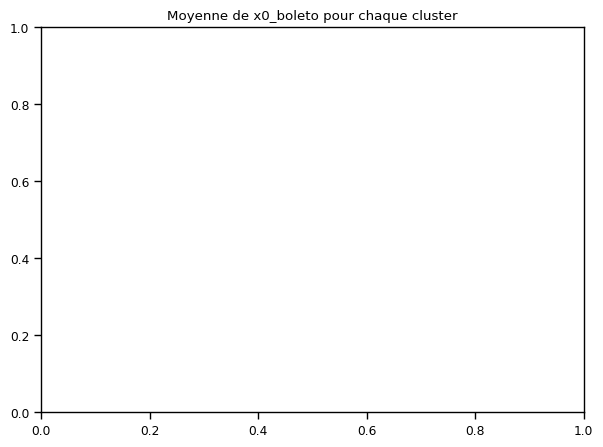

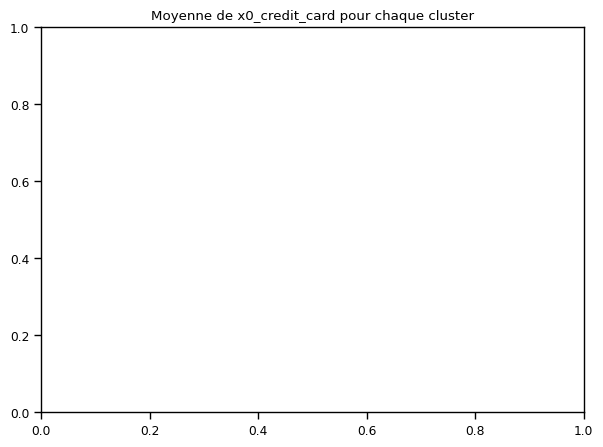

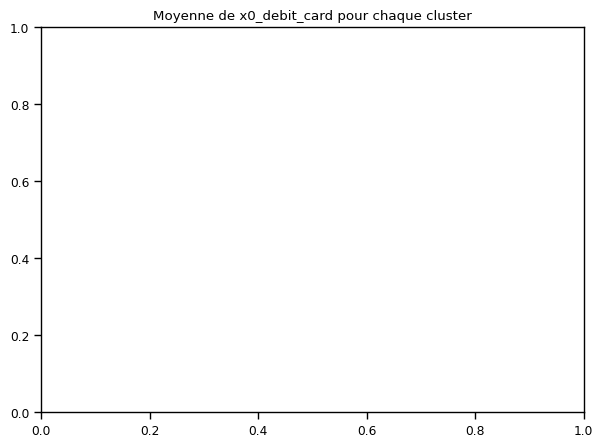

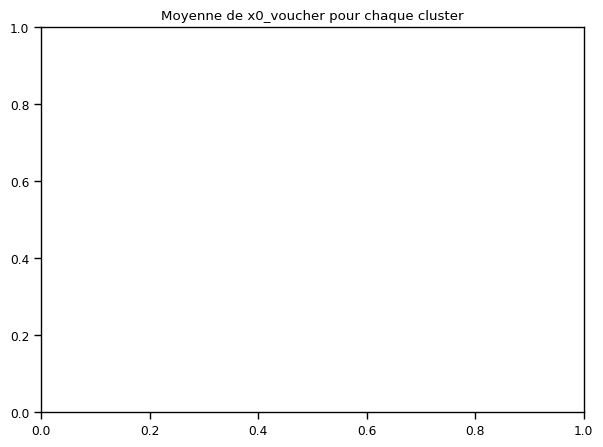

In [ ]:
# for column in group_columns.columns:
#     try:
#         plt.figure(figsize=(7,5))
#         titre = 'Moyenne de ' + str(column) + ' pour chaque cluster' 
#         plt.title(titre)
#         sns.barplot(x = 'label',
#                     y = column,
#                     data = X_tot_old, 
#                     ci="sd")
#         plt.show()
#     except:
#         print('Erreur colonne : ', column)
# Parcours de chaque colonne dans group_columns
for column in group_columns.columns:
    try:
        # Crée une nouvelle figure pour chaque colonne avec une taille de 7x5
        plt.figure(figsize=(7, 5))
        # Définit le titre de la figure comme 'Moyenne de [nom de la colonne] pour chaque cluster'
        titre = 'Moyenne de ' + str(column) + ' pour chaque cluster' 
        plt.title(titre)
        # Affiche un graphique à barres avec les clusters sur l'axe x, les valeurs moyennes de la colonne sur l'axe y,
        # en utilisant les données du DataFrame X_tot_old et en incluant un intervalle de confiance ('ci="sd"')
        sns.barplot(x='label',
                    y=column,
                    data=X_tot_old,
                    ci="sd")
        # Affiche le graphique
        plt.show()
    except:
        # Si une erreur se produit pour une colonne, affiche un message indiquant l'erreur
        print('Erreur colonne : ', column)

Ce code parcourt chaque colonne dans le DataFrame group_columns. Pour chaque colonne, il crée un graphique à barres montrant la moyenne de la colonne pour chaque cluster. Les clusters sont représentés sur l'axe des x, les valeurs moyennes de la colonne sont représentées sur l'axe des y, et l'intervalle de confiance est inclus pour montrer la variabilité des données. Le code affiche ensuite chaque graphique. S'il y a une erreur pour une colonne particulière, le code affiche un message d'erreur indiquant le nom de la colonne pour laquelle l'erreur s'est produite.

On constate que les différentes observations constatées dans le précédent clustering sont conservées, notamment:
* cat 8 : les plus dépensiers pour home et ceux qui ont acheté le plus de produits
* cat 3 : les 2e plus dépensiers et les plus dépensiers dans la catégorie électronics
* cat 2 : délai moyen de commande plus élevé que les autres et moyenne de notes commentaires plus basse que la moyenne
* pour le reste les catégories semblent représentées de façon similaire


On constate par contre que différentes valeurs évoluent sensiblement comme les notes moyennes de commentaires (de 3,1 à 3,4 par exemple pour la catégorie la moins satisfaite).
On peut 